In [6]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt 
import json
import pprint

import networkx as nx
#import nxviz as nv  
#from nxviz import annotate

### Load Cleaned Data

In [7]:
with open('reddit_reply_to_t3_1i0nukq_2.json') as f:
    data = json.load(f)

### Load Node Bot Prob

In [8]:
bot_df = pd.read_csv('reddit_averaged_bot_prob.csv')

In [9]:
bot_df[:10]

,author_fullname,botprobability,thr_50,thr_60,thr_70,thr_80,thr_90
0,t2_1001os,0.752688,True,True,True,False,False
1,t2_1001ql,0.752943,True,True,True,False,False
2,t2_1001qx,0.419376,False,False,False,False,False
3,t2_1007qfi3ai,0.086045,False,False,False,False,False
4,t2_100an3,0.752943,True,True,True,False,False
5,t2_100kw1,0.743840,True,True,True,False,False
6,t2_100o38,0.415059,False,False,False,False,False
7,t2_100qos,0.419610,False,False,False,False,False
8,t2_100wqb,0.419610,False,False,False,False,False
9,t2_1013avwpi9,0.419610,False,False,False,False,False


In [10]:
thr_50 = dict()
thr_60 = dict()
thr_70 = dict()
thr_80 = dict()
thr_90 = dict()
for index, row in bot_df.iterrows():
    thr_50[row['author_fullname']] = row['thr_50']
    thr_60[row['author_fullname']] = row['thr_60']
    thr_70[row['author_fullname']] = row['thr_70']
    thr_80[row['author_fullname']] = row['thr_80']
    thr_90[row['author_fullname']] = row['thr_90']

### Construct Edge List

In [11]:
edge_list = []
for key, values in data.items():
    iter_lst = [(key, val) for val in values]
    edge_list.extend(iter_lst)
edge_list[:10]

[('t2_9a7co', 't2_9a7co'),
 ('t2_o1jtvc6rk', 't2_o1jtvc6rk'),
 ('t2_o1jtvc6rk', 't2_5uj11eb9'),
 ('t2_o1jtvc6rk', 't2_1eb6ss9z6j'),
 ('t2_o1jtvc6rk', 't2_64ix18fn'),
 ('t2_o1jtvc6rk', 't2_vlafa4rvv'),
 ('t2_o1jtvc6rk', 't2_64ix18fn'),
 ('t2_o1jtvc6rk', 't2_64ix18fn'),
 ('t2_o1jtvc6rk', 't2_64ix18fn'),
 ('t2_o1jtvc6rk', 't2_64ix18fn')]

In [12]:
user_lst = list(data.keys())

In [13]:
len(user_lst)

1598

In [14]:
len(edge_list)

2241

In [15]:
weight_list = []
for x in set(edge_list):
    tpl = tuple(list(x) + [edge_list.count(x)])
    weight_list.append(tpl)
weight_list[:10]

[('t2_2qhwuxod', 't2_2qhwuxod', 1),
 ('t2_mii9l08v', 't2_o1jtvc6rk', 1),
 ('t2_902pz8hd', 't2_902pz8hd', 1),
 ('t2_9ybham0h', 't2_9ybham0h', 1),
 ('t2_7wtd1', 't2_j1uqud7x', 1),
 ('t2_nbg0nepj', 't2_nbg0nepj', 1),
 ('t2_7w0azxbw', 't2_7w0azxbw', 1),
 ('t2_5hc9x', 't2_5hc9x', 1),
 ('t2_bs11n1ht', 't2_bs11n1ht', 1),
 ('t2_djl7i7oz4', 't2_7jtey4js', 1)]

We can define the following function that reads in json file to reply relationship dictionary individual post and returns list of nodes and list of weighted edges:

In [16]:
def compute_node_edge(post_id):

    with open(f'reddit_reply_to_{post_id}_2.json') as f:
        reply_dict = json.load(f)

    user_lst = list(reply_dict.keys())
    weight_list = []
    edge_list = []

    for key, values in reply_dict.items():
        iter_lst = [(key, val) for val in values]
        edge_list.extend(iter_lst)

    for x in set(edge_list):
        tpl = tuple(list(x) + [edge_list.count(x)])
        weight_list.append(tpl)

    return user_lst, weight_list

In [17]:
posts = ['t3_1hwsk85', 't3_1hxstm9', 't3_1hy9y05', 't3_1hyw7g6', 't3_1hz6ake', 't3_1i0kavt', 
         't3_1i0nukq', 't3_1i3cse3', 't3_1i16xr6', 't3_1i0788c', 't3_1iazjin']

In [18]:
post_node_edge_dict = dict()
for post_id in posts:
    post_node_edge_dict[post_id] = {}
    post_node_edge_dict[post_id]['user'], post_node_edge_dict[post_id]['edge'] = compute_node_edge(post_id)

We test if the function works as expected:

In [19]:
post_node_edge_dict['t3_1i0nukq']['user'][:5]

['t2_9a7co', 't2_o1jtvc6rk', 't2_8kmztost', 't2_prtspyjr', 't2_od2zf4y0e']

In [20]:
post_node_edge_dict['t3_1i0nukq']['edge'][:5]

[('t2_2qhwuxod', 't2_2qhwuxod', 1),
 ('t2_mii9l08v', 't2_o1jtvc6rk', 1),
 ('t2_902pz8hd', 't2_902pz8hd', 1),
 ('t2_9ybham0h', 't2_9ybham0h', 1),
 ('t2_7wtd1', 't2_j1uqud7x', 1)]

Great! Now we can move on to visualizations!

### Visualize Network

In [21]:
user_lst = post_node_edge_dict['t3_1i0nukq']['user']
weight_list = post_node_edge_dict['t3_1i0nukq']['edge']

In [22]:
def add_bot_attr(graph, threshold):
    filtered = dict()
    for node in graph.nodes():
        val = threshold.get(node, False)
        if val:
            filtered[node] = 'bot'
        else:
            filtered[node] = 'human'
    nx.set_node_attributes(graph, filtered, 'botornot')

In [23]:
G1 = nx.DiGraph()
G1.add_nodes_from(user_lst)
G1.add_weighted_edges_from(weight_list)
add_bot_attr(G1, thr_70)

In [24]:
G1.nodes['t2_5x71m57p']['botornot']

'human'

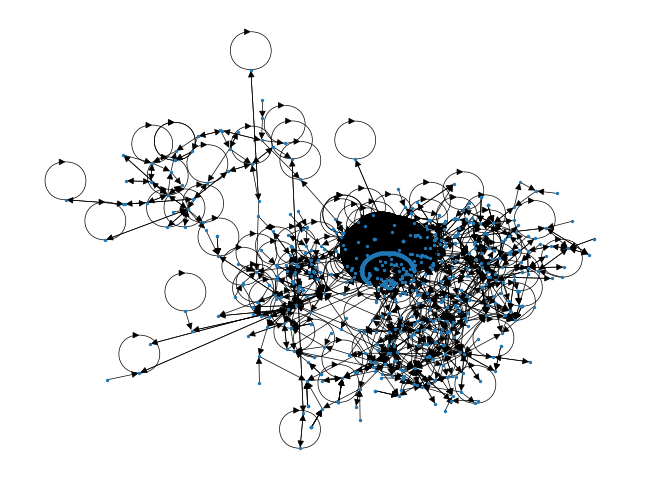

<Figure size 640x480 with 0 Axes>

In [25]:
pos = nx.kamada_kawai_layout(G1)
nx.draw(G1, pos, node_size = 2, width = 0.5)
plt.figure()
plt.show()

We can calculate some basic measures:

In [26]:
print(nx.clustering(G1))

{'t2_9a7co': 0.00909090909090909, 't2_o1jtvc6rk': 0.00044242893485233934, 't2_8kmztost': 0, 't2_prtspyjr': 0, 't2_od2zf4y0e': 0.003676470588235294, 't2_59fn4lsf': 0.02702702702702703, 't2_371x7bqn': 0, 't2_e3hu1js0': 0.03409090909090909, 't2_116bx9614x': 0, 't2_4dfhg': 0, 't2_fo1g3b0k': 0.03333333333333333, 't2_7sd48mkay': 0, 't2_11dj8d': 0, 't2_2u42pgmd': 0, 't2_6gyep': 0, 't2_11z3apb1a8': 0, 't2_12rrca38kt': 0, 't2_5udfp4z76': 0, 't2_79vbz': 0, 't2_6pbjd6qz': 0, 't2_1dumqp8nkz': 0, 't2_etwdz': 0, 't2_abrgj4lm': 0, 't2_mj9owlba': 0, 't2_176do4': 0, 't2_n2zus1uh': 0, 't2_13b40e': 0, 't2_13oxro': 0, 't2_116gof0a': 0, 't2_rib17jx3': 0, 't2_2eesorat': 0, 't2_1cmnyntzje': 0, 't2_2pswxl9n': 0, 't2_1fmd2aj7ey': 0, 't2_1975kpnbqj': 0, 't2_t7bh4': 0, 't2_3o69tu7l': 0, 't2_1aau9evwgw': 0, 't2_17f4c9aq74': 0, 't2_18pfn343z4': 0.011029411764705883, 't2_colk0rt': 0, 't2_d5a2v18': 0, 't2_i2xcbmie': 0, 't2_jp4xxyk1': 0, 't2_hcqot3sg': 0, 't2_w79k9vubv': 0, 't2_egkh1jo9': 0, 't2_2bz30iij': 0, 't2_776

In [27]:
print(nx.reciprocity(G1))

0.15760598503740647


In [28]:
nx.attribute_assortativity_coefficient(G1, 'botornot')

0.5545803351896408

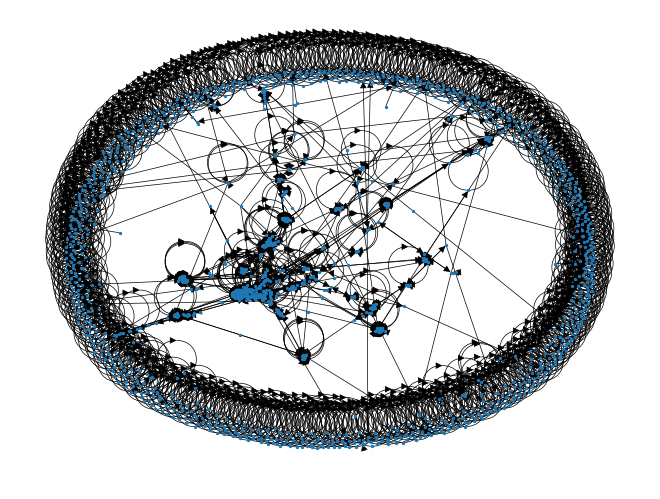

<Figure size 640x480 with 0 Axes>

In [29]:
pos = nx.spring_layout(G1, iterations=100)
nx.draw(G1, pos, node_size = 2, width = 0.5)
plt.figure()
plt.show()

In [30]:
G1.out_degree

OutDegreeView({'t2_9a7co': 1, 't2_o1jtvc6rk': 5, 't2_8kmztost': 6, 't2_prtspyjr': 3, 't2_od2zf4y0e': 5, 't2_59fn4lsf': 5, 't2_371x7bqn': 1, 't2_e3hu1js0': 2, 't2_116bx9614x': 4, 't2_4dfhg': 2, 't2_fo1g3b0k': 1, 't2_7sd48mkay': 3, 't2_11dj8d': 1, 't2_2u42pgmd': 1, 't2_6gyep': 1, 't2_11z3apb1a8': 1, 't2_12rrca38kt': 1, 't2_5udfp4z76': 1, 't2_79vbz': 1, 't2_6pbjd6qz': 1, 't2_1dumqp8nkz': 1, 't2_etwdz': 1, 't2_abrgj4lm': 1, 't2_mj9owlba': 1, 't2_176do4': 2, 't2_n2zus1uh': 3, 't2_13b40e': 1, 't2_13oxro': 1, 't2_116gof0a': 1, 't2_rib17jx3': 1, 't2_2eesorat': 1, 't2_1cmnyntzje': 1, 't2_2pswxl9n': 1, 't2_1fmd2aj7ey': 1, 't2_1975kpnbqj': 1, 't2_t7bh4': 1, 't2_3o69tu7l': 1, 't2_1aau9evwgw': 1, 't2_17f4c9aq74': 2, 't2_18pfn343z4': 3, 't2_colk0rt': 1, 't2_d5a2v18': 1, 't2_i2xcbmie': 1, 't2_jp4xxyk1': 1, 't2_hcqot3sg': 1, 't2_w79k9vubv': 1, 't2_egkh1jo9': 1, 't2_2bz30iij': 1, 't2_776mi': 1, 't2_a1miposa': 1, 't2_vjybb3bv': 1, 't2_79dsd': 1, 't2_1f3nvmbc98': 2, 't2_o487gsll8': 1, 't2_5h7me': 2, 't2_

In [31]:
betweenness_dict = nx.betweenness_centrality(G1, normalized=True, weight= None , endpoints=False, seed=0)

In [32]:
from collections import Counter

k = Counter(betweenness_dict)
 
# Finding 10 highest values
high = k.most_common(10) 
 
print("Initial Dictionary:")
print(betweenness_dict, "\n")
 
print("Dictionary with 10 highest values:")
print("Keys: Values")
 
for i in high:
    print(i[0]," :",i[1]," ", G1.nodes[i[0]]['botornot'])

Initial Dictionary:
{'t2_9a7co': 0.0, 't2_o1jtvc6rk': 0.009088340701393334, 't2_8kmztost': 0.0036108849273865343, 't2_prtspyjr': 0.0012223717342357346, 't2_od2zf4y0e': 0.0011293076897154629, 't2_59fn4lsf': 0.00045571993169295054, 't2_371x7bqn': 0.0, 't2_e3hu1js0': 0.00041457582779977787, 't2_116bx9614x': 0.0018346351850269944, 't2_4dfhg': 0.00019416098551492433, 't2_fo1g3b0k': 0.0, 't2_7sd48mkay': 4.114410389317266e-05, 't2_11dj8d': 0.0, 't2_2u42pgmd': 0.0, 't2_6gyep': 0.0, 't2_11z3apb1a8': 0.0, 't2_12rrca38kt': 0.0, 't2_5udfp4z76': 0.0, 't2_79vbz': 0.0, 't2_6pbjd6qz': 0.0, 't2_1dumqp8nkz': 0.0, 't2_etwdz': 0.0, 't2_abrgj4lm': 0.0, 't2_mj9owlba': 0.0, 't2_176do4': 0.0, 't2_n2zus1uh': 3.918486085064063e-07, 't2_13b40e': 0.0, 't2_13oxro': 0.0, 't2_116gof0a': 0.0, 't2_rib17jx3': 0.0, 't2_2eesorat': 0.0, 't2_1cmnyntzje': 0.0, 't2_2pswxl9n': 0.0, 't2_1fmd2aj7ey': 0.0, 't2_1975kpnbqj': 0.0, 't2_t7bh4': 0.0, 't2_3o69tu7l': 0.0, 't2_1aau9evwgw': 0.0, 't2_17f4c9aq74': 1.5673944340256252e-06, 't

In [33]:
def top_betweenness(graph):
    betweenness_dict = nx.betweenness_centrality(graph, normalized=True, weight= None, endpoints=False, seed=10000001)
    k = Counter(betweenness_dict)
    high = k.most_common(10) 
    print("Initial Dictionary:")
    print(betweenness_dict, "\n")
 
    print("Dictionary with 10 highest values:")
    print("Keys: Values")
 
    for i in high:
        print(i[0]," :",i[1]," ", graph.nodes[i[0]]['botornot'])

In [34]:
from collections import defaultdict

In [35]:
#out degree
def plot_network_outdegree(post_id, dictionary, bot_classification, min_degree=1, seed=10000001):
    # Set random seed for reproducibility
    np.random.seed(seed)

    user_lst = dictionary[post_id]['user']
    weight_list = dictionary[post_id]['edge']

    # Create directed network graph from node list and weighted edge list
    G = nx.DiGraph()
    G.add_nodes_from(user_lst)
    G.add_weighted_edges_from(weight_list) # Create a directed graph
    add_bot_attr(G, bot_classification)

    #G.remove_edges_from(list(G.selfloop_edges()))
    G.remove_edges_from([(u, v) for u, v in G.edges() if u == v])
    
    # Calculate node in-degrees and out-degrees
    in_degrees = dict(G.in_degree())
    out_degrees = dict(G.out_degree())

    print(in_degrees)
    print(out_degrees)
    
    # Filter nodes based on degree (keeping all nodes as requested)
    # Note: We keep min_degree parameter for flexibility, but default to 0
    nodes_to_remove = [node for node, degree in out_degrees.items() if degree < min_degree]
    G.remove_nodes_from(nodes_to_remove)
    
        
    max_in_degree = max(in_degrees.values())
    max_out_degree = max(out_degrees.values())
    
    # Keep original node size calculation, but introduce a min_size to ensure visibility
    min_size = 200  # Minimum node size
    normalized_in_degrees = {node: max(min_size, (deg / max_in_degree) * 800)
                             for node, deg in in_degrees.items()}
    normalized_out_degrees = {node: max(min_size, (deg / max_out_degree) * 800)
                             for node, deg in out_degrees.items()}
    
    # Get node colors based on bot classification
    node_colors = []
    for node in G.nodes():
        try:
            if bot_classification[node]:
                node_colors.append('Red')  # Bots are red
            else:
                node_colors.append('Green')  # Non-bots are green
        except KeyError:
            # If node not in classification dict, use a default color
            node_colors.append('gray')
    
    # Create the plot
    plt.figure(figsize=(14, 14))  # Larger figure for better visibility
    
    # Choose layout with more space
    #pos = nx.spring_layout(G, k=None, iterations=100)
    pos = nx.kamada_kawai_layout(G, scale = 10)
    
    # Draw the edges first
    nx.draw_networkx_edges(G, 
                          pos=pos, 
                          edge_color="darkgrey", 
                          width=0.5,
                          alpha=0.6, 
                          arrows=True)  # Draw arrows to indicate direction
    
    # Draw the nodes
    nx.draw_networkx_nodes(G,
                          pos=pos,
                          node_color=node_colors,
                          node_size=[normalized_out_degrees.get(node, 0) for node in G.nodes()],
                          alpha=0.8)
    
    # Draw labels with a positioning strategy that avoids covering nodes
    # Calculate offset based on node size
    label_pos = {}
    for node in G.nodes():
        # Position labels to the right of nodes
        base_pos = pos[node]
        node_size_factor = normalized_out_degrees.get(node, 0) / 10000  # Scale factor
        offset = max(0.05, node_size_factor * 0.1)  # Min offset of 0.05
        label_pos[node] = (base_pos[0] + offset, base_pos[1])
    
    nx.draw_networkx_labels(G, 
                           label_pos, 
                           font_size=8,
                           font_color="black",
                           font_weight="bold",
                           horizontalalignment='left',
                           bbox={"facecolor": "white", 
                                 "edgecolor": "none",
                                 "alpha": 0.7,
                                 "pad": 0.2})
    
    # Add a legend
    green_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Not Bot')
    orange_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Bot')
    plt.legend(handles=[green_patch, orange_patch], loc='upper right', fontsize=12)
    
    plt.title(f"Bot Network for {post_id} using Out-degree (min degree = {min_degree})", fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    
    return G, plt


In [36]:
#out degree adjusted by fixing the additional indegree of self loop
def plot_network_outdegree2(post_id, dictionary, bot_classification, min_degree=1, seed=10000001):
    # Set random seed for reproducibility
    np.random.seed(seed)

    user_lst = dictionary[post_id]['user']
    weight_list = dictionary[post_id]['edge']

    # Create directed network graph from node list and weighted edge list
    G = nx.DiGraph()
    G.add_nodes_from(user_lst)
    G.add_weighted_edges_from(weight_list) # Create a directed graph
    add_bot_attr(G, bot_classification)
      
    # Calculate node in-degrees and out-degrees

    # Initialize degree dictionaries
    in_degrees = defaultdict(int)
    out_degrees = defaultdict(int)
    print(dict(G.in_degree(weight="weight")))
    print(dict(G.out_degree(weight="weight")))

    for node in G.nodes():
    # Calculate sum of weighted in-degree and out-degree
        in_degree = G.in_degree(node, weight="weight") # Standard calculation
        out_degree = G.out_degree(node, weight="weight") # Standard calculation
        
    
        # Adjust for self-loops
        if G.has_edge(node, node):  
            self_loop_weight = G[node][node]["weight"]  # Get self-loop weight
            in_degree -= self_loop_weight  # Remove self-loop 
        
    
        # Adjust for self-loops
        if G.has_edge(node, node):  
            self_loop_weight = 1  # Get self-loop weight
            in_degree -= self_loop_weight  # Remove self-loop 
    

        in_degrees[node] = max(in_degree, 0)
        out_degrees[node] = out_degree
    print(in_degrees)
    print(out_degrees)

    #G.remove_edges_from(list(G.selfloop_edges()))
    G.remove_edges_from([(u, v) for u, v in G.edges() if u == v])
    
    # Filter nodes based on degree (keeping all nodes as requested)
    # Note: We keep min_degree parameter for flexibility, but default to 0
    nodes_to_remove = [node for node, degree in out_degrees.items() if degree < min_degree]
    G.remove_nodes_from(nodes_to_remove)
    
        
    max_in_degree = max(in_degrees.values(),default=1)
    max_out_degree = max(out_degrees.values(),default=1)
    
    # Keep original node size calculation, but introduce a min_size to ensure visibility
    min_size = 200  # Minimum node size
    normalized_in_degrees = {node: max(min_size, (deg / max_in_degree) * 800)
                             for node, deg in in_degrees.items()}
    normalized_out_degrees = {node: max(min_size, (deg / max_out_degree) * 800)
                             for node, deg in out_degrees.items()}
    
    # Get node colors based on bot classification
    node_colors = []
    for node in G.nodes():
        try:
            if bot_classification[node]:
                node_colors.append('Red')  # Bots are red
            else:
                node_colors.append('Green')  # Non-bots are green
        except KeyError:
            # If node not in classification dict, use a default color
            node_colors.append('gray')
    
    # Create the plot
    plt.figure(figsize=(14, 14))  # Larger figure for better visibility
    
    # Choose layout with more space
    #pos = nx.spring_layout(G, k=None, iterations=100)
    pos = nx.kamada_kawai_layout(G, scale = 10)
    
    # Draw the edges first
    nx.draw_networkx_edges(G, 
                          pos=pos, 
                          edge_color="darkgrey", 
                          width=0.5,
                          alpha=0.6, 
                          arrows=True)  # Draw arrows to indicate direction
    
    # Draw the nodes
    nx.draw_networkx_nodes(G,
                          pos=pos,
                          node_color=node_colors,
                          node_size=[(normalized_in_degrees.get(node, 0)+ normalized_out_degrees.get(node, 0)) * 0.5 for node in G.nodes()],
                          alpha=0.8)
    
    # Draw labels with a positioning strategy that avoids covering nodes
    # Calculate offset based on node size
    label_pos = {}
    for node in G.nodes():
        # Position labels to the right of nodes
        base_pos = pos[node]
        node_size_factor = normalized_out_degrees.get(node, 0) / 10000  # Scale factor
        offset = max(0.05, node_size_factor * 0.1)  # Min offset of 0.05
        label_pos[node] = (base_pos[0] + offset, base_pos[1])
    
    nx.draw_networkx_labels(G, 
                           label_pos, 
                           font_size=8,
                           font_color="black",
                           font_weight="bold",
                           horizontalalignment='left',
                           bbox={"facecolor": "white", 
                                 "edgecolor": "none",
                                 "alpha": 0.7,
                                 "pad": 0.2})
    
    # Add a legend
    green_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Not Bot')
    orange_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Bot')
    plt.legend(handles=[green_patch, orange_patch], loc='upper right', fontsize=12)
    
    plt.title(f"Bot Network for {post_id} using Out-degree (min degree = {min_degree})", fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    
    return G, plt

In [64]:
#total degree
def plot_network_totaldegree(post_id, dictionary, bot_classification, min_degree=1, seed=10000001):
    # Set random seed for reproducibility
    np.random.seed(seed)
    
    user_lst = dictionary[post_id]['user']
    weight_list = dictionary[post_id]['edge']

    # Create directed network graph from node list and weighted edge list
    G = nx.DiGraph()
    G.add_nodes_from(user_lst)
    G.add_weighted_edges_from(weight_list) # Create a directed graph
    add_bot_attr(G, bot_classification)

    # Remove self-loops and isolate edges
    G.remove_edges_from([(u, v) for u, v in G.edges() if u == v])
    
    # Calculate node in-degrees and out-degrees
    # Initialize degree dictionaries
    in_degrees = defaultdict(int)
    out_degrees = defaultdict(int)
    print(dict(G.in_degree(weight="weight")))
    print(dict(G.out_degree(weight="weight")))

    for node in G.nodes():
    # Calculate sum of weighted in-degree and out-degree
        in_degree = G.in_degree(node, weight="weight") # Standard calculation
        out_degree = G.out_degree(node, weight="weight") # Standard calculation
        
    
        # Adjust for self-loops
        if G.has_edge(node, node):  
            self_loop_weight = G[node][node]["weight"]  # Get self-loop weight
            in_degree -= self_loop_weight  # Remove self-loop 
        
    
        # Adjust for self-loops
        if G.has_edge(node, node):  
            self_loop_weight = 1  # Get self-loop weight
            in_degree -= self_loop_weight  # Remove self-loop 
    

        in_degrees[node] = max(in_degree, 0)
        out_degrees[node] = out_degree
        
    # Calculate total degrees
    total_degrees = {node: in_degrees[node] + out_degrees[node] for node in G.nodes()}
    
    # Filter nodes based on total degree
    nodes_to_remove = [node for node, degree in total_degrees.items() if degree < min_degree]
    G.remove_nodes_from(nodes_to_remove)
    
    max_total_degree = max(total_degrees.values())
    
    # Normalize node sizes based on total degree
    min_size = 200  # Minimum node size
    normalized_total_degrees = {node: max(min_size, (deg / max_total_degree) * 800)
                                for node, deg in total_degrees.items()}
    
    # Get node colors based on bot classification
    node_colors = []
    for node in G.nodes():
        try:
            if bot_classification[node]:
                node_colors.append('Red')  # Bots are red
            else:
                node_colors.append('Green')  # Non-bots are green
        except KeyError:
            # If node not in classification dict, use a default color
            node_colors.append('gray')
    
    # Create the plot
    plt.figure(figsize=(14, 14))  # Larger figure for better visibility
    
    pos = nx.kamada_kawai_layout(G, scale = 10)
    
    # Draw the edges first
    nx.draw_networkx_edges(G, 
                          pos=pos, 
                          edge_color="darkgrey", 
                          width=0.5,
                          alpha=0.6, 
                          arrows=True)  # Draw arrows to indicate direction
    
    # Draw the nodes
    nx.draw_networkx_nodes(G,
                          pos=pos,
                          node_color=node_colors,
                          node_size=[normalized_total_degrees.get(node, 0) for node in G.nodes()],
                          alpha=0.8)
    
    # Draw labels with a positioning strategy that avoids covering nodes
    label_pos = {}
    for node in G.nodes():
        base_pos = pos[node]
        node_size_factor = normalized_total_degrees.get(node, 0) / 10000  # Scale factor
        offset = max(0.05, node_size_factor * 0.1)  # Min offset of 0.05
        label_pos[node] = (base_pos[0] + offset, base_pos[1])
    
    nx.draw_networkx_labels(G, 
                           label_pos, 
                           font_size=8,
                           font_color="black",
                           font_weight="bold",
                           horizontalalignment='left',
                           bbox={"facecolor": "white", 
                                 "edgecolor": "none",
                                 "alpha": 0.7,
                                 "pad": 0.2})
    
    # Add a legend
    green_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Not Bot')
    orange_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Bot')
    plt.legend(handles=[green_patch, orange_patch], loc='upper right', fontsize=12)
    
    plt.title(f"Bot Network for {post_id} using Total degree (min degree = {min_degree})", fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    
    return G, plt


In [38]:
def plot_network_indegree(post_id, dictionary, bot_classification, min_degree=1, seed=10000001):
    # Set random seed for reproducibility
    np.random.seed(seed)
    
    user_lst = dictionary[post_id]['user']
    weight_list = dictionary[post_id]['edge']

    # Create directed network graph from node list and weighted edge list
    G = nx.DiGraph()
    G.add_nodes_from(user_lst)
    G.add_weighted_edges_from(weight_list) # Create a directed graph
    add_bot_attr(G, bot_classification)

    #G.remove_edges_from(list(G.selfloop_edges()))
    G.remove_edges_from([(u, v) for u, v in G.edges() if u == v])
    
    # Calculate node in-degrees and out-degrees
    in_degrees = dict(G.in_degree())
    out_degrees = dict(G.out_degree())
    
    # Filter nodes based on degree (keeping all nodes as requested)
    # Note: We keep min_degree parameter for flexibility, but default to 0
    nodes_to_remove = [node for node, degree in in_degrees.items() if degree < min_degree]
    G.remove_nodes_from(nodes_to_remove)
        
    max_in_degree = max(in_degrees.values())
    max_out_degree = max(out_degrees.values())
    
    # Keep original node size calculation, but introduce a min_size to ensure visibility
    min_size = 200  # Minimum node size
    normalized_in_degrees = {node: max(min_size, (deg / max_in_degree) * 800)
                             for node, deg in in_degrees.items()}
    normalized_out_degrees = {node: max(min_size, (deg / max_out_degree) * 800)
                             for node, deg in out_degrees.items()}
    
    # Get node colors based on bot classification
    node_colors = []
    for node in G.nodes():
        try:
            if bot_classification[node]:
                node_colors.append('Red')  # Bots are red
            else:
                node_colors.append('Green')  # Non-bots are green
        except KeyError:
            # If node not in classification dict, use a default color
            node_colors.append('gray')
    
    # Create the plot
    plt.figure(figsize=(14, 14))  # Larger figure for better visibility
    
    # Choose layout with more space
    pos = nx.kamada_kawai_layout(G, scale = 10)
    
    # Draw the edges first
    nx.draw_networkx_edges(G, 
                          pos=pos, 
                          edge_color="darkgrey", 
                          width=0.5,
                          alpha=0.6, 
                          arrows=True)  # Draw arrows to indicate direction
    
    # Draw the nodes
    nx.draw_networkx_nodes(G,
                          pos=pos,
                          node_color=node_colors,
                          node_size=[normalized_in_degrees.get(node, 0) for node in G.nodes()],
                          alpha=0.8)
    
    # Draw labels with a positioning strategy that avoids covering nodes
    # Calculate offset based on node size
    label_pos = {}
    for node in G.nodes():
        # Position labels to the right of nodes
        base_pos = pos[node]
        node_size_factor = normalized_in_degrees.get(node, 0) / 10000  # Scale factor
        offset = max(0.05, node_size_factor * 0.1)  # Min offset of 0.05
        label_pos[node] = (base_pos[0] + offset, base_pos[1])
    
    nx.draw_networkx_labels(G, 
                           label_pos, 
                           font_size=8,
                           font_color="black",
                           font_weight="bold",
                           horizontalalignment='left',
                           bbox={"facecolor": "white", 
                                 "edgecolor": "none",
                                 "alpha": 0.7,
                                 "pad": 0.2})
    
    # Add a legend
    green_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Not Bot')
    orange_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Bot')
    plt.legend(handles=[green_patch, orange_patch], loc='upper right', fontsize=12)
    
    plt.title(f"Bot Network for {post_id} using In-degree (min degree = {min_degree})", fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    
    return G, plt

{'t2_12i5fn4j0r': 42, 't2_vubljqn9': 43, 't2_adxr5': 12, 't2_ojs8w74': 4, 't2_na5dsk0f': 3, 't2_4dfhg': 5, 't2_keblrri9t': 8, 't2_9kzqt': 2, 't2_70ckk': 2, 't2_3a3lu': 2, 't2_67wqo': 9, 't2_4wbuk': 5, 't2_gs9xd': 1, 't2_18egcjjdxn': 2, 't2_xkmak': 4, 't2_u3kqaqz1': 4, 't2_bioea': 1, 't2_huleu': 1, 't2_7p3pi': 3, 't2_8ye1l': 2, 't2_j0ccf': 1, 't2_ky0fs2b': 1, 't2_3m0ag9v5': 4, 't2_1e10jvxmbw': 3, 't2_38odh6sg': 2, 't2_ly1jx6fh': 1, 't2_rqfg8': 1, 't2_13k3hb4a': 1, 't2_6mjdc': 1, 't2_1berc8z9ri': 1, 't2_68yxeh75': 1, 't2_b1a2y': 1, 't2_13py6km7nl': 2, 't2_crquu': 2, 't2_44xc7': 3, 't2_567cea9z': 2, 't2_f393m': 1, 't2_1chtgw6cdd': 1, 't2_9450jcss': 5, 't2_4supi': 1, 't2_4zx6r': 3, 't2_5nd108ku': 1, 't2_zazbful': 1, 't2_5zkh8': 1, 't2_7e0qs1qd': 2, 't2_18x2to8pqk': 1, 't2_g2zfxrrv': 1, 't2_bvqonxdl': 1, 't2_3phy73da': 1, 't2_xnpdatmb1': 1, 't2_33k9c': 1, 't2_er58b': 1, 't2_89gps': 1, 't2_781yk': 1, 't2_58m84eyc': 1, 't2_7wstz5t7': 1, 't2_s1s07vw1': 1, 't2_14p6a3': 1, 't2_55evw': 1, 't2_nl6

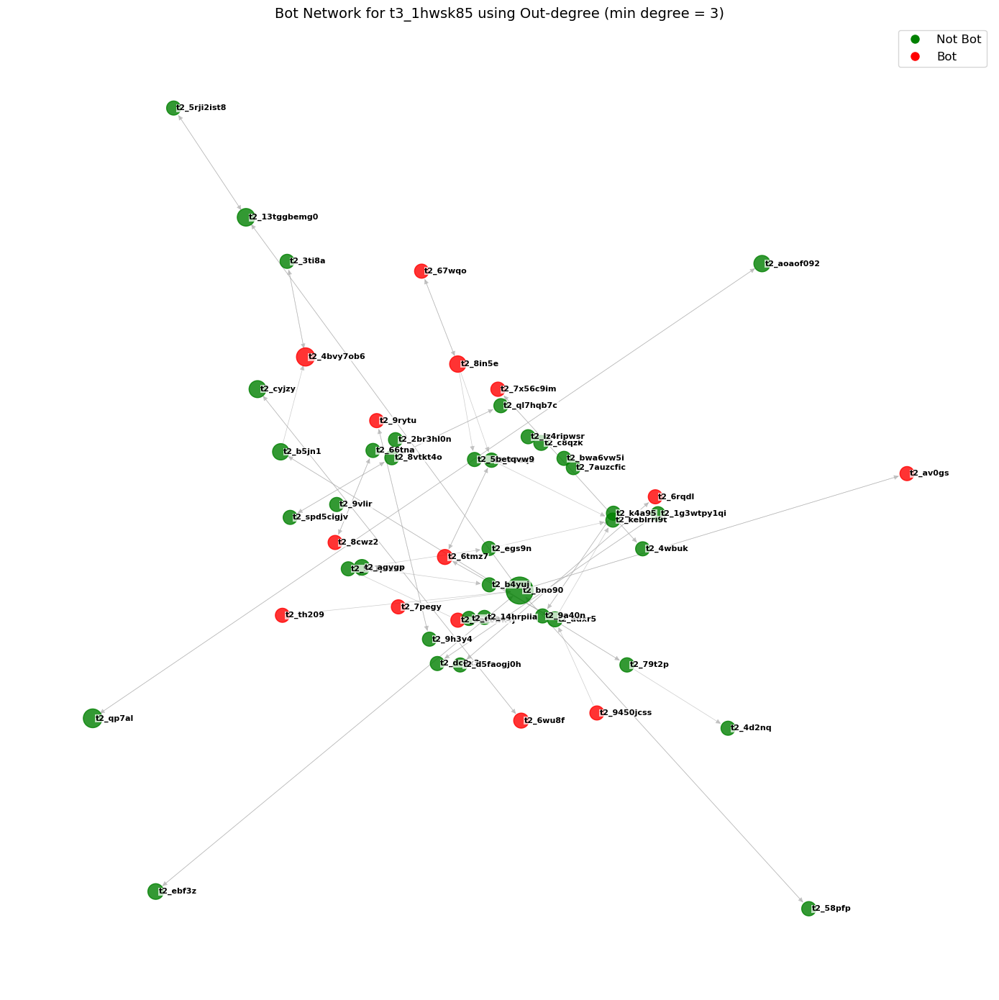

{'t2_13ukpn': 19, 't2_im1ux': 7, 't2_121wgh': 4, 't2_1ucdyz24': 7, 't2_gurm88im9': 4, 't2_68petbf': 6, 't2_by2pkeg5': 11, 't2_3m3eahlf': 3, 't2_ws7vi': 2, 't2_15kymi': 2, 't2_smnf25jk': 1, 't2_4t6f7tlv': 3, 't2_4vcqw': 2, 't2_mszm7evf': 1, 't2_2r7qtout': 1, 't2_2tiuylz8': 1, 't2_mk4ltkhj': 5, 't2_75x9jj4b': 2, 't2_4oufi3tq': 1, 't2_txctg': 2, 't2_5bquyiq5': 3, 't2_ukw10agn': 1, 't2_u34t0': 1, 't2_n5kx8': 1, 't2_26csy6b0': 1, 't2_v3m5yd5qp': 2, 't2_2q8eiong': 1, 't2_xqiujx': 1, 't2_18yi6w01mo': 2, 't2_16wk09zwh7': 2, 't2_f7on95e74': 2, 't2_2yi87': 1, 't2_eyrod': 1, 't2_ah4a59jjj': 1, 't2_ccxotavb': 1, 't2_4g2ov5dt6': 1, 't2_602u2bs6': 1, 't2_76bjyurw': 1, 't2_hy7r4qgn': 1, 't2_5wb6ygdg': 2, 't2_8po2v': 1, 't2_yxayuungs': 1, 't2_8goac': 1, 't2_fe4i9': 1, 't2_55m1eb16': 1, 't2_6we2dm': 2, 't2_dyqhci3n': 1, 't2_2h7zeox2': 1, 't2_5yrr3rzp': 1, 't2_1dqtay92e3': 1, 't2_3spvaxpl': 1, 't2_gtyis': 1, 't2_sxvl5oj': 1, 't2_47o13': 1, 't2_15oytn': 2, 't2_kfupo': 1, 't2_4itai': 1, 't2_2q5gxeac': 1, 

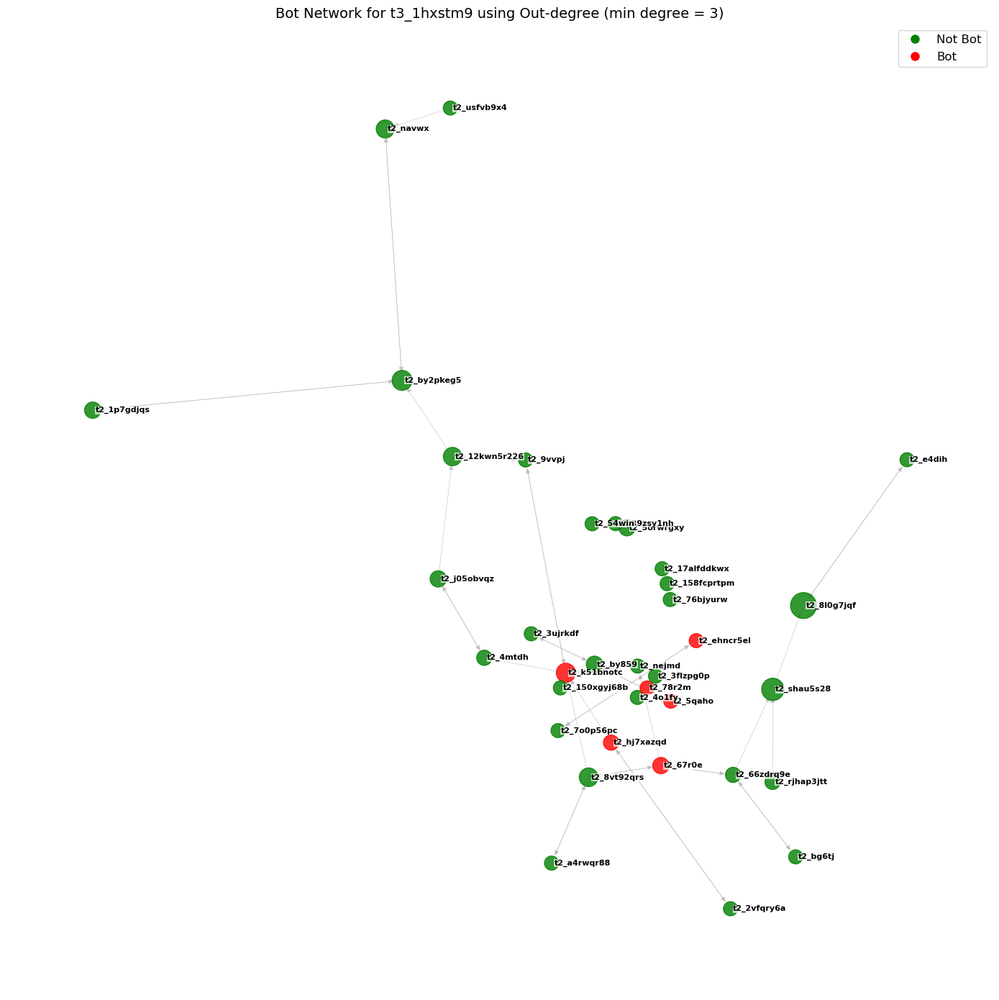

{'t2_lst66ur1': 5, 't2_2n48qjyu': 2, 't2_17f9e0pzj5': 3, 't2_xwl04xr9n': 2, 't2_15iyfhs017': 2, 't2_16f1is': 3, 't2_160u2g': 3, 't2_32gkguod': 6, 't2_l5w44in2': 2, 't2_893lfmel': 3, 't2_xwfvpcw': 2, 't2_9hykhbp8': 2, 't2_5h7n767h': 4, 't2_jjg3h': 2, 't2_tkfvnsmlc': 5, 't2_vxzt02yo': 3, 't2_21pou9l': 2, 't2_1dzen99sdg': 2, 't2_5vr45fj2': 2, 't2_5lj3fq27': 2, 't2_d40fzrfu': 1, 't2_18u6fvusrw': 2, 't2_sultjd6s': 1, 't2_dxrkv1fd': 2, 't2_jlldtrd6': 2, 't2_79l7v9h8': 2, 't2_xfe1h2g': 1, 't2_xdl2n': 2, 't2_oxvof62q': 3, 't2_3zqldkbh': 2, 't2_mrcrj0wmk': 1, 't2_7om79qj0': 1, 't2_o956zmg4': 1, 't2_ckx6uty6o': 2, 't2_bmgizsy0': 2, 't2_jkhwr850': 2, 't2_3wehk7rd': 1, 't2_70yoxszm6': 1, 't2_qwemm5tt9': 1, 't2_pmlho37n': 2, 't2_15lwqo': 3, 't2_aezy3neo': 1, 't2_18ielpwp4d': 1, 't2_qmuqabfk': 2, 't2_4p6vqu0z': 2, 't2_1e94970msg': 1, 't2_z4gns': 2, 't2_fdt7ejht': 2, 't2_11dqwk2ty9': 2, 't2_u1rad4nn': 2, 't2_58vju': 1, 't2_d9cki85': 2, 't2_32nncwf3': 3, 't2_uexwl3ebu': 2, 't2_25956vvb': 2, 't2_u9x7d'

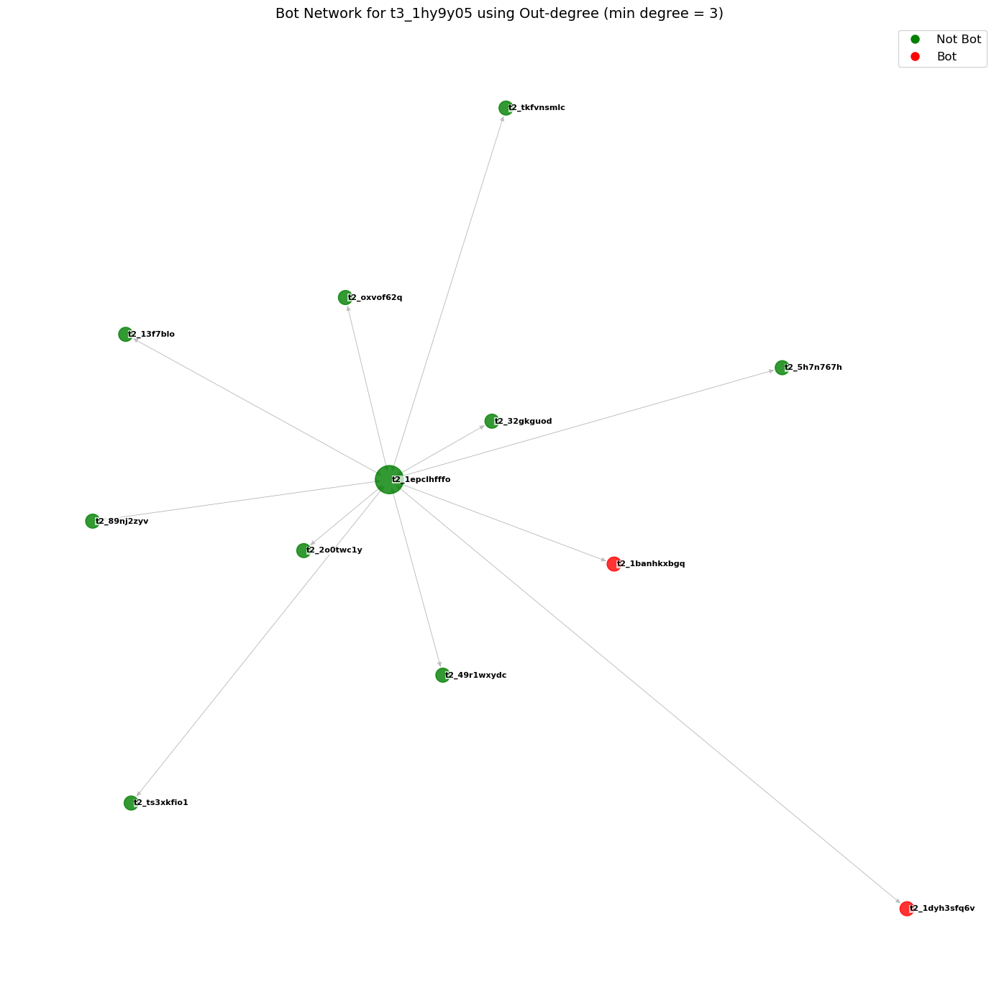

{'t2_ecc7w': 53, 't2_1l0vba': 5, 't2_3zjmkw4o': 1, 't2_12qxit': 4, 't2_5nvr3': 2, 't2_7mr4cit64': 1, 't2_3v43v': 4, 't2_9q1uyk0x': 21, 't2_avixr': 5, 't2_y766d5u': 1, 't2_1rcyp6dn': 1, 't2_4bdn7': 1, 't2_6hn4qx80': 2, 't2_4ewh6': 2, 't2_650y4': 3, 't2_l71t9wx': 2, 't2_218nwxgu': 1, 't2_5wc9j': 2, 't2_1dcfngcq': 2, 't2_a505e2et': 1, 't2_13n7xt': 1, 't2_swmu0': 2, 't2_52pll': 1, 't2_5bmil': 2, 't2_1ei1ktx': 1, 't2_767ka': 2, 't2_3khg3rlc': 1, 't2_p7lpi': 1, 't2_fhm4r4mx': 2, 't2_c8q59qv8': 1, 't2_d54dq': 2, 't2_bpo6v': 1, 't2_rekwy': 13, 't2_o6l86408b': 1, 't2_d2wo3ejh': 1, 't2_qrb8r0j6y': 1, 't2_nz02fnk2o': 1, 't2_6pj2yd0': 1, 't2_l3t535ex': 1, 't2_em8gh': 3, 't2_alr25': 2, 't2_bob60jxc': 3, 't2_6giv23h9y': 2, 't2_uiuvv': 3, 't2_hn17g': 12, 't2_1yw3ltzu': 1, 't2_3d6zu3t5': 1, 't2_148ktz': 1, 't2_16w2v6mlhn': 1, 't2_7qgo7': 1, 't2_ow9nx': 1, 't2_3w75p': 1, 't2_6241x': 1, 't2_dtohn': 1, 't2_ch74j': 1, 't2_165uj0z3': 1, 't2_c4b7j': 1, 't2_l4k8xo8q': 5, 't2_17bslo': 1, 't2_1j6w0hj': 2, 't2_

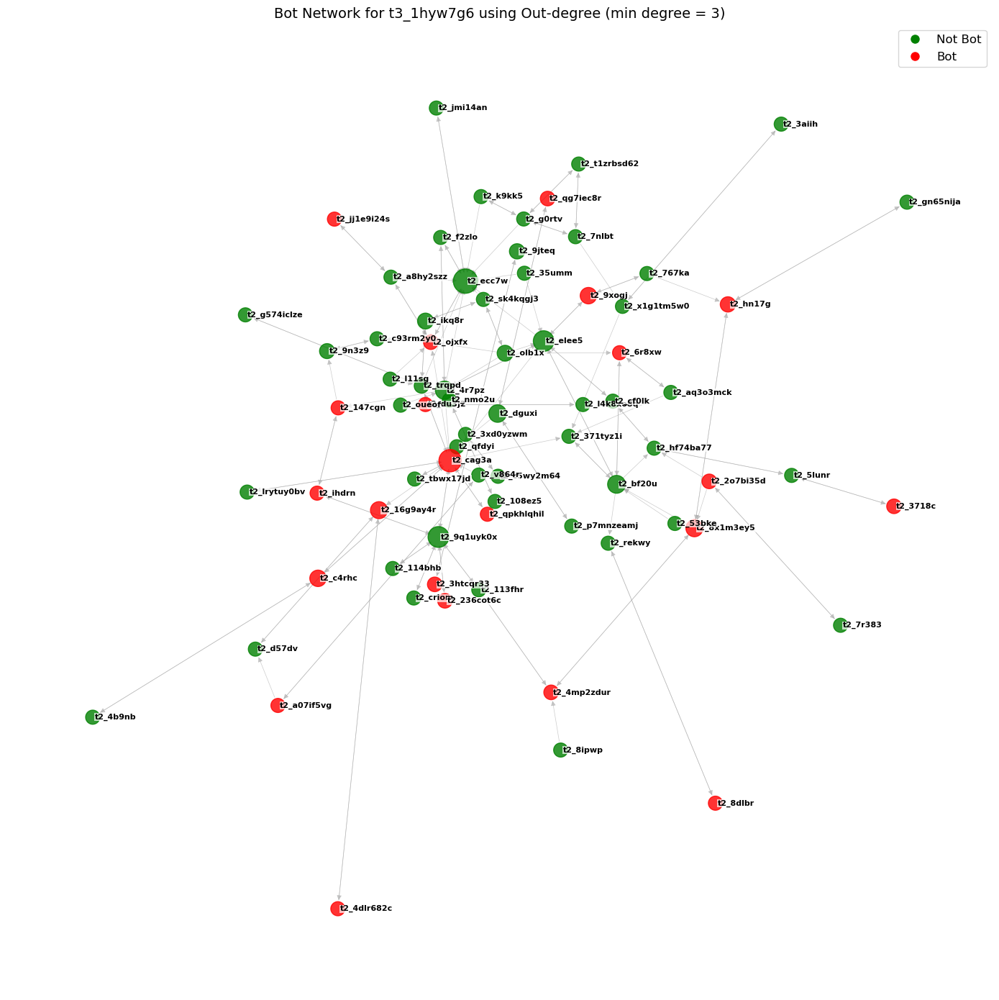

{'t2_6l4z3': 1, 't2_plvww': 12, 't2_6ukxd': 11, 't2_k0sbp8pz': 3, 't2_7wmiopsf4': 7, 't2_f8v6n0zj': 6, 't2_icyud': 1, 't2_15s5hcu81d': 5, 't2_8imsb17d': 1, 't2_10pf5w0le5': 1, 't2_14wxhyqazl': 2, 't2_10v3xjdwdd': 1, 't2_dr5du': 1, 't2_2s4woazg': 1, 't2_69ze0': 1, 't2_i8it29o3l': 1, 't2_fyp1imtd': 1, 't2_ndr2td0dc': 1, 't2_nr14f': 1, 't2_mfmiqla22': 1, 't2_ehak41hm': 1, 't2_a1tqd5ma': 1, 't2_9hsa9': 1, 't2_4ypo88tb': 1, 't2_56owtbyx': 2, 't2_icl7w7pn': 2, 't2_rludimgw': 1, 't2_4gs5znzy': 1, 't2_afxzr': 3, 't2_197dnp15qi': 1, 't2_dxqther': 1, 't2_10x8pu': 1, 't2_gxmxo': 1, 't2_ans20': 1, 't2_apn520u6': 1, 't2_4b9npav7': 2, 't2_hunlr': 1, 't2_c3sne': 1, 't2_vev1awb6': 1, 't2_fsfdaovz': 1, 't2_1h8xt4lq': 1, 't2_9qanp1i8': 1, 't2_5lbbdr': 1, 't2_rlyjt': 2, 't2_15bb4frzo0': 1, 't2_69fjabj9c': 1, 't2_21j7t6y3': 1, 't2_7nf48tie': 1, 't2_72bqj': 1, 't2_dxzas': 1, 't2_4yfgdsif': 2, 't2_ry0cgbxa': 1, 't2_3e149iyf': 1, 't2_f76ttszm2': 1, 't2_uv3oss1q': 1, 't2_1btsw06h4b': 1, 't2_m82oo': 1, 't2_emh

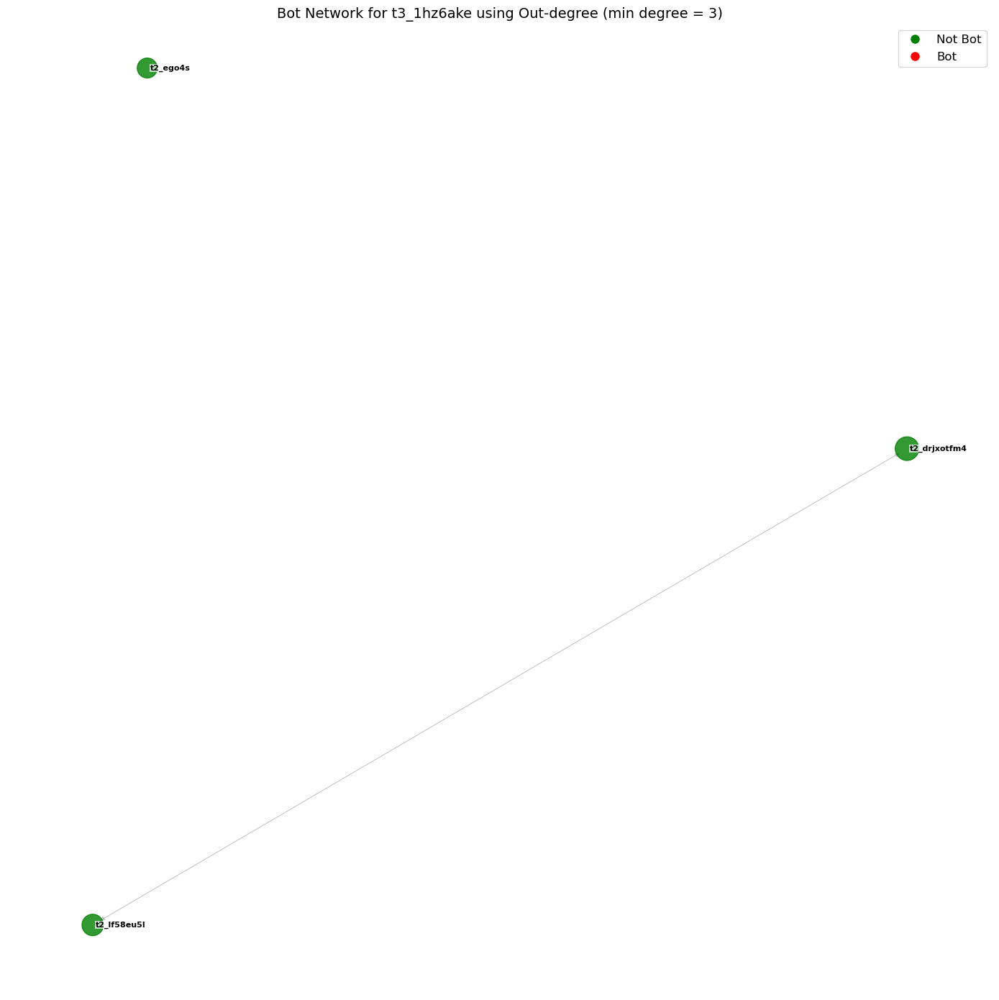

{'t2_2hm6l94u': 38, 't2_8c75msq': 2, 't2_11lqath1sd': 6, 't2_6jjfisov': 13, 't2_ywpe6': 3, 't2_mrac3': 4, 't2_8o3os8pc': 1, 't2_fye6mmnl': 3, 't2_ijns0q0bv': 4, 't2_dcwr0xg9': 3, 't2_r4zx1zd1': 28, 't2_529clyuc': 1, 't2_11zqzk7x': 1, 't2_wcju0': 2, 't2_8k7gtrxr': 2, 't2_77z69vs1': 1, 't2_j50z5dp': 1, 't2_1dfu0dqmov': 1, 't2_7l9h2': 1, 't2_13th02cuo1': 1, 't2_uh2csqey': 2, 't2_1gw2bgkj': 1, 't2_8auqm': 1, 't2_14tajf36tc': 1, 't2_5d28c': 1, 't2_8qrpiv2p': 1, 't2_ovfjc': 5, 't2_f6intmekt': 1, 't2_9hsa9': 1, 't2_jh569dbd': 1, 't2_4jpseeo4': 2, 't2_eguq47ox': 2, 't2_4q4x5zs': 1, 't2_15dg2mbfai': 1, 't2_z0jzv': 1, 't2_jw21j': 3, 't2_1zq3l5hc': 1, 't2_xw1gg4uog': 1, 't2_s2vk2': 2, 't2_rzbbn': 1, 't2_fahtc': 1, 't2_8uf07': 1, 't2_99fib1pp': 1, 't2_qblsw': 1, 't2_itxct': 1, 't2_jqf7r1q2': 1, 't2_z99j654jx': 2, 't2_313te97b': 1, 't2_srt4qy53j': 1, 't2_4zecl64u': 1, 't2_1jx9qny': 1, 't2_43uuq9m0': 1, 't2_95h74': 1, 't2_vnv2ofa2': 1, 't2_p7ed8': 1, 't2_13q8br': 1, 't2_q003c4u': 1, 't2_91trkf5y': 1

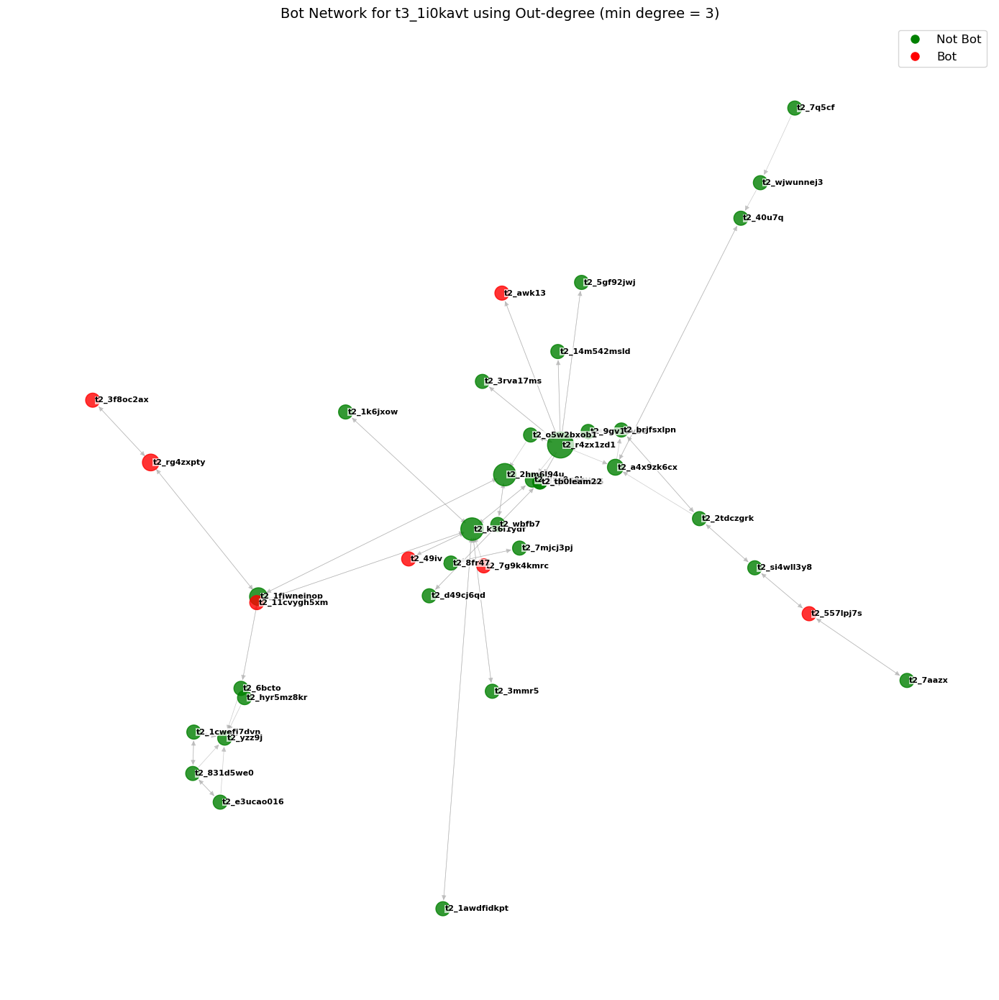

{'t2_9a7co': 12, 't2_o1jtvc6rk': 141, 't2_8kmztost': 22, 't2_prtspyjr': 13, 't2_od2zf4y0e': 23, 't2_59fn4lsf': 11, 't2_371x7bqn': 7, 't2_e3hu1js0': 11, 't2_116bx9614x': 14, 't2_4dfhg': 9, 't2_fo1g3b0k': 7, 't2_7sd48mkay': 4, 't2_11dj8d': 3, 't2_2u42pgmd': 4, 't2_6gyep': 3, 't2_11z3apb1a8': 1, 't2_12rrca38kt': 1, 't2_5udfp4z76': 1, 't2_79vbz': 2, 't2_6pbjd6qz': 1, 't2_1dumqp8nkz': 1, 't2_etwdz': 1, 't2_abrgj4lm': 1, 't2_mj9owlba': 1, 't2_176do4': 2, 't2_n2zus1uh': 3, 't2_13b40e': 2, 't2_13oxro': 1, 't2_116gof0a': 2, 't2_rib17jx3': 1, 't2_2eesorat': 1, 't2_1cmnyntzje': 1, 't2_2pswxl9n': 1, 't2_1fmd2aj7ey': 2, 't2_1975kpnbqj': 1, 't2_t7bh4': 1, 't2_3o69tu7l': 1, 't2_1aau9evwgw': 1, 't2_17f4c9aq74': 4, 't2_18pfn343z4': 16, 't2_colk0rt': 1, 't2_d5a2v18': 2, 't2_i2xcbmie': 2, 't2_jp4xxyk1': 1, 't2_hcqot3sg': 1, 't2_w79k9vubv': 2, 't2_egkh1jo9': 1, 't2_2bz30iij': 1, 't2_776mi': 1, 't2_a1miposa': 1, 't2_vjybb3bv': 1, 't2_79dsd': 1, 't2_1f3nvmbc98': 3, 't2_o487gsll8': 3, 't2_5h7me': 4, 't2_tyhm

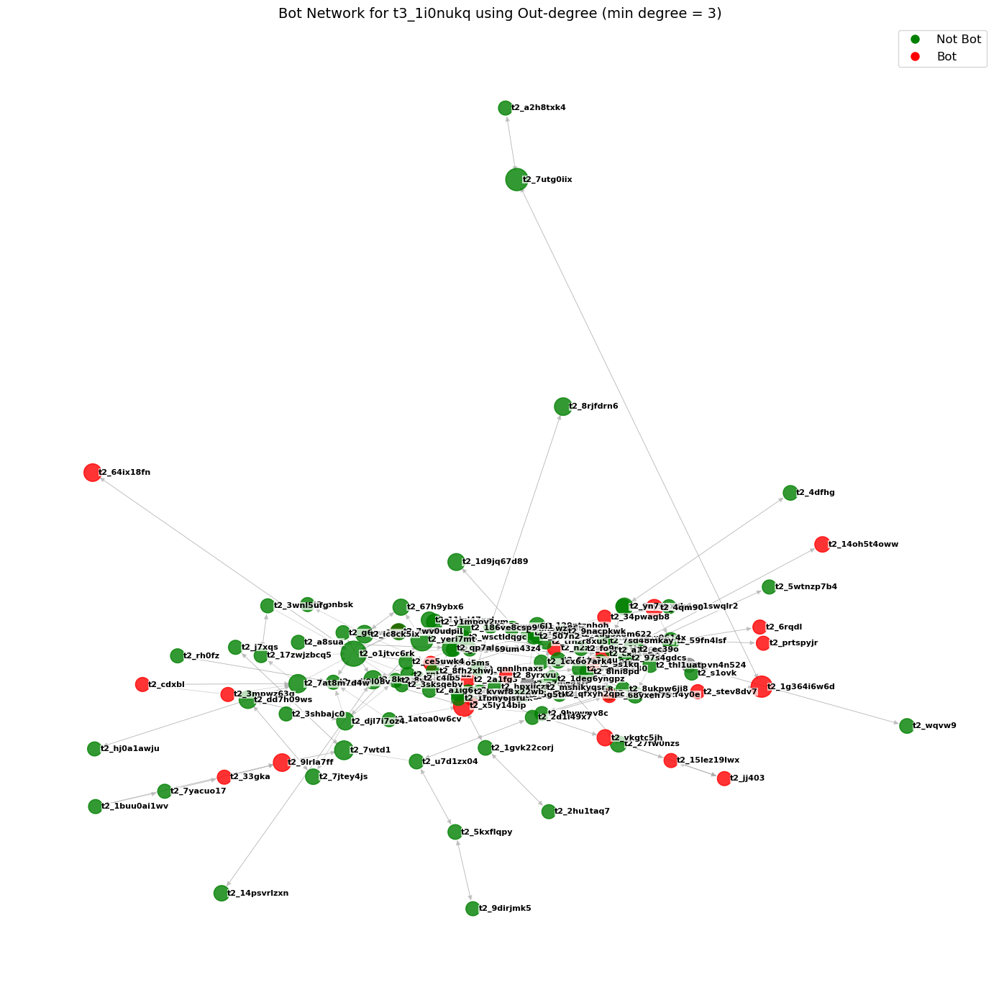

{'t2_6l4z3': 1, 't2_1h42onjnug': 11, 't2_dr7y0h07': 5, 't2_31w1rcsu': 2, 't2_4ldtogws': 4, 't2_prbvrxr': 3, 't2_gonun': 1, 't2_rpb21mm8': 3, 't2_bpo6v': 1, 't2_oxjgr43v': 1, 't2_drecbdui': 1, 't2_1gl5us8d7b': 1, 't2_gi0xmmyw0': 1, 't2_1bgte3d4ps': 1, 't2_169r0rw08c': 1, 't2_73llfqd65': 1, 't2_4pjag3e9': 1, 't2_nqmosf0': 1, 't2_vktega53i': 1, 't2_8o7mjvfg': 2, 't2_2oz90mp9': 1, 't2_16fd4kxz': 1, 't2_69f4t7rz': 1, 't2_11aaqx': 1, 't2_ddzdm9z': 1, 't2_7rbg8khg': 2, 't2_axztdlrn1': 2, 't2_537n5': 1, 't2_74kn00uc': 1, 't2_jn5zd': 1, 't2_5dyv4weal': 1, 't2_52hlhcnz': 1, 't2_gtcbc3w2': 1, 't2_uf5q6y9q': 1, 't2_bf0260og': 2, 't2_haznvsd2i': 1, 't2_mixcq': 1, 't2_163d5spq2y': 1, 't2_e3t1rruxd': 1, 't2_35kegbwy': 1, 't2_114es8': 1, 't2_9npzi9tn': 1, 't2_4kcdupsv': 1, 't2_4ggmogl4': 1, 't2_5zqzqgjp': 1, 't2_dzbzllta': 1, 't2_ha146sbb': 1, 't2_o90cqlqod': 1, 't2_3w3ziec5': 1, 't2_5iyuvp81': 1, 't2_7yvlnmhh': 1, 't2_e8vvk094': 1, 't2_1e2lttozxg': 1, 't2_344e6': 1, 't2_1rcgh8qo': 1, 't2_q0cg2nl1': 1

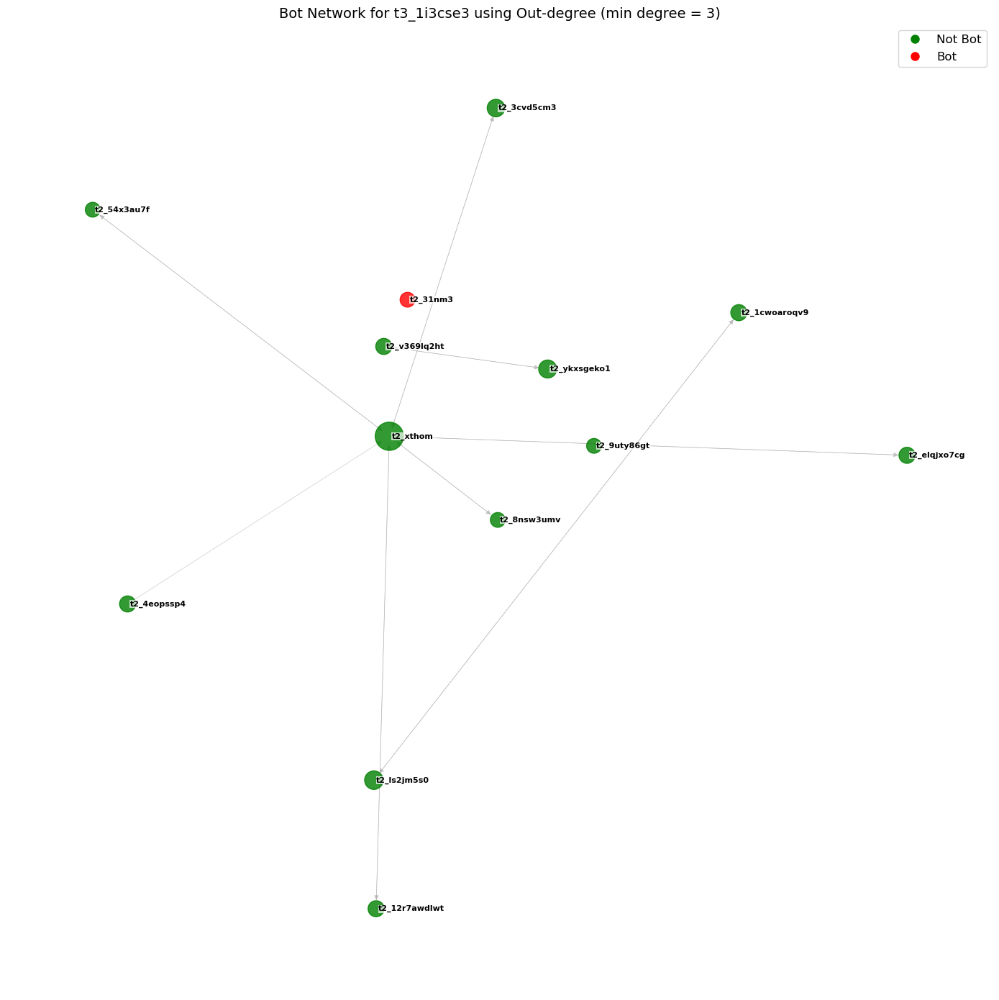

{'t2_h9aqbsp1': 9, 't2_6ulap': 6, 't2_1fwpskfj3y': 17, 't2_7emuegbu': 10, 't2_obz7t6y7': 26, 't2_vlayp58o': 12, 't2_5s58msd': 7, 't2_syd5q': 2, 't2_5rnlo': 13, 't2_n3q0vl0s': 4, 't2_1f2goz6': 6, 't2_a93pu': 6, 't2_4ratgjqk': 3, 't2_86y99zkn': 2, 't2_dqynd4hu4': 1, 't2_oahgo7ga': 4, 't2_ordru': 1, 't2_h4she3vn': 3, 't2_d3fc8ncr1': 2, 't2_fb5m5e8d': 1, 't2_9ow0iuoh': 5, 't2_c9vdpri': 1, 't2_63qaxnx5': 1, 't2_2qghqjiy': 5, 't2_af4ji': 1, 't2_7akg3m7o': 1, 't2_sfpiyt3cx': 3, 't2_1tsmt85': 1, 't2_85o8wwhw': 1, 't2_bnrxnhmz': 1, 't2_euwn5rbb': 1, 't2_kqts1h4l': 5, 't2_dn20dl20': 8, 't2_mkc5jzyh': 1, 't2_7lo5bfi1t': 1, 't2_qc5vb0c2p': 1, 't2_u4brg60jx': 1, 't2_4dnf46z7': 1, 't2_2evqxmvn': 1, 't2_1yeklykq': 2, 't2_qdy66o7z': 1, 't2_l150h339m': 1, 't2_w3se1l1ka': 1, 't2_sah6kffv': 1, 't2_nrbzd74ne': 1, 't2_6ex1ennr': 1, 't2_t6o0ht3f': 1, 't2_vozpenh6': 1, 't2_jnhu3yjwh': 1, 't2_3g2y4dni': 1, 't2_l0kgv91t8': 1, 't2_cgut16bn': 1, 't2_kr0qv': 2, 't2_1djr0zww89': 1, 't2_2yqnf81q': 1, 't2_5b0k9': 1,

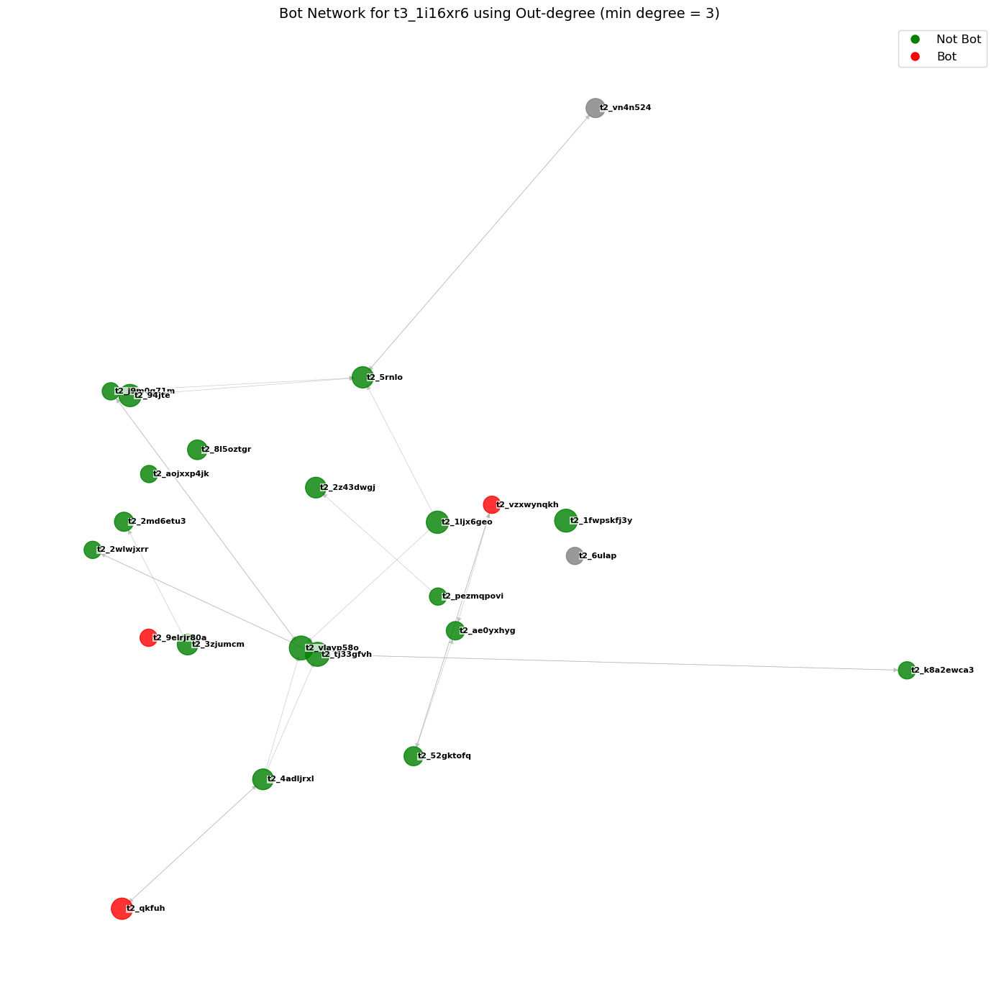

{'t2_wkhi0': 28, 't2_50qwilia': 6, 't2_g1wkr9ko': 17, 't2_8srss1tc': 4, 't2_7ux5p': 5, 't2_wgljp07ri': 1, 't2_68mk8': 22, 't2_rtcbcez3': 8, 't2_2r1n0yxy': 2, 't2_aog27': 2, 't2_eifhr289': 1, 't2_144qck6tre': 3, 't2_lfdvu17vy': 1, 't2_qpcs3vvhd': 4, 't2_fti29y3o': 1, 't2_9h50mel': 3, 't2_92qbwui4': 2, 't2_tp9fy': 9, 't2_8tywtppt': 1, 't2_1nowo3j': 2, 't2_eyrod': 1, 't2_76mb7eq3': 1, 't2_5rsphnm2': 1, 't2_6mu64070': 1, 't2_n9z98': 1, 't2_9912r298': 2, 't2_do78j': 1, 't2_3fnnq6ko': 1, 't2_a85m5': 2, 't2_s3f499yjv': 3, 't2_nua64h1i': 1, 't2_81g46187': 1, 't2_zb1rv': 1, 't2_4k1c42mc': 2, 't2_lfhd09gr': 4, 't2_rfpnw99': 7, 't2_i1c74g9s': 3, 't2_92qevfxw': 1, 't2_6wlzuqt1': 1, 't2_5q4ag1dd': 1, 't2_iobqbnqy': 1, 't2_t3sp5fuo': 1, 't2_gcuayagi': 1, 't2_al89sybsc': 1, 't2_19jbf1ux4c': 1, 't2_7m12dfc': 1, 't2_hhp2y': 1, 't2_t5iuv3gq': 1, 't2_dkpu7tlu': 1, 't2_126xgv': 1, 't2_13jfic': 1, 't2_17y8zpefr5': 1, 't2_pey8n': 1, 't2_aq4jl': 1, 't2_alv7u7l0t': 4, 't2_vn1azq0j0': 1, 't2_108c2006ct': 3, 't

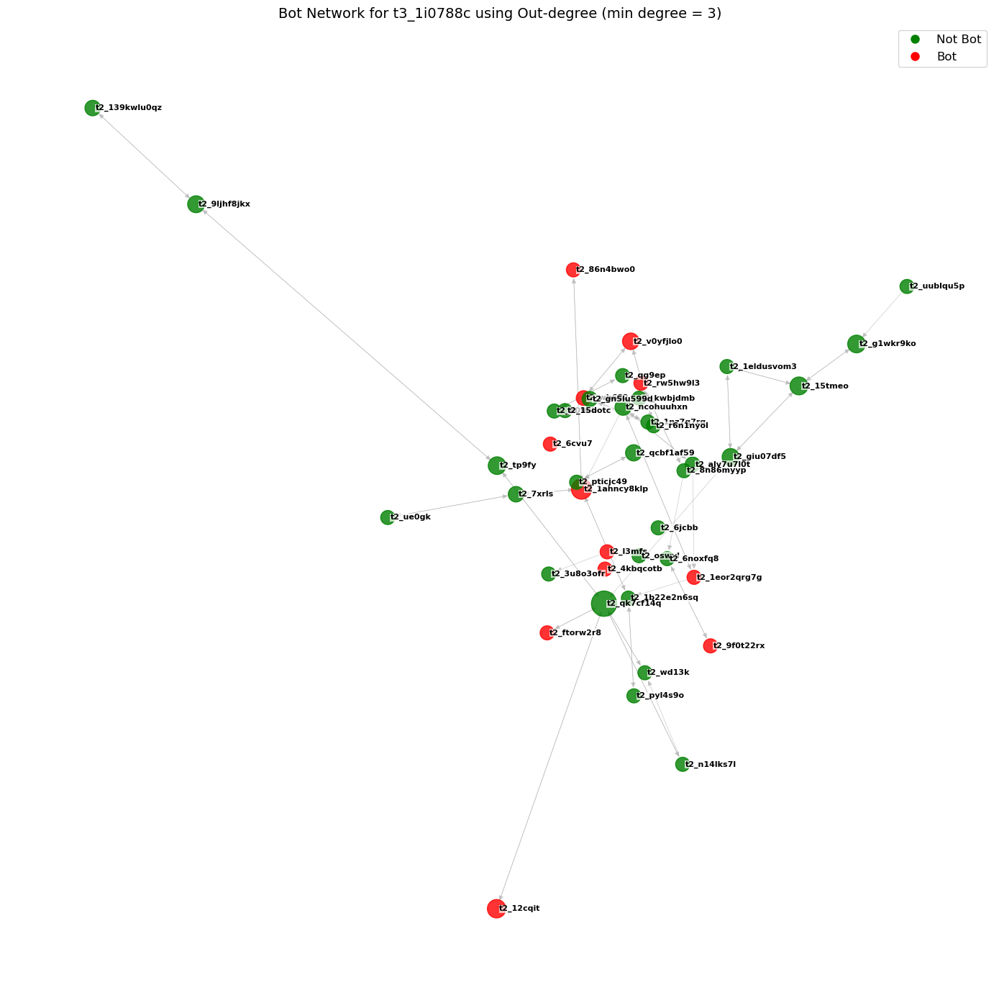

{'t2_mm7m0ccve': 9, 't2_oxub5tnr': 46, 't2_1kbebmiu': 14, 't2_9ourbvb': 39, 't2_u67rd0zep': 13, 't2_29iwtb62': 15, 't2_1cdvprap1d': 4, 't2_v9d2cnx4': 15, 't2_nhku54oy5': 19, 't2_tfejom8gc': 1, 't2_42gedjvv': 1, 't2_4140kyai': 7, 't2_sz3xedst': 2, 't2_ruj6avkh': 3, 't2_xntys': 2, 't2_5uvd2idm': 3, 't2_7bsnr8w3': 2, 't2_zyey9': 5, 't2_10ixnsyzhm': 1, 't2_w0eb509c': 3, 't2_9qth8gzn': 2, 't2_bl7qvhzk': 2, 't2_671ljczt': 6, 't2_smf1qihpc': 4, 't2_c9aojh9p': 2, 't2_1anqfaaqto': 3, 't2_4e3xjlq1': 2, 't2_ye3baij': 1, 't2_3iob4q00': 10, 't2_1hhsklhfbg': 4, 't2_umh9m4c3v': 1, 't2_84qqvx0z': 2, 't2_1fnw083m1x': 2, 't2_elqzuzmq': 2, 't2_brfo7sxm9': 5, 't2_vdi1zksh6': 1, 't2_70v8vmo': 2, 't2_et93i6rsc': 9, 't2_d7gp4qlt': 1, 't2_3vb2c4gt': 2, 't2_bl1o74cv': 2, 't2_896vsymd': 1, 't2_4w1o340l': 1, 't2_b9dm7kvp': 1, 't2_j6asa': 2, 't2_14pmw7diy5': 1, 't2_62dwji3e': 1, 't2_4ukze5bs': 1, 't2_afb7thbk': 1, 't2_l39uj5h5': 1, 't2_1idz8kov': 1, 't2_83x6mavq': 1, 't2_is0q0ow18': 1, 't2_129v6w95jh': 1, 't2_9lw

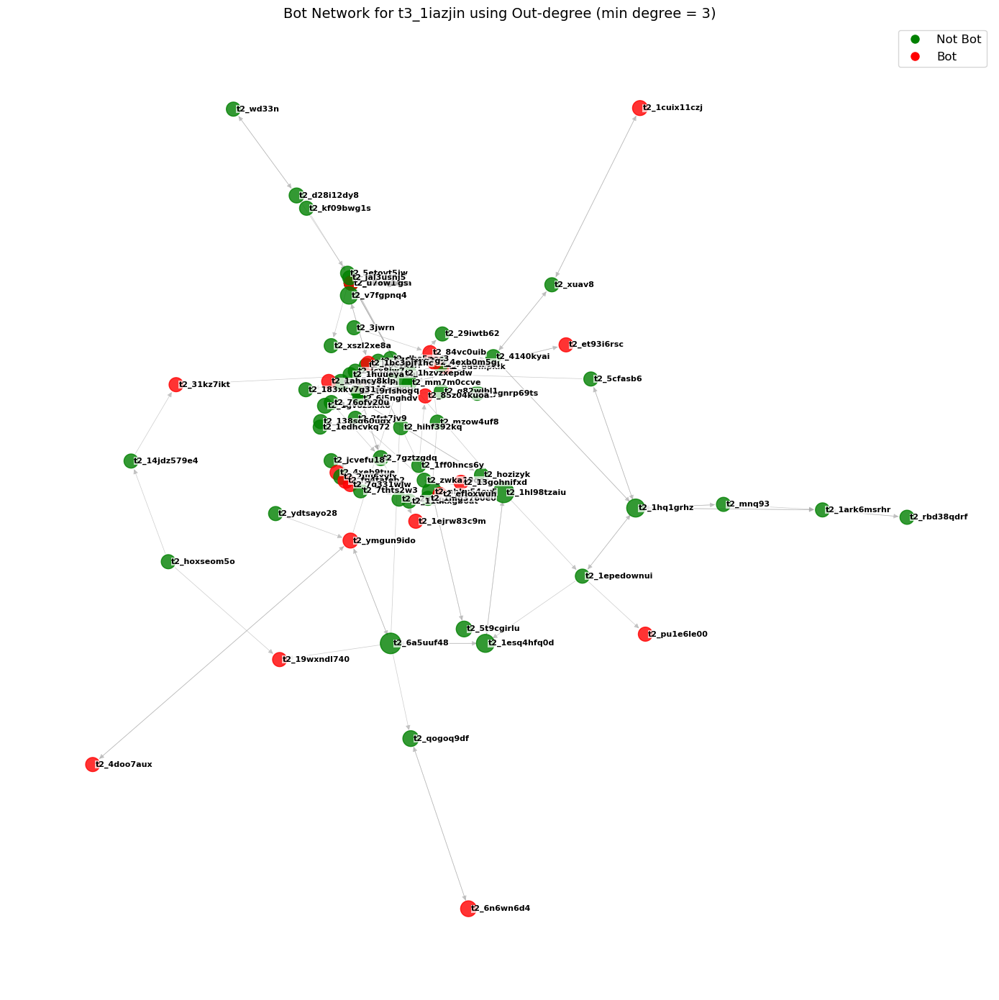

In [39]:
for post in posts:
    G, plot = plot_network_outdegree2(post, post_node_edge_dict, thr_70, min_degree = 3)
    top_betweenness(G)
    plot.show()

Initial Dictionary:
{'t2_12i5fn4j0r': 0.0, 't2_vubljqn9': 0.0, 't2_adxr5': 0.01038961038961039, 't2_ojs8w74': 0.0, 't2_4dfhg': 0.007792207792207792, 't2_keblrri9t': 0.0, 't2_67wqo': 0.01038961038961039, 't2_4wbuk': 0.0, 't2_xkmak': 0.0, 't2_u3kqaqz1': 0.0, 't2_3m0ag9v5': 0.0, 't2_9450jcss': 0.0, 't2_167b1szk0w': 0.0, 't2_6bcb2': 0.001948051948051948, 't2_4bvy7ob6': 0.0, 't2_ql7hqb7c': 0.0, 't2_absgv': 0.0, 't2_5qpqw': 0.000974025974025974, 't2_5rji2ist8': 0.010551948051948052, 't2_2i8x35z0': 0.0, 't2_bno90': 0.013798701298701298, 't2_8in5e': 0.013636363636363636, 't2_egs9n': 0.0016233766233766235, 't2_4twue': 0.0, 't2_2vt4a4vf': 0.003896103896103896, 't2_eqek25kcg': 0.0022727272727272726, 't2_66tna': 0.0, 't2_93aqu': 0.021753246753246754, 't2_se4sn': 0.000974025974025974, 't2_7lib5': 0.0, 't2_7v20osyw': 0.0, 't2_8vtkt4o': 0.0003246753246753247, 't2_cyjzy': 0.0, 't2_9vlir': 0.0006493506493506494, 't2_6tmz7': 0.026948051948051947, 't2_4d2nq': 0.0, 't2_4wrb2baq': 0.0, 't2_9c1piux3': 0.000

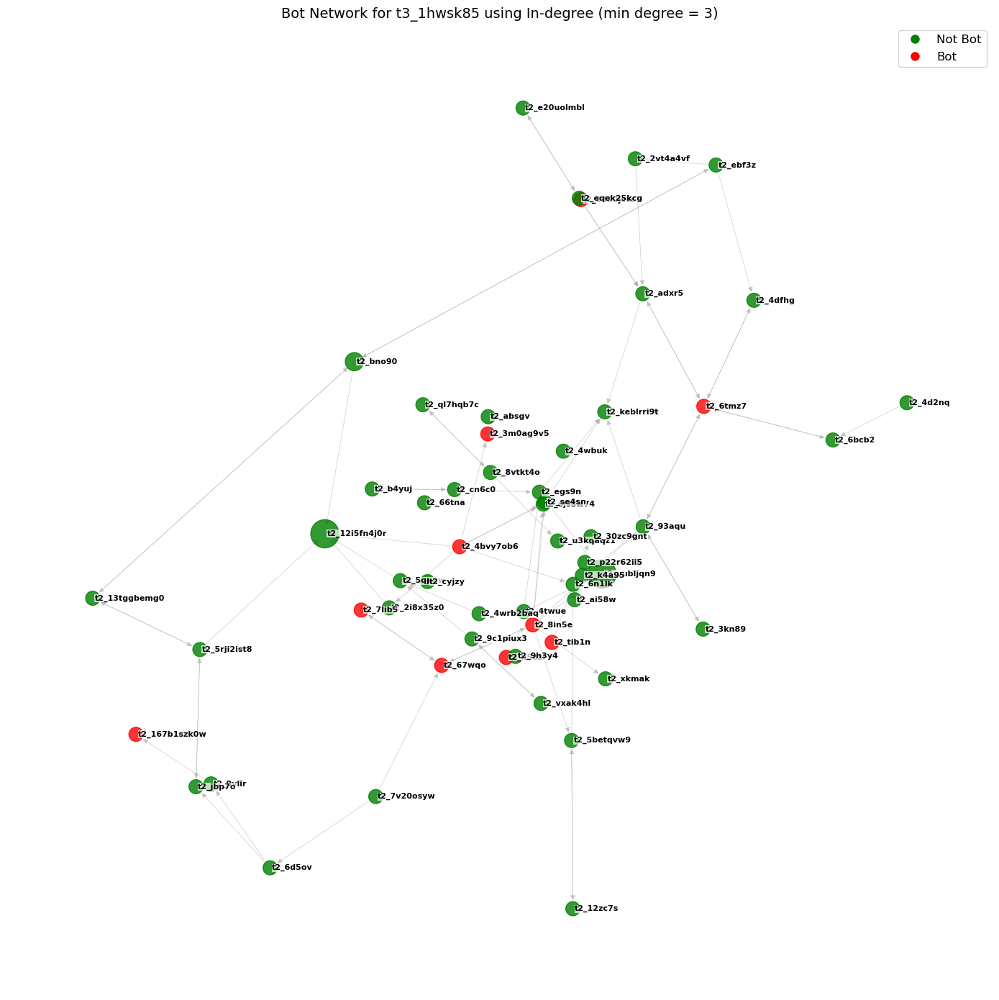

Initial Dictionary:
{'t2_13ukpn': 0.0, 't2_im1ux': 0.0, 't2_121wgh': 0.0, 't2_1ucdyz24': 0.022435897435897436, 't2_gurm88im9': 0.0, 't2_68petbf': 0.0, 't2_by2pkeg5': 0.03653846153846154, 't2_mk4ltkhj': 0.0, 't2_8l0g7jqf': 0.004487179487179487, 't2_k51bnotc': 0.03162393162393162, 't2_navwx': 0.015384615384615385, 't2_5orwrgxy': 0.003205128205128205, 't2_ctj1o': 0.0019230769230769232, 't2_q3kxp': 0.000641025641025641, 't2_39zsy1nh': 0.027564102564102563, 't2_12kwn5r226': 0.0, 't2_shau5s28': 0.010897435897435897, 't2_3wch9jej': 0.03205128205128205, 't2_dkhiquer6': 0.002564102564102564, 't2_yyafc1xkc': 0.0, 't2_6nh7k': 0.001282051282051282, 't2_uvc0rlgf': 0.0, 't2_7368ijb0': 0.005128205128205128, 't2_4mtdh': 0.0, 't2_gdzkjzf5': 0.006623931623931625, 't2_nvbb3634': 0.0, 't2_52fxikxe': 0.005555555555555555, 't2_by859': 0.0, 't2_76j1r': 0.0, 't2_15pzmo': 0.0, 't2_idhn4wf': 0.0, 't2_2s59qw80': 0.0, 't2_72ugq78o': 0.0, 't2_c51b8': 0.006837606837606838, 't2_1p7gdjqs': 0.028846153846153848, 't2_n

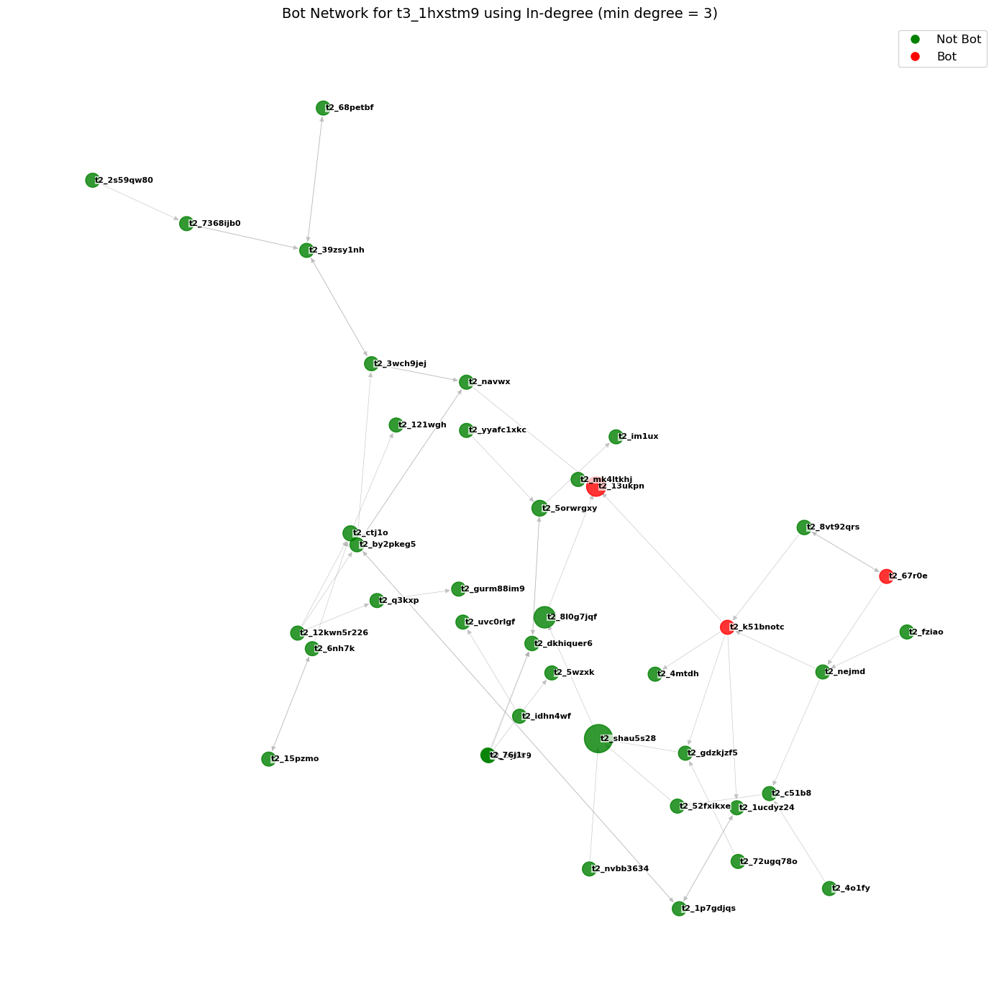

Initial Dictionary:
{'t2_lst66ur1': 0.0, 't2_32gkguod': 0.0, 't2_1epclhfffo': 0.5} 

Dictionary with 10 highest values:
Keys: Values
t2_1epclhfffo  : 0.5   human
t2_lst66ur1  : 0.0   human
t2_32gkguod  : 0.0   human


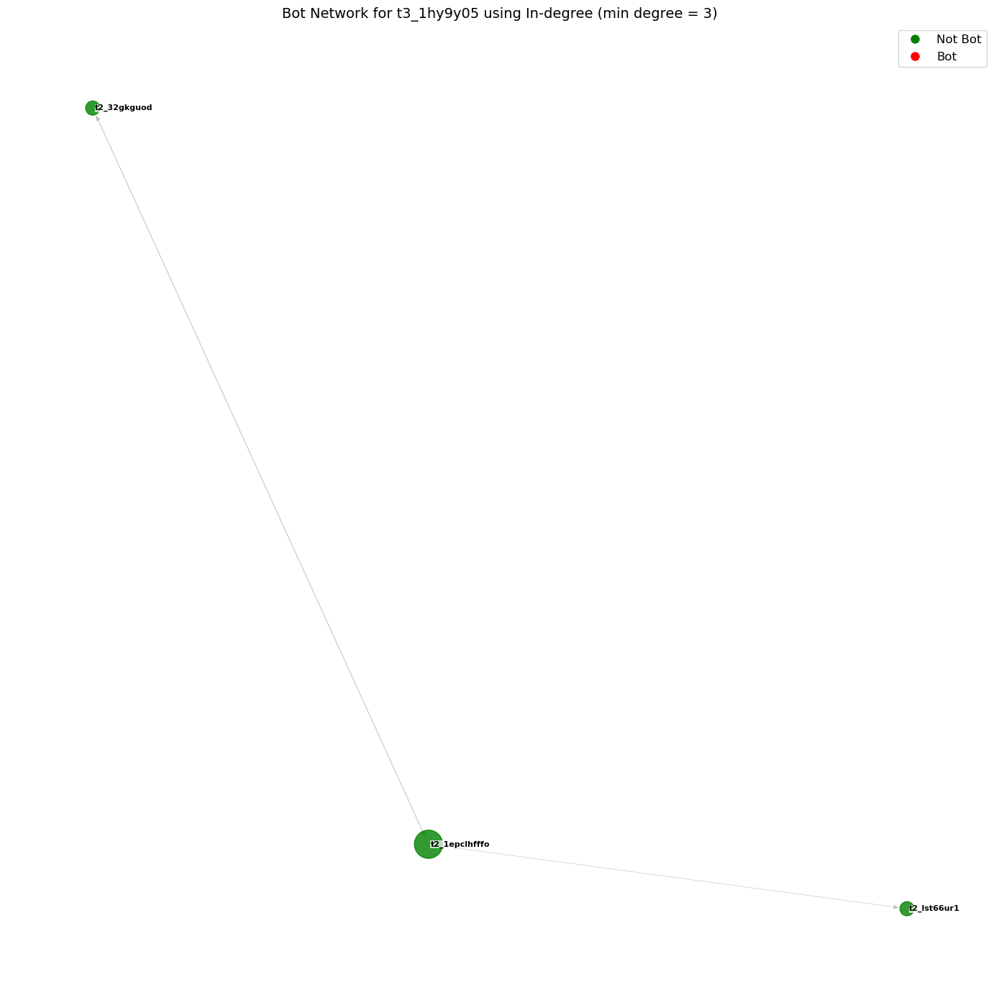

Initial Dictionary:
{'t2_ecc7w': 0.03894425987449244, 't2_1l0vba': 0.0, 't2_12qxit': 0.0, 't2_3v43v': 0.0, 't2_9q1uyk0x': 0.06699889258028793, 't2_avixr': 0.0, 't2_rekwy': 0.0, 't2_hn17g': 0.0, 't2_y7fx6': 0.0013842746400885935, 't2_114bhb': 0.0, 't2_4r7pz': 0.1345514950166113, 't2_a8hy2szz': 0.0, 't2_g0rtv': 0.002768549280177187, 't2_trqpd': 0.06953672942045035, 't2_snaps': 0.005537098560354374, 't2_ojxfx': 0.04337393872277594, 't2_elee5': 0.19601328903654483, 't2_ikq8r': 0.02662421557770395, 't2_9xogj': 0.016196013289036543, 't2_e5kuh': 0.0, 't2_cag3a': 0.16901993355481726, 't2_8x1m3ey5': 0.04928017718715393, 't2_bf20u': 0.15988372093023256, 't2_oueof': 0.0, 't2_c93ad': 0.015503875968992248, 't2_t1zrbsd62': 0.0, 't2_kfiib': 0.0, 't2_gymmj': 0.0, 't2_hf74ba77': 0.002768549280177187, 't2_9n3z9': 0.0012919896640826874, 't2_3htcqr33': 0.0, 't2_147cgn': 0.010151347360649687, 't2_4mp2zdur': 0.01661129568106312, 't2_236cot6c': 0.0, 't2_4o21z': 0.0, 't2_cv61w': 0.0, 't2_c5wy2m64': 0.0, 't2_c

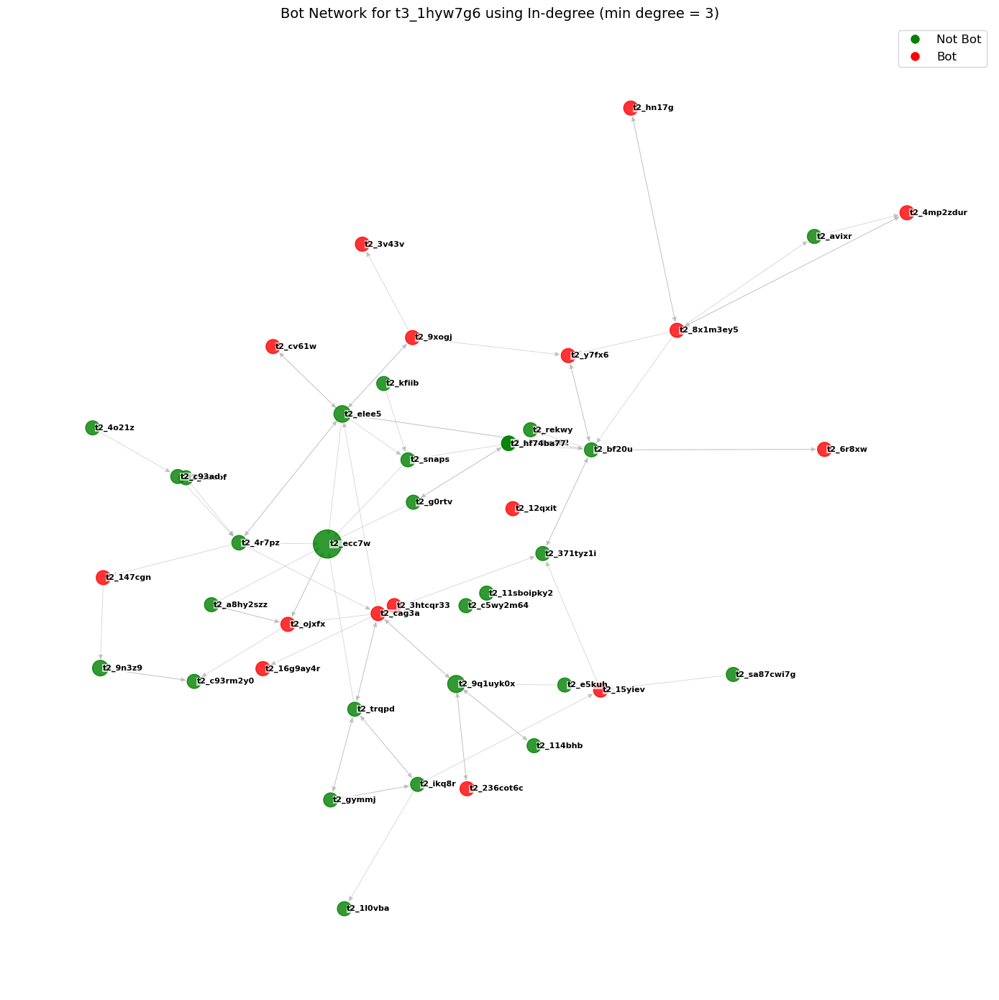

Initial Dictionary:
{'t2_plvww': 0.0, 't2_6ukxd': 0.0, 't2_7wmiopsf4': 0.0, 't2_f8v6n0zj': 0.0, 't2_15s5hcu81d': 0.0, 't2_m2a6mv0p': 0.0, 't2_4m8s2t37': 0.0, 't2_vkqcq6c2': 0.0, 't2_st01pgrii': 0.0, 't2_1bq06wodv4': 0.0, 't2_1hmea6vy': 0.007575757575757576, 't2_drjxotfm4': 0.0, 't2_e8igtvtx': 0.0} 

Dictionary with 10 highest values:
Keys: Values
t2_1hmea6vy  : 0.007575757575757576   human
t2_plvww  : 0.0   human
t2_6ukxd  : 0.0   human
t2_7wmiopsf4  : 0.0   human
t2_f8v6n0zj  : 0.0   human
t2_15s5hcu81d  : 0.0   human
t2_m2a6mv0p  : 0.0   human
t2_4m8s2t37  : 0.0   bot
t2_vkqcq6c2  : 0.0   bot
t2_st01pgrii  : 0.0   human


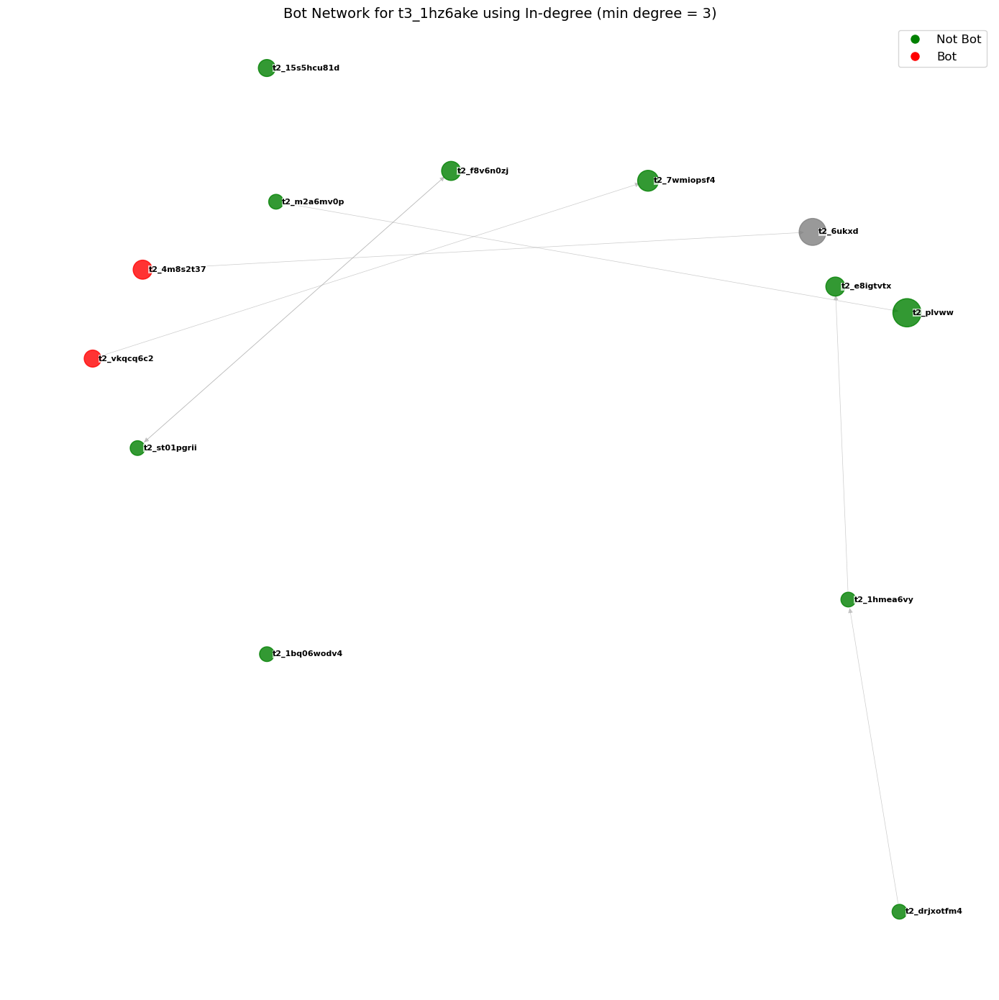

Initial Dictionary:
{'t2_2hm6l94u': 0.042735042735042736, 't2_11lqath1sd': 0.0, 't2_6jjfisov': 0.0, 't2_mrac3': 0.0, 't2_r4zx1zd1': 0.02421652421652422, 't2_ovfjc': 0.0, 't2_hyr5mz8kr': 0.0, 't2_ki4a6': 0.0, 't2_4om8rmo': 0.0, 't2_xjabn': 0.0, 't2_1d3nnfsf': 0.011396011396011397, 't2_elvszk': 0.0, 't2_9gv15v8v': 0.019230769230769232, 't2_b2js3nmeo': 0.0, 't2_k36l1ydf': 0.0, 't2_r3tzl': 0.019943019943019943, 't2_dijcchf9': 0.0, 't2_wbfb7': 0.0, 't2_1fjwneinop': 0.03703703703703704, 't2_rg4zxpty': 0.019943019943019943, 't2_831d5we0': 0.004273504273504274, 't2_a4x9zk6cx': 0.0007122507122507123, 't2_brjfsxlpn': 0.009971509971509971, 't2_1cwefj7dvn': 0.005698005698005698, 't2_12eli6m822': 0.0, 't2_yzz9j': 0.004273504273504274, 't2_si4wll3y8': 0.0, 't2_xmzzz': 0.0} 

Dictionary with 10 highest values:
Keys: Values
t2_2hm6l94u  : 0.042735042735042736   human
t2_1fjwneinop  : 0.03703703703703704   human
t2_r4zx1zd1  : 0.02421652421652422   human
t2_r3tzl  : 0.019943019943019943   human
t2_rg4z

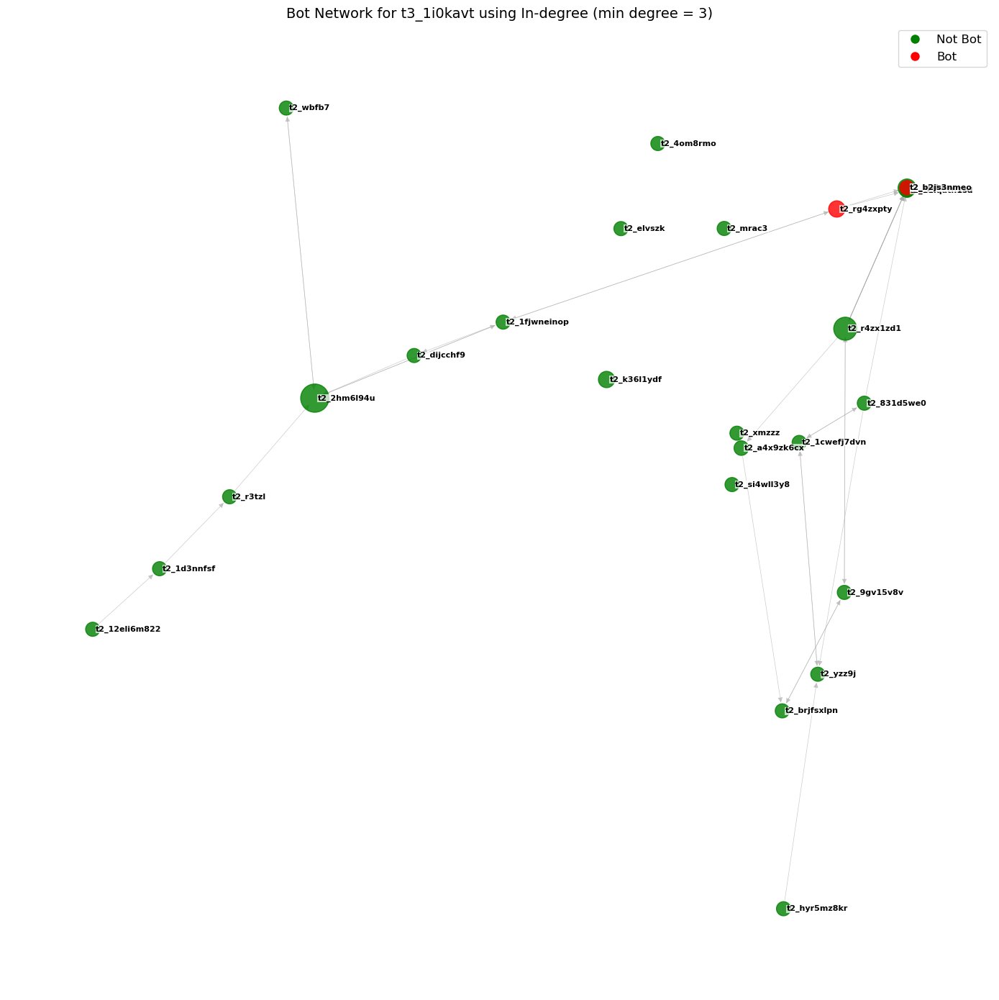

Initial Dictionary:
{'t2_9a7co': 0.0, 't2_o1jtvc6rk': 0.0, 't2_8kmztost': 0.005063291139240506, 't2_prtspyjr': 0.002689873417721519, 't2_od2zf4y0e': 0.0, 't2_59fn4lsf': 0.001740506329113924, 't2_371x7bqn': 0.0, 't2_e3hu1js0': 0.0, 't2_116bx9614x': 0.0046677215189873415, 't2_4dfhg': 0.0, 't2_fo1g3b0k': 0.0, 't2_2u42pgmd': 0.0, 't2_17f4c9aq74': 0.0, 't2_18pfn343z4': 0.00189873417721519, 't2_5h7me': 0.0, 't2_95ph63qo': 0.0, 't2_b6m9o7sip': 0.0, 't2_67h9ybx6': 0.0011075949367088608, 't2_y3zv6rsps': 0.0, 't2_fo9mq1t': 0.0004746835443037975, 't2_129ptznhoh': 0.0, 't2_fcykodeu': 0.0, 't2_7yacuo17': 0.0, 't2_9lrla7ff': 0.0006329113924050633, 't2_68yxeh75': 0.0, 't2_4i4ma': 0.0, 't2_10v8a7': 0.0, 't2_a2pgvw41': 0.0, 't2_ix1ar': 0.0, 't2_2hu1taq7': 0.0, 't2_kbp51ya16': 0.0, 't2_5881n': 0.001951476793248945, 't2_mii9l08v': 0.0007647679324894514, 't2_17zwjzbcq5': 0.0, 't2_qnnlhnaxs': 0.0, 't2_rnh9m0uz': 0.0, 't2_7at8m7d4w': 0.0023734177215189874, 't2_vj9lo5ms': 0.0029799578059071727, 't2_8v3dsesq'

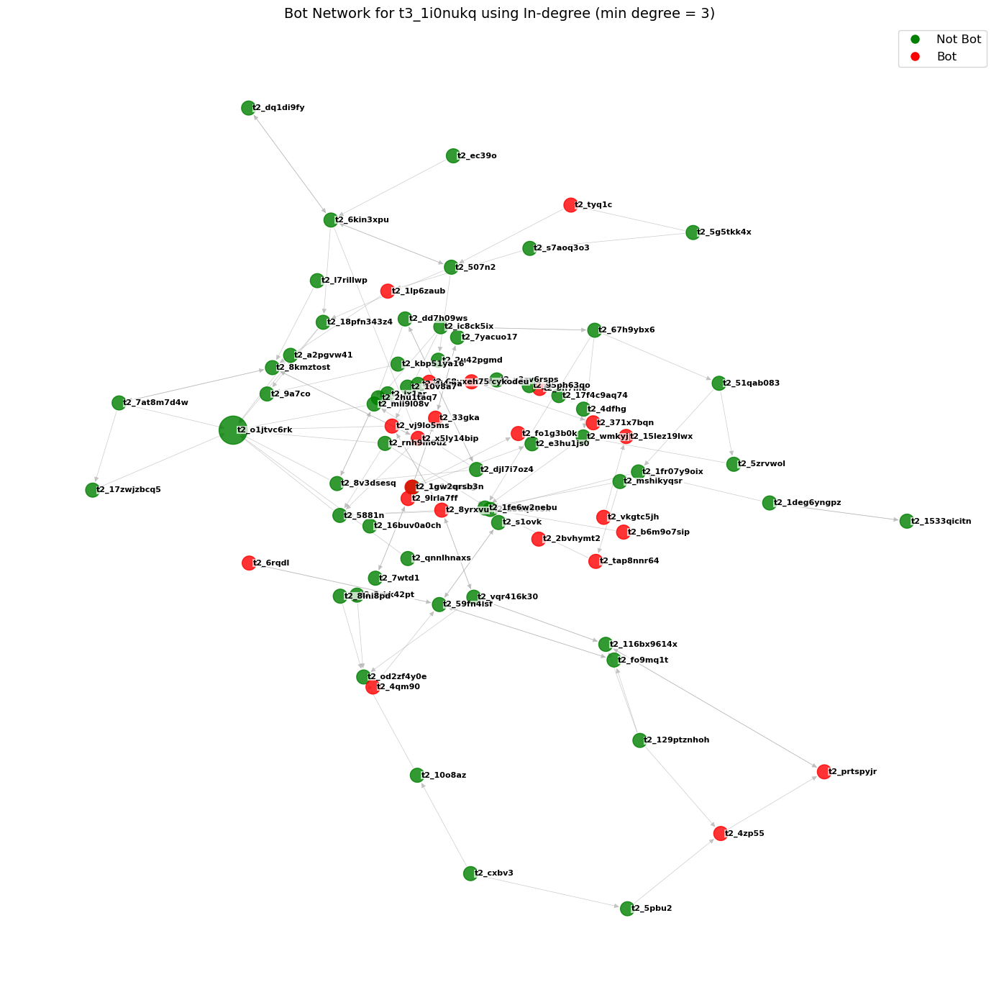

Initial Dictionary:
{'t2_1h42onjnug': 0.0, 't2_dr7y0h07': 0.0, 't2_4ldtogws': 0.0, 't2_9uty86gt': 0.0, 't2_ykxsgeko1': 0.0, 't2_vdflmzxvk': 0.015151515151515152, 't2_3cvd5cm3': 0.015151515151515152, 't2_zz7py6crl': 0.0, 't2_kjr85zcqy': 0.022727272727272728, 't2_xthom': 0.022727272727272728, 't2_wj2tpwrhc': 0.0, 't2_i6ye1drf': 0.015151515151515152, 't2_54x3au7f': 0.0} 

Dictionary with 10 highest values:
Keys: Values
t2_kjr85zcqy  : 0.022727272727272728   human
t2_xthom  : 0.022727272727272728   human
t2_vdflmzxvk  : 0.015151515151515152   human
t2_3cvd5cm3  : 0.015151515151515152   human
t2_i6ye1drf  : 0.015151515151515152   human
t2_1h42onjnug  : 0.0   bot
t2_dr7y0h07  : 0.0   human
t2_4ldtogws  : 0.0   human
t2_9uty86gt  : 0.0   human
t2_ykxsgeko1  : 0.0   human


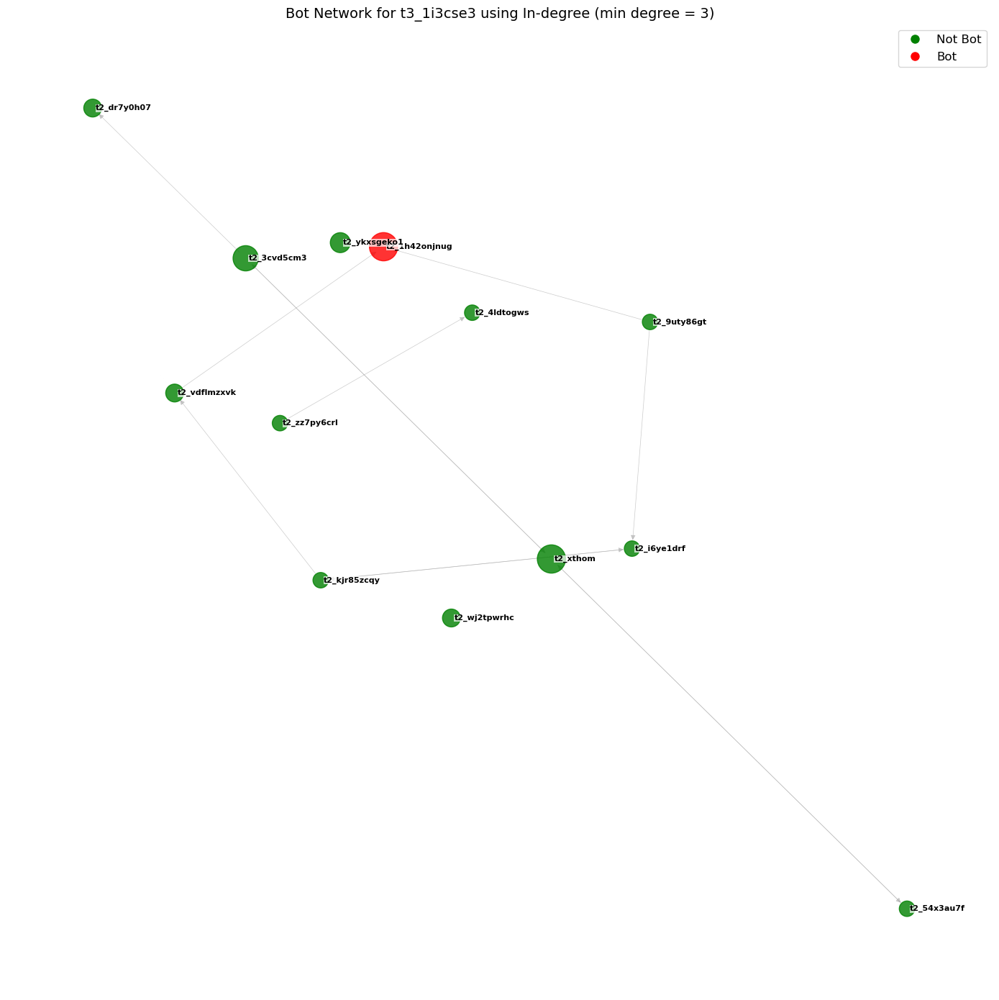

Initial Dictionary:
{'t2_h9aqbsp1': 0.0, 't2_6ulap': 0.0, 't2_1fwpskfj3y': 0.0, 't2_7emuegbu': 0.0, 't2_obz7t6y7': 0.0, 't2_vlayp58o': 0.014112903225806451, 't2_5s58msd': 0.0, 't2_5rnlo': 0.0, 't2_n3q0vl0s': 0.0, 't2_1f2goz6': 0.0, 't2_a93pu': 0.0, 't2_oahgo7ga': 0.020161290322580645, 't2_9ow0iuoh': 0.0, 't2_2qghqjiy': 0.0, 't2_kqts1h4l': 0.0, 't2_dn20dl20': 0.0, 't2_14nsg93yu8': 0.0010080645161290322, 't2_gz1ngbm3': 0.0, 't2_tj33gfvh': 0.013104838709677418, 't2_lcr8as6': 0.0010080645161290322, 't2_v8n37ug': 0.0, 't2_2z43dwgj': 0.013104838709677418, 't2_8l5oztgr': 0.0, 't2_2md6etu3': 0.0010080645161290322, 't2_7zrf4uln': 0.0, 't2_j9m0g71m': 0.008064516129032258, 't2_qkfuh': 0.03931451612903226, 't2_9elrjr80a': 0.0, 't2_ae0yxhyg': 0.0, 't2_2wlwjxrr': 0.0, 't2_4adljrxl': 0.03024193548387097, 't2_5qxkikko': 0.0, 't2_claifzxs': 0.0} 

Dictionary with 10 highest values:
Keys: Values
t2_qkfuh  : 0.03931451612903226   bot
t2_4adljrxl  : 0.03024193548387097   human
t2_oahgo7ga  : 0.02016129032

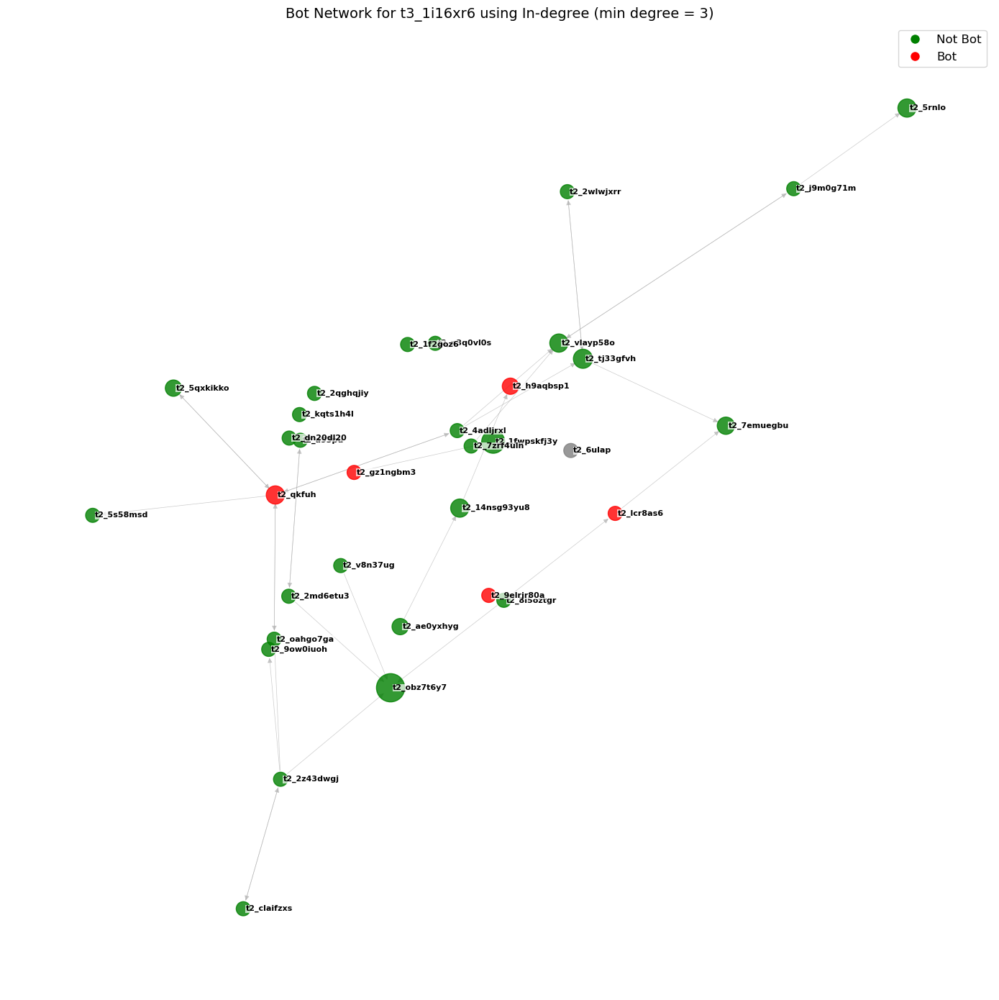

Initial Dictionary:
{'t2_wkhi0': 0.0, 't2_50qwilia': 0.0, 't2_g1wkr9ko': 0.006060606060606061, 't2_8srss1tc': 0.0, 't2_7ux5p': 0.0, 't2_68mk8': 0.0, 't2_rtcbcez3': 0.0, 't2_qpcs3vvhd': 0.00202020202020202, 't2_lfhd09gr': 0.0, 't2_rfpnw99': 0.002525252525252525, 't2_uooembys': 0.0, 't2_v0yfjlo0': 0.012121212121212121, 't2_wb682': 0.0, 't2_qg9ep': 0.0, 't2_78tsy': 0.0, 't2_15tmeo': 0.00505050505050505, 't2_b0kgn': 0.007575757575757576, 't2_rmqj0u6p': 0.0, 't2_gn5lu599d': 0.017676767676767676, 't2_8cgvst07': 0.0, 't2_5sj9fl8h': 0.0, 't2_6cvu7': 0.0, 't2_1ahncy8klp': 0.006313131313131313, 't2_1b22e2n6sq': 0.0030303030303030303, 't2_q7t673nh': 0.016666666666666666, 't2_3td0i6fn': 0.0, 't2_1eldusvom3': 0.0, 't2_qk7cf14q': 0.01717171717171717, 't2_wd13k': 0.0, 't2_12cqit': 0.00404040404040404, 't2_pyl4s9o': 0.0002525252525252525, 't2_pk46fim': 0.00202020202020202, 't2_102iwxcuu8': 0.0, 't2_3u8o3ofr': 0.0, 't2_ncohuuhxn': 0.0, 't2_oswvl': 0.0, 't2_125fvmylor': 0.010606060606060607, 't2_d5kqm7w

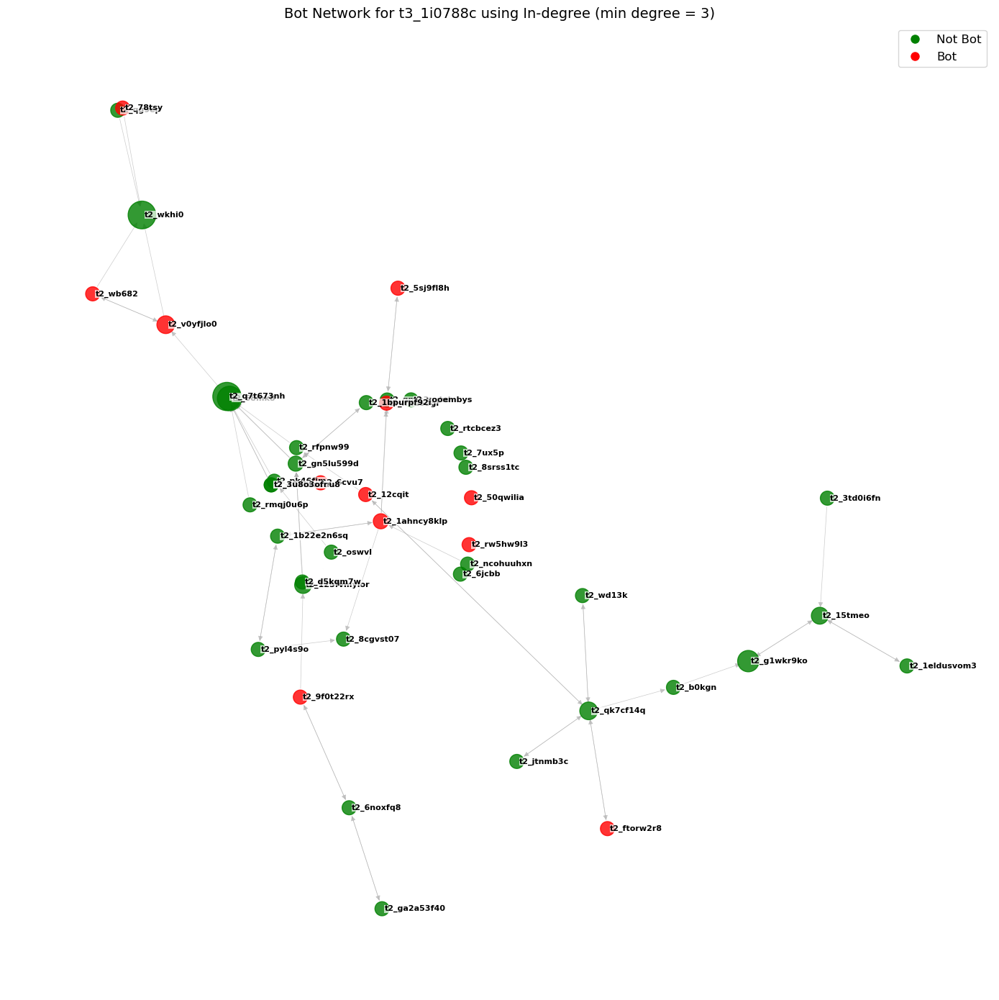

Initial Dictionary:
{'t2_mm7m0ccve': 0.0, 't2_oxub5tnr': 0.0, 't2_1kbebmiu': 0.0, 't2_9ourbvb': 0.0, 't2_u67rd0zep': 0.0, 't2_29iwtb62': 0.0, 't2_1cdvprap1d': 0.0, 't2_v9d2cnx4': 0.0, 't2_nhku54oy5': 0.002331002331002331, 't2_4140kyai': 0.014652014652014652, 't2_zyey9': 0.0, 't2_671ljczt': 0.0, 't2_smf1qihpc': 0.0, 't2_3iob4q00': 0.0, 't2_1hhsklhfbg': 0.0, 't2_brfo7sxm9': 0.0, 't2_et93i6rsc': 0.0, 't2_hpb0ovqr': 0.0, 't2_6pn4daxt': 0.0, 't2_gnutvhfm2': 0.0, 't2_5nuhx3x3': 0.0001665001665001665, 't2_q82wibl1': 0.0, 't2_5xml05w0': 0.0, 't2_vr3pgnhx': 0.0, 't2_2frt7jv9': 0.0, 't2_4uvx1': 0.0001665001665001665, 't2_84vc0uib': 0.0001665001665001665, 't2_3mf2mdgo': 0.000333000333000333, 't2_7gztzgdq': 0.0, 't2_hihf392kq': 0.0, 't2_1hl98tzaiu': 0.0015817515817515818, 't2_d64sw952': 0.0, 't2_hfvm9wsf': 0.0, 't2_h1zdnt741': 0.0018315018315018315, 't2_85yx80jj': 0.000333000333000333, 't2_1hzvzxepdw': 0.03163503163503163, 't2_3xgc7p6b': 0.0, 't2_by3jz': 0.0, 't2_jcvefu18': 0.0, 't2_ydmsj': 0.0009

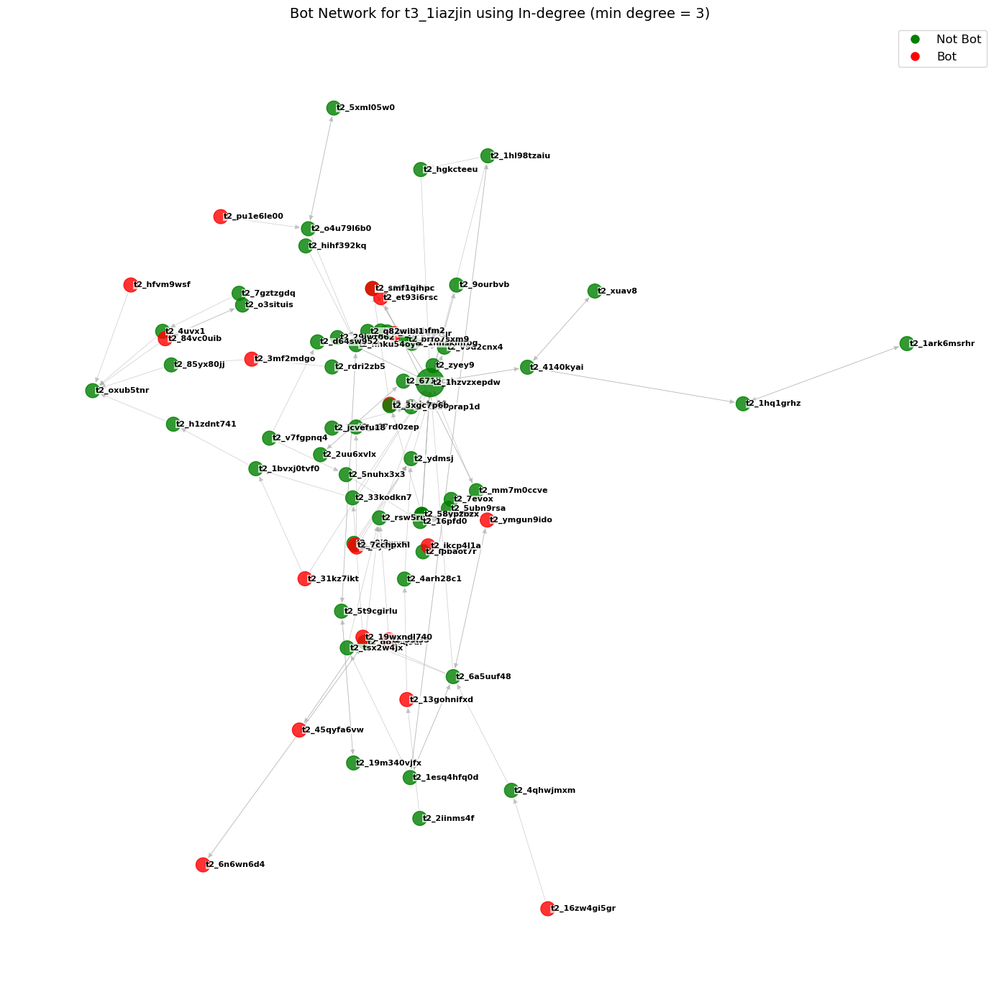

In [40]:
for post in posts:
    G, plot = plot_network_indegree(post, post_node_edge_dict, thr_70, min_degree = 3)
    top_betweenness(G)
    plot.show()

{'t2_12i5fn4j0r': 41, 't2_vubljqn9': 42, 't2_adxr5': 11, 't2_ojs8w74': 3, 't2_na5dsk0f': 2, 't2_4dfhg': 4, 't2_keblrri9t': 7, 't2_9kzqt': 1, 't2_70ckk': 1, 't2_3a3lu': 1, 't2_67wqo': 8, 't2_4wbuk': 4, 't2_gs9xd': 0, 't2_18egcjjdxn': 1, 't2_xkmak': 3, 't2_u3kqaqz1': 3, 't2_bioea': 0, 't2_huleu': 0, 't2_7p3pi': 2, 't2_8ye1l': 1, 't2_j0ccf': 0, 't2_ky0fs2b': 0, 't2_3m0ag9v5': 3, 't2_1e10jvxmbw': 1, 't2_38odh6sg': 1, 't2_ly1jx6fh': 0, 't2_rqfg8': 0, 't2_13k3hb4a': 0, 't2_6mjdc': 0, 't2_1berc8z9ri': 0, 't2_68yxeh75': 0, 't2_b1a2y': 0, 't2_13py6km7nl': 0, 't2_crquu': 1, 't2_44xc7': 2, 't2_567cea9z': 1, 't2_f393m': 0, 't2_1chtgw6cdd': 0, 't2_9450jcss': 4, 't2_4supi': 0, 't2_4zx6r': 2, 't2_5nd108ku': 0, 't2_zazbful': 0, 't2_5zkh8': 0, 't2_7e0qs1qd': 1, 't2_18x2to8pqk': 0, 't2_g2zfxrrv': 0, 't2_bvqonxdl': 0, 't2_3phy73da': 0, 't2_xnpdatmb1': 0, 't2_33k9c': 0, 't2_er58b': 0, 't2_89gps': 0, 't2_781yk': 0, 't2_58m84eyc': 0, 't2_7wstz5t7': 0, 't2_s1s07vw1': 0, 't2_14p6a3': 0, 't2_55evw': 0, 't2_nl6

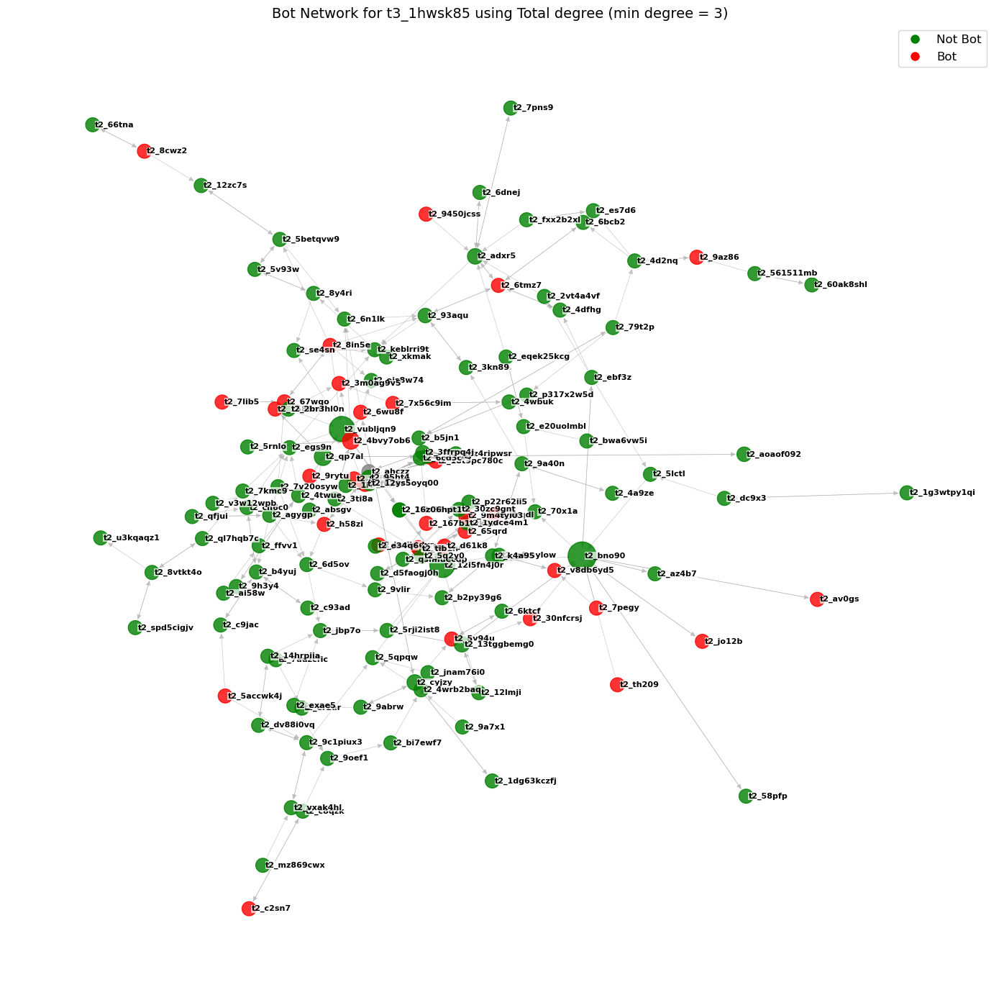

{'t2_13ukpn': 18, 't2_im1ux': 6, 't2_121wgh': 3, 't2_1ucdyz24': 6, 't2_gurm88im9': 3, 't2_68petbf': 5, 't2_by2pkeg5': 10, 't2_3m3eahlf': 2, 't2_ws7vi': 1, 't2_15kymi': 1, 't2_smnf25jk': 0, 't2_4t6f7tlv': 2, 't2_4vcqw': 1, 't2_mszm7evf': 0, 't2_2r7qtout': 0, 't2_2tiuylz8': 0, 't2_mk4ltkhj': 4, 't2_75x9jj4b': 1, 't2_4oufi3tq': 0, 't2_txctg': 1, 't2_5bquyiq5': 2, 't2_ukw10agn': 0, 't2_u34t0': 0, 't2_n5kx8': 0, 't2_26csy6b0': 0, 't2_v3m5yd5qp': 1, 't2_2q8eiong': 0, 't2_xqiujx': 0, 't2_18yi6w01mo': 1, 't2_16wk09zwh7': 1, 't2_f7on95e74': 1, 't2_2yi87': 0, 't2_eyrod': 0, 't2_ah4a59jjj': 0, 't2_ccxotavb': 0, 't2_4g2ov5dt6': 0, 't2_602u2bs6': 0, 't2_76bjyurw': 0, 't2_hy7r4qgn': 0, 't2_5wb6ygdg': 1, 't2_8po2v': 0, 't2_yxayuungs': 0, 't2_8goac': 0, 't2_fe4i9': 0, 't2_55m1eb16': 0, 't2_6we2dm': 1, 't2_dyqhci3n': 0, 't2_2h7zeox2': 0, 't2_5yrr3rzp': 0, 't2_1dqtay92e3': 0, 't2_3spvaxpl': 0, 't2_gtyis': 0, 't2_sxvl5oj': 0, 't2_47o13': 0, 't2_15oytn': 1, 't2_kfupo': 0, 't2_4itai': 0, 't2_2q5gxeac': 0, 

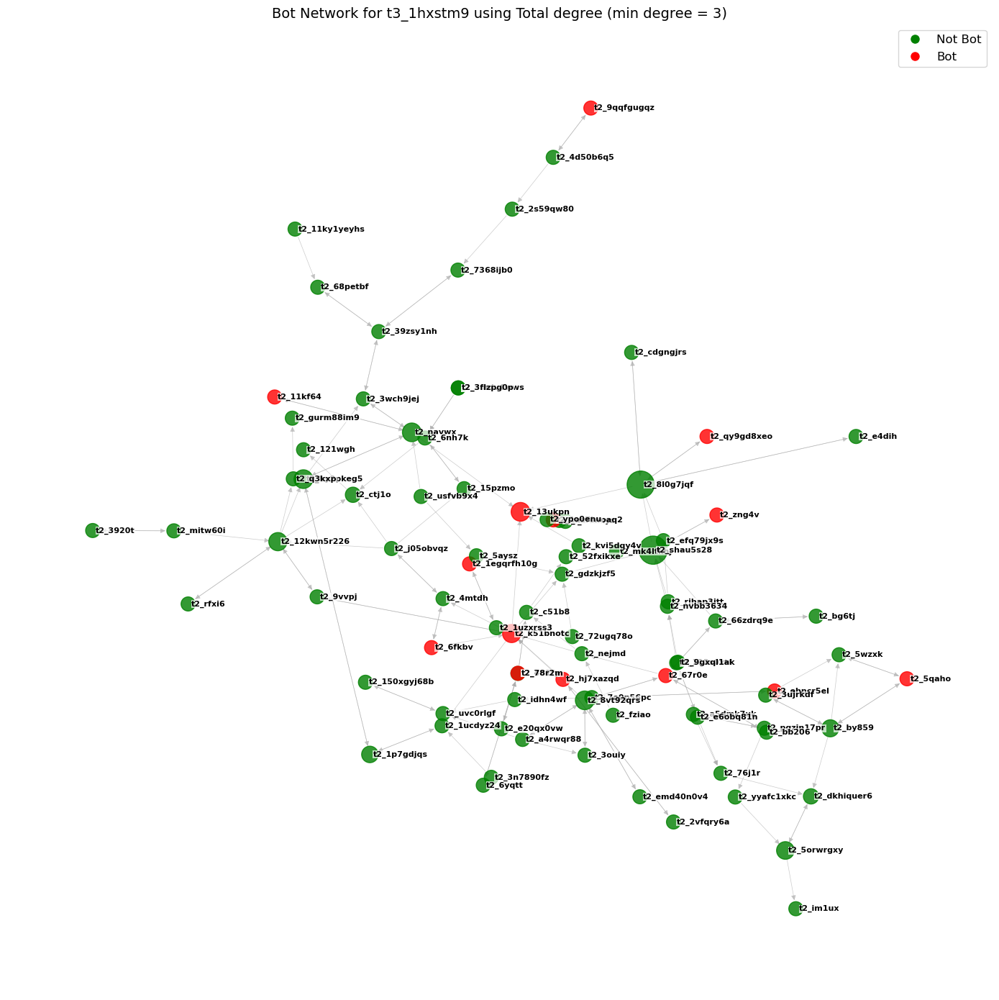

{'t2_lst66ur1': 4, 't2_2n48qjyu': 1, 't2_17f9e0pzj5': 2, 't2_xwl04xr9n': 1, 't2_15iyfhs017': 1, 't2_16f1is': 2, 't2_160u2g': 2, 't2_32gkguod': 5, 't2_l5w44in2': 1, 't2_893lfmel': 2, 't2_xwfvpcw': 1, 't2_9hykhbp8': 1, 't2_5h7n767h': 3, 't2_jjg3h': 1, 't2_tkfvnsmlc': 4, 't2_vxzt02yo': 2, 't2_21pou9l': 1, 't2_1dzen99sdg': 1, 't2_5vr45fj2': 1, 't2_5lj3fq27': 1, 't2_d40fzrfu': 0, 't2_18u6fvusrw': 1, 't2_sultjd6s': 0, 't2_dxrkv1fd': 1, 't2_jlldtrd6': 1, 't2_79l7v9h8': 1, 't2_xfe1h2g': 0, 't2_xdl2n': 1, 't2_oxvof62q': 2, 't2_3zqldkbh': 1, 't2_mrcrj0wmk': 0, 't2_7om79qj0': 0, 't2_o956zmg4': 0, 't2_ckx6uty6o': 1, 't2_bmgizsy0': 1, 't2_jkhwr850': 1, 't2_3wehk7rd': 0, 't2_70yoxszm6': 0, 't2_qwemm5tt9': 0, 't2_pmlho37n': 1, 't2_15lwqo': 2, 't2_aezy3neo': 0, 't2_18ielpwp4d': 0, 't2_qmuqabfk': 1, 't2_4p6vqu0z': 1, 't2_1e94970msg': 0, 't2_z4gns': 1, 't2_fdt7ejht': 1, 't2_11dqwk2ty9': 1, 't2_u1rad4nn': 1, 't2_58vju': 0, 't2_d9cki85': 1, 't2_32nncwf3': 2, 't2_uexwl3ebu': 1, 't2_25956vvb': 1, 't2_u9x7d'

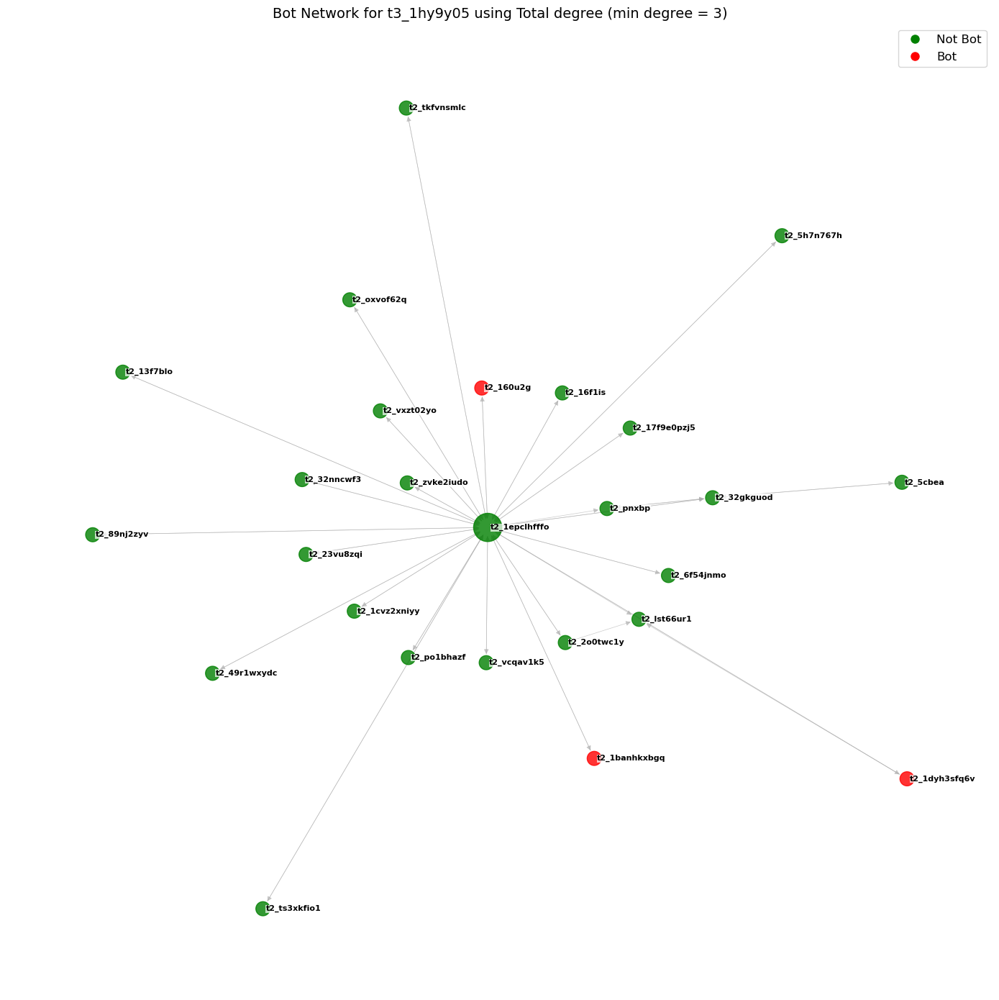

{'t2_ecc7w': 52, 't2_1l0vba': 4, 't2_3zjmkw4o': 0, 't2_12qxit': 3, 't2_5nvr3': 1, 't2_7mr4cit64': 0, 't2_3v43v': 3, 't2_9q1uyk0x': 20, 't2_avixr': 4, 't2_y766d5u': 0, 't2_1rcyp6dn': 0, 't2_4bdn7': 0, 't2_6hn4qx80': 1, 't2_4ewh6': 1, 't2_650y4': 2, 't2_l71t9wx': 1, 't2_218nwxgu': 0, 't2_5wc9j': 1, 't2_1dcfngcq': 1, 't2_a505e2et': 0, 't2_13n7xt': 0, 't2_swmu0': 1, 't2_52pll': 0, 't2_5bmil': 1, 't2_1ei1ktx': 0, 't2_767ka': 1, 't2_3khg3rlc': 0, 't2_p7lpi': 0, 't2_fhm4r4mx': 1, 't2_c8q59qv8': 0, 't2_d54dq': 1, 't2_bpo6v': 0, 't2_rekwy': 12, 't2_o6l86408b': 0, 't2_d2wo3ejh': 0, 't2_qrb8r0j6y': 0, 't2_nz02fnk2o': 0, 't2_6pj2yd0': 0, 't2_l3t535ex': 0, 't2_em8gh': 2, 't2_alr25': 1, 't2_bob60jxc': 2, 't2_6giv23h9y': 1, 't2_uiuvv': 2, 't2_hn17g': 11, 't2_1yw3ltzu': 0, 't2_3d6zu3t5': 0, 't2_148ktz': 0, 't2_16w2v6mlhn': 0, 't2_7qgo7': 0, 't2_ow9nx': 0, 't2_3w75p': 0, 't2_6241x': 0, 't2_dtohn': 0, 't2_ch74j': 0, 't2_165uj0z3': 0, 't2_c4b7j': 0, 't2_l4k8xo8q': 4, 't2_17bslo': 0, 't2_1j6w0hj': 1, 't2_

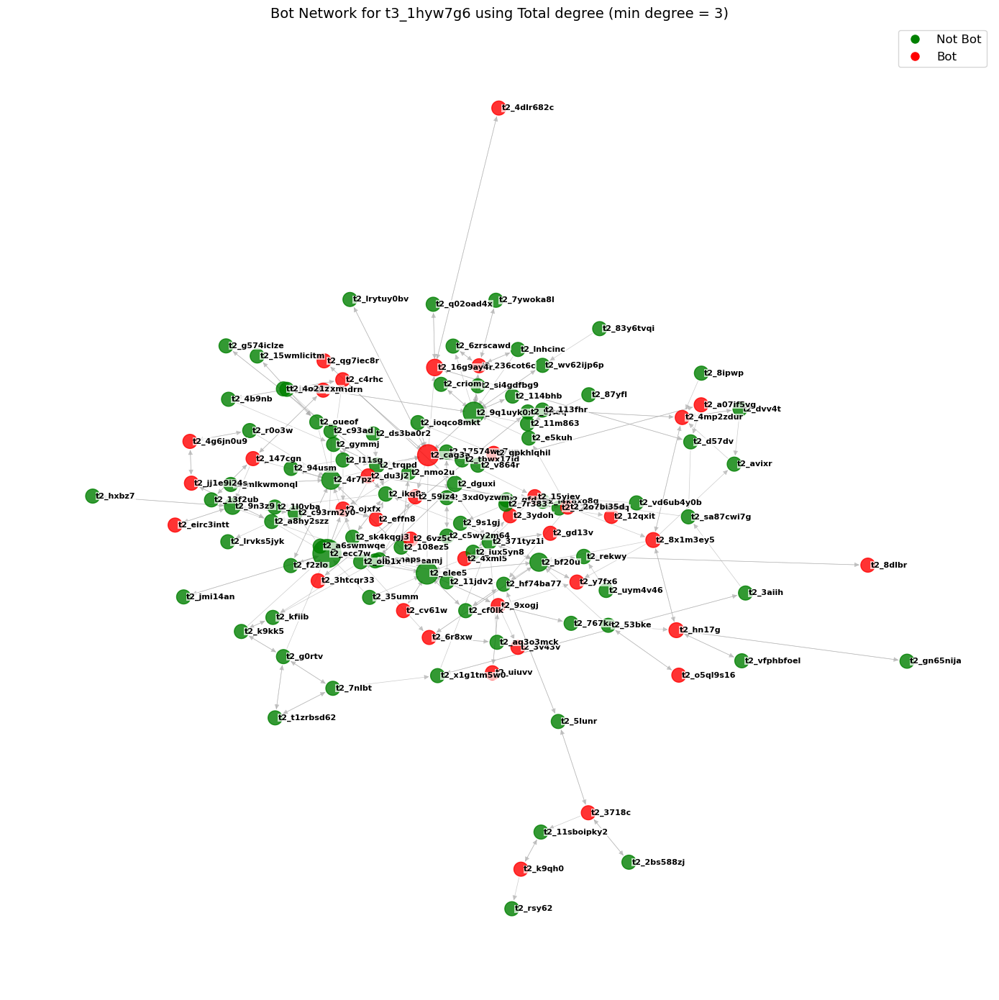

{'t2_6l4z3': 0, 't2_plvww': 11, 't2_6ukxd': 10, 't2_k0sbp8pz': 2, 't2_7wmiopsf4': 6, 't2_f8v6n0zj': 5, 't2_icyud': 0, 't2_15s5hcu81d': 4, 't2_8imsb17d': 0, 't2_10pf5w0le5': 0, 't2_14wxhyqazl': 1, 't2_10v3xjdwdd': 0, 't2_dr5du': 0, 't2_2s4woazg': 0, 't2_69ze0': 0, 't2_i8it29o3l': 0, 't2_fyp1imtd': 0, 't2_ndr2td0dc': 0, 't2_nr14f': 0, 't2_mfmiqla22': 0, 't2_ehak41hm': 0, 't2_a1tqd5ma': 0, 't2_9hsa9': 0, 't2_4ypo88tb': 0, 't2_56owtbyx': 1, 't2_icl7w7pn': 0, 't2_rludimgw': 0, 't2_4gs5znzy': 0, 't2_afxzr': 2, 't2_197dnp15qi': 0, 't2_dxqther': 0, 't2_10x8pu': 0, 't2_gxmxo': 0, 't2_ans20': 0, 't2_apn520u6': 0, 't2_4b9npav7': 1, 't2_hunlr': 0, 't2_c3sne': 0, 't2_vev1awb6': 0, 't2_fsfdaovz': 0, 't2_1h8xt4lq': 0, 't2_9qanp1i8': 0, 't2_5lbbdr': 0, 't2_rlyjt': 1, 't2_15bb4frzo0': 0, 't2_69fjabj9c': 0, 't2_21j7t6y3': 0, 't2_7nf48tie': 0, 't2_72bqj': 0, 't2_dxzas': 0, 't2_4yfgdsif': 1, 't2_ry0cgbxa': 0, 't2_3e149iyf': 0, 't2_f76ttszm2': 0, 't2_uv3oss1q': 0, 't2_1btsw06h4b': 0, 't2_m82oo': 0, 't2_emh

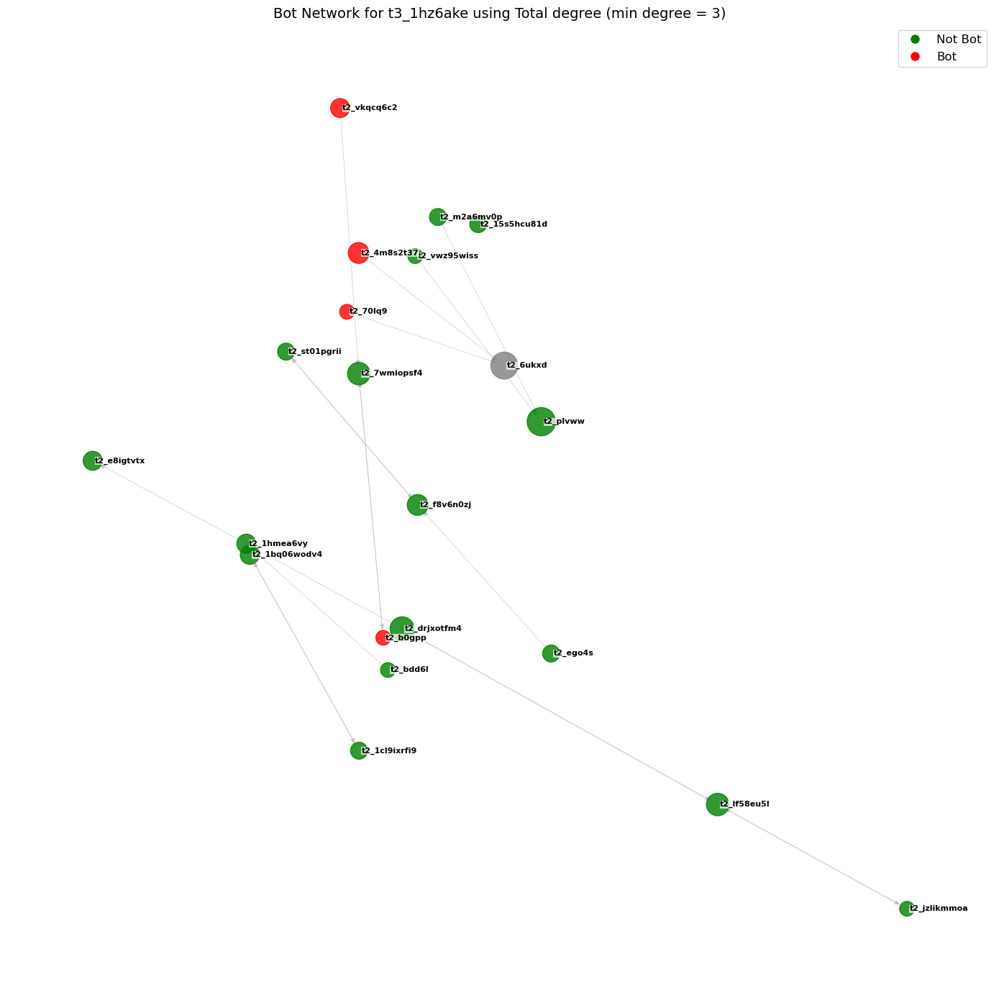

{'t2_2hm6l94u': 37, 't2_8c75msq': 1, 't2_11lqath1sd': 5, 't2_6jjfisov': 12, 't2_ywpe6': 2, 't2_mrac3': 3, 't2_8o3os8pc': 0, 't2_fye6mmnl': 2, 't2_ijns0q0bv': 3, 't2_dcwr0xg9': 2, 't2_r4zx1zd1': 26, 't2_529clyuc': 0, 't2_11zqzk7x': 0, 't2_wcju0': 1, 't2_8k7gtrxr': 1, 't2_77z69vs1': 0, 't2_j50z5dp': 0, 't2_1dfu0dqmov': 0, 't2_7l9h2': 0, 't2_13th02cuo1': 0, 't2_uh2csqey': 1, 't2_1gw2bgkj': 0, 't2_8auqm': 0, 't2_14tajf36tc': 0, 't2_5d28c': 0, 't2_8qrpiv2p': 0, 't2_ovfjc': 4, 't2_f6intmekt': 0, 't2_9hsa9': 0, 't2_jh569dbd': 0, 't2_4jpseeo4': 1, 't2_eguq47ox': 1, 't2_4q4x5zs': 0, 't2_15dg2mbfai': 0, 't2_z0jzv': 0, 't2_jw21j': 2, 't2_1zq3l5hc': 0, 't2_xw1gg4uog': 0, 't2_s2vk2': 1, 't2_rzbbn': 0, 't2_fahtc': 0, 't2_8uf07': 0, 't2_99fib1pp': 0, 't2_qblsw': 0, 't2_itxct': 0, 't2_jqf7r1q2': 0, 't2_z99j654jx': 1, 't2_313te97b': 0, 't2_srt4qy53j': 0, 't2_4zecl64u': 0, 't2_1jx9qny': 0, 't2_43uuq9m0': 0, 't2_95h74': 0, 't2_vnv2ofa2': 0, 't2_p7ed8': 0, 't2_13q8br': 0, 't2_q003c4u': 0, 't2_91trkf5y': 0

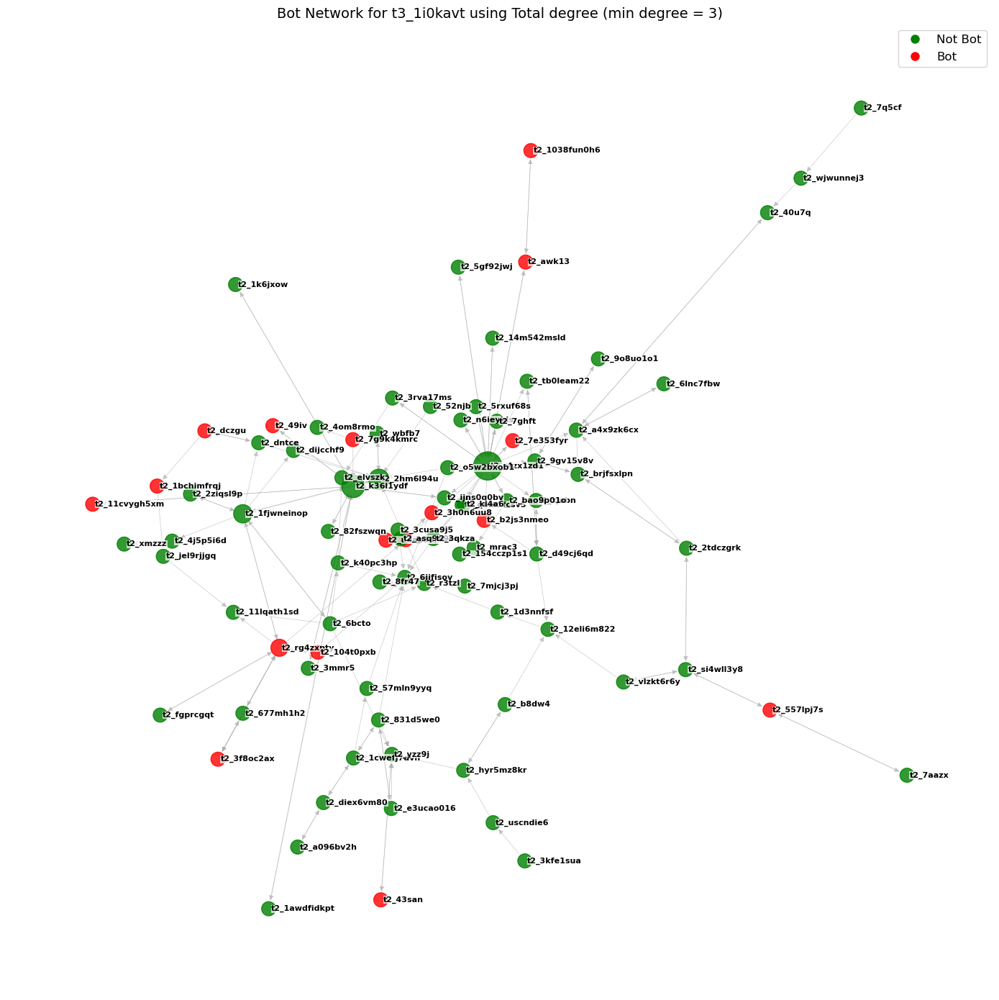

{'t2_9a7co': 11, 't2_o1jtvc6rk': 140, 't2_8kmztost': 21, 't2_prtspyjr': 12, 't2_od2zf4y0e': 22, 't2_59fn4lsf': 9, 't2_371x7bqn': 6, 't2_e3hu1js0': 10, 't2_116bx9614x': 13, 't2_4dfhg': 8, 't2_fo1g3b0k': 6, 't2_7sd48mkay': 3, 't2_11dj8d': 2, 't2_2u42pgmd': 3, 't2_6gyep': 2, 't2_11z3apb1a8': 0, 't2_12rrca38kt': 0, 't2_5udfp4z76': 0, 't2_79vbz': 1, 't2_6pbjd6qz': 0, 't2_1dumqp8nkz': 0, 't2_etwdz': 0, 't2_abrgj4lm': 0, 't2_mj9owlba': 0, 't2_176do4': 1, 't2_n2zus1uh': 2, 't2_13b40e': 1, 't2_13oxro': 0, 't2_116gof0a': 1, 't2_rib17jx3': 0, 't2_2eesorat': 0, 't2_1cmnyntzje': 0, 't2_2pswxl9n': 0, 't2_1fmd2aj7ey': 1, 't2_1975kpnbqj': 0, 't2_t7bh4': 0, 't2_3o69tu7l': 0, 't2_1aau9evwgw': 0, 't2_17f4c9aq74': 3, 't2_18pfn343z4': 15, 't2_colk0rt': 0, 't2_d5a2v18': 1, 't2_i2xcbmie': 1, 't2_jp4xxyk1': 0, 't2_hcqot3sg': 0, 't2_w79k9vubv': 1, 't2_egkh1jo9': 0, 't2_2bz30iij': 0, 't2_776mi': 0, 't2_a1miposa': 0, 't2_vjybb3bv': 0, 't2_79dsd': 0, 't2_1f3nvmbc98': 2, 't2_o487gsll8': 2, 't2_5h7me': 3, 't2_tyhm1

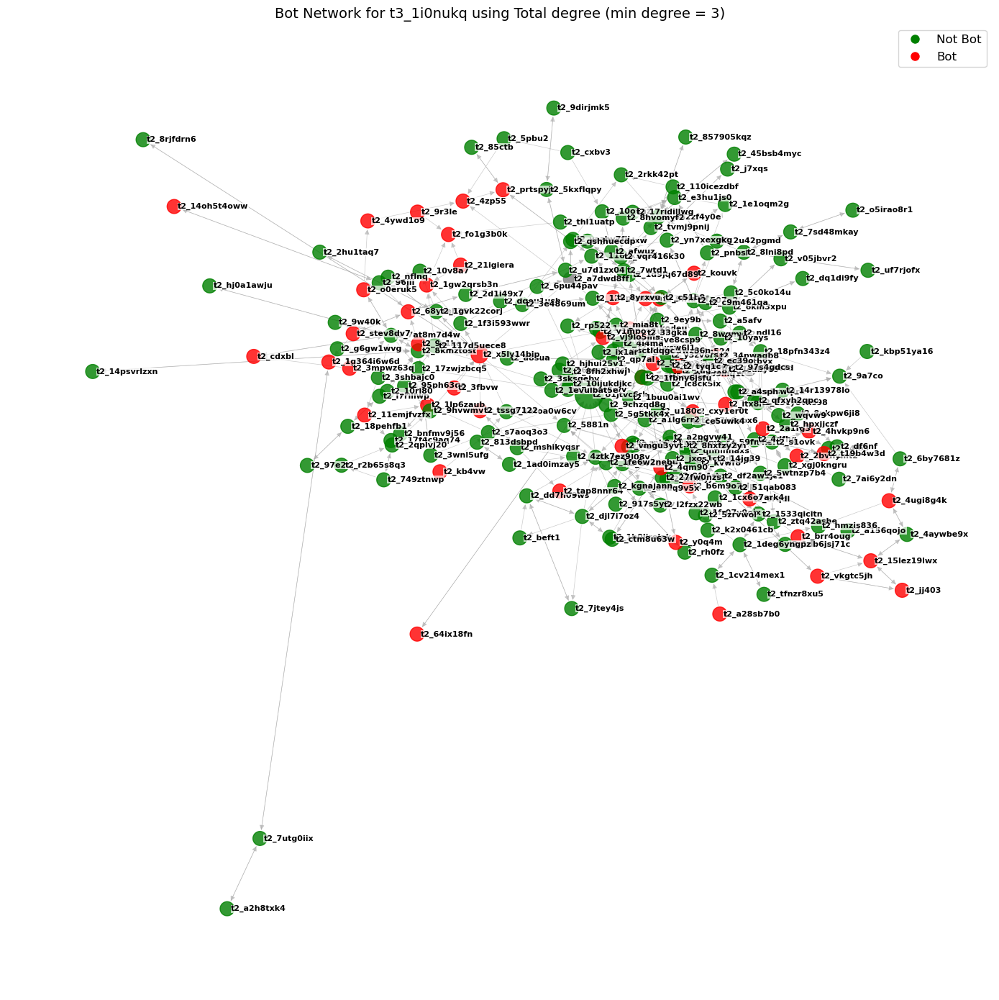

{'t2_6l4z3': 0, 't2_1h42onjnug': 10, 't2_dr7y0h07': 4, 't2_31w1rcsu': 1, 't2_4ldtogws': 3, 't2_prbvrxr': 2, 't2_gonun': 0, 't2_rpb21mm8': 2, 't2_bpo6v': 0, 't2_oxjgr43v': 0, 't2_drecbdui': 0, 't2_1gl5us8d7b': 0, 't2_gi0xmmyw0': 0, 't2_1bgte3d4ps': 0, 't2_169r0rw08c': 0, 't2_73llfqd65': 0, 't2_4pjag3e9': 0, 't2_nqmosf0': 0, 't2_vktega53i': 0, 't2_8o7mjvfg': 1, 't2_2oz90mp9': 0, 't2_16fd4kxz': 0, 't2_69f4t7rz': 0, 't2_11aaqx': 0, 't2_ddzdm9z': 0, 't2_7rbg8khg': 1, 't2_axztdlrn1': 0, 't2_537n5': 0, 't2_74kn00uc': 0, 't2_jn5zd': 0, 't2_5dyv4weal': 0, 't2_52hlhcnz': 0, 't2_gtcbc3w2': 0, 't2_uf5q6y9q': 0, 't2_bf0260og': 1, 't2_haznvsd2i': 0, 't2_mixcq': 0, 't2_163d5spq2y': 0, 't2_e3t1rruxd': 0, 't2_35kegbwy': 0, 't2_114es8': 0, 't2_9npzi9tn': 0, 't2_4kcdupsv': 0, 't2_4ggmogl4': 0, 't2_5zqzqgjp': 0, 't2_dzbzllta': 0, 't2_ha146sbb': 0, 't2_o90cqlqod': 0, 't2_3w3ziec5': 0, 't2_5iyuvp81': 0, 't2_7yvlnmhh': 0, 't2_e8vvk094': 0, 't2_1e2lttozxg': 0, 't2_344e6': 0, 't2_1rcgh8qo': 0, 't2_q0cg2nl1': 0

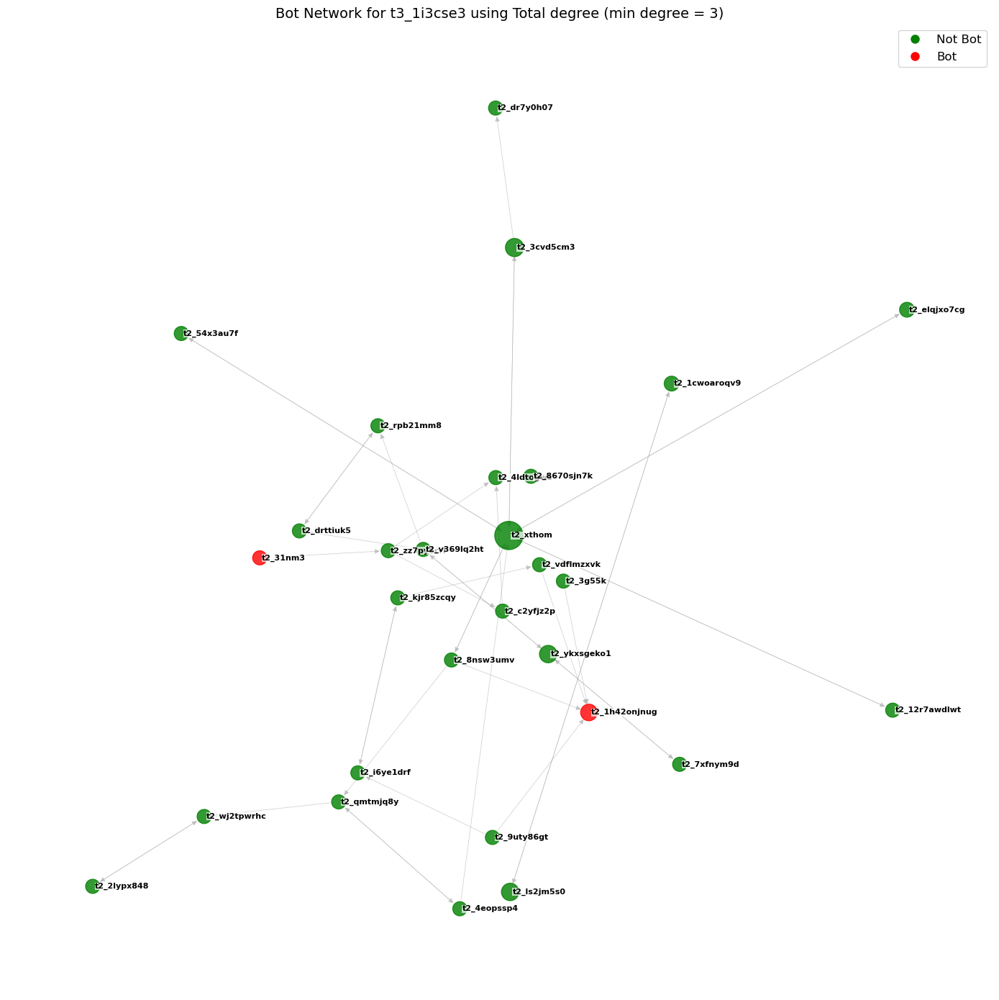

{'t2_h9aqbsp1': 8, 't2_6ulap': 5, 't2_1fwpskfj3y': 16, 't2_7emuegbu': 9, 't2_obz7t6y7': 24, 't2_vlayp58o': 11, 't2_5s58msd': 6, 't2_syd5q': 1, 't2_5rnlo': 12, 't2_n3q0vl0s': 3, 't2_1f2goz6': 5, 't2_a93pu': 5, 't2_4ratgjqk': 2, 't2_86y99zkn': 1, 't2_dqynd4hu4': 0, 't2_oahgo7ga': 3, 't2_ordru': 0, 't2_h4she3vn': 2, 't2_d3fc8ncr1': 1, 't2_fb5m5e8d': 0, 't2_9ow0iuoh': 4, 't2_c9vdpri': 0, 't2_63qaxnx5': 0, 't2_2qghqjiy': 4, 't2_af4ji': 0, 't2_7akg3m7o': 0, 't2_sfpiyt3cx': 2, 't2_1tsmt85': 0, 't2_85o8wwhw': 0, 't2_bnrxnhmz': 0, 't2_euwn5rbb': 0, 't2_kqts1h4l': 4, 't2_dn20dl20': 7, 't2_mkc5jzyh': 0, 't2_7lo5bfi1t': 0, 't2_qc5vb0c2p': 0, 't2_u4brg60jx': 0, 't2_4dnf46z7': 0, 't2_2evqxmvn': 0, 't2_1yeklykq': 1, 't2_qdy66o7z': 0, 't2_l150h339m': 0, 't2_w3se1l1ka': 0, 't2_sah6kffv': 0, 't2_nrbzd74ne': 0, 't2_6ex1ennr': 0, 't2_t6o0ht3f': 0, 't2_vozpenh6': 0, 't2_jnhu3yjwh': 0, 't2_3g2y4dni': 0, 't2_l0kgv91t8': 0, 't2_cgut16bn': 0, 't2_kr0qv': 1, 't2_1djr0zww89': 0, 't2_2yqnf81q': 0, 't2_5b0k9': 0, 

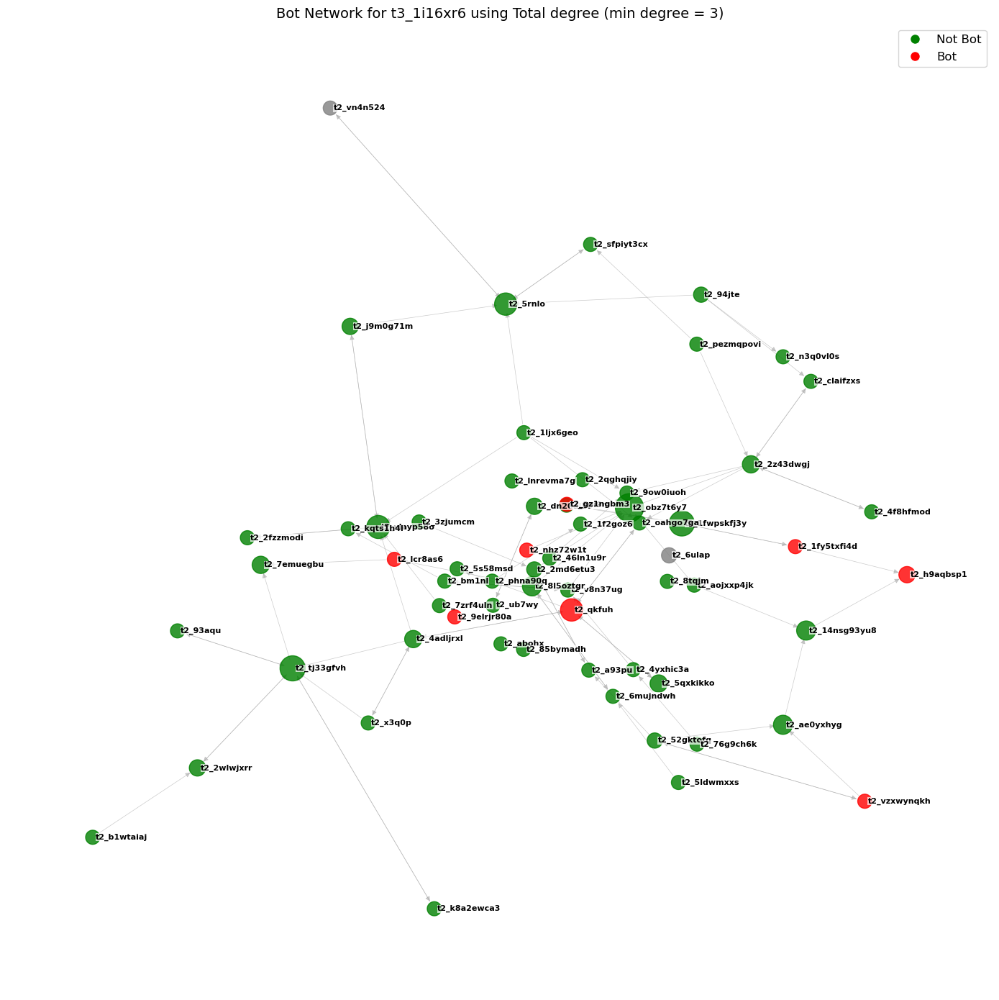

{'t2_wkhi0': 27, 't2_50qwilia': 5, 't2_g1wkr9ko': 16, 't2_8srss1tc': 3, 't2_7ux5p': 4, 't2_wgljp07ri': 0, 't2_68mk8': 21, 't2_rtcbcez3': 7, 't2_2r1n0yxy': 1, 't2_aog27': 1, 't2_eifhr289': 0, 't2_144qck6tre': 2, 't2_lfdvu17vy': 0, 't2_qpcs3vvhd': 3, 't2_fti29y3o': 0, 't2_9h50mel': 2, 't2_92qbwui4': 1, 't2_tp9fy': 8, 't2_8tywtppt': 0, 't2_1nowo3j': 1, 't2_eyrod': 0, 't2_76mb7eq3': 0, 't2_5rsphnm2': 0, 't2_6mu64070': 0, 't2_n9z98': 0, 't2_9912r298': 1, 't2_do78j': 0, 't2_3fnnq6ko': 0, 't2_a85m5': 1, 't2_s3f499yjv': 2, 't2_nua64h1i': 0, 't2_81g46187': 0, 't2_zb1rv': 0, 't2_4k1c42mc': 1, 't2_lfhd09gr': 3, 't2_rfpnw99': 6, 't2_i1c74g9s': 2, 't2_92qevfxw': 0, 't2_6wlzuqt1': 0, 't2_5q4ag1dd': 0, 't2_iobqbnqy': 0, 't2_t3sp5fuo': 0, 't2_gcuayagi': 0, 't2_al89sybsc': 0, 't2_19jbf1ux4c': 0, 't2_7m12dfc': 0, 't2_hhp2y': 0, 't2_t5iuv3gq': 0, 't2_dkpu7tlu': 0, 't2_126xgv': 0, 't2_13jfic': 0, 't2_17y8zpefr5': 0, 't2_pey8n': 0, 't2_aq4jl': 0, 't2_alv7u7l0t': 3, 't2_vn1azq0j0': 0, 't2_108c2006ct': 2, 't

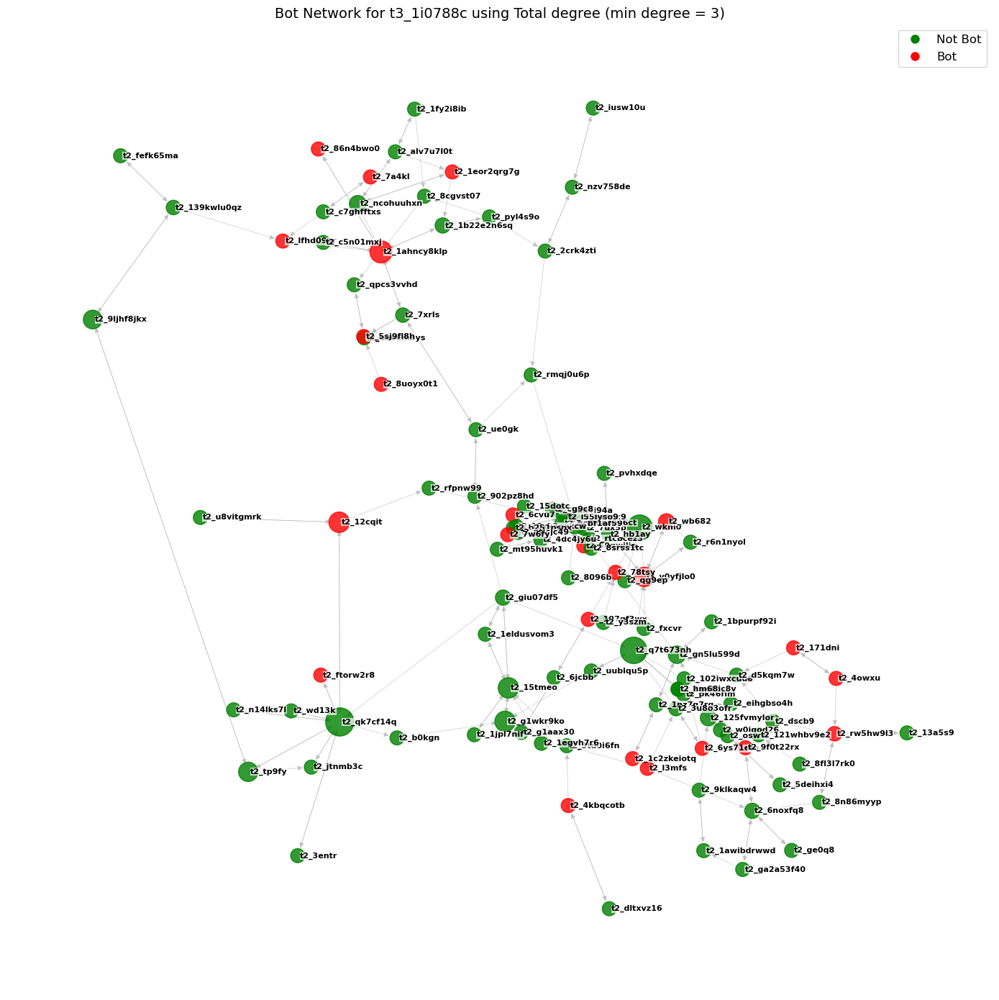

{'t2_mm7m0ccve': 8, 't2_oxub5tnr': 45, 't2_1kbebmiu': 13, 't2_9ourbvb': 38, 't2_u67rd0zep': 12, 't2_29iwtb62': 14, 't2_1cdvprap1d': 3, 't2_v9d2cnx4': 14, 't2_nhku54oy5': 18, 't2_tfejom8gc': 0, 't2_42gedjvv': 0, 't2_4140kyai': 6, 't2_sz3xedst': 1, 't2_ruj6avkh': 2, 't2_xntys': 1, 't2_5uvd2idm': 2, 't2_7bsnr8w3': 1, 't2_zyey9': 4, 't2_10ixnsyzhm': 0, 't2_w0eb509c': 2, 't2_9qth8gzn': 1, 't2_bl7qvhzk': 1, 't2_671ljczt': 5, 't2_smf1qihpc': 3, 't2_c9aojh9p': 1, 't2_1anqfaaqto': 2, 't2_4e3xjlq1': 1, 't2_ye3baij': 0, 't2_3iob4q00': 9, 't2_1hhsklhfbg': 3, 't2_umh9m4c3v': 0, 't2_84qqvx0z': 1, 't2_1fnw083m1x': 1, 't2_elqzuzmq': 1, 't2_brfo7sxm9': 4, 't2_vdi1zksh6': 0, 't2_70v8vmo': 1, 't2_et93i6rsc': 7, 't2_d7gp4qlt': 0, 't2_3vb2c4gt': 1, 't2_bl1o74cv': 1, 't2_896vsymd': 0, 't2_4w1o340l': 0, 't2_b9dm7kvp': 0, 't2_j6asa': 1, 't2_14pmw7diy5': 0, 't2_62dwji3e': 0, 't2_4ukze5bs': 0, 't2_afb7thbk': 0, 't2_l39uj5h5': 0, 't2_1idz8kov': 0, 't2_83x6mavq': 0, 't2_is0q0ow18': 0, 't2_129v6w95jh': 0, 't2_9lwy

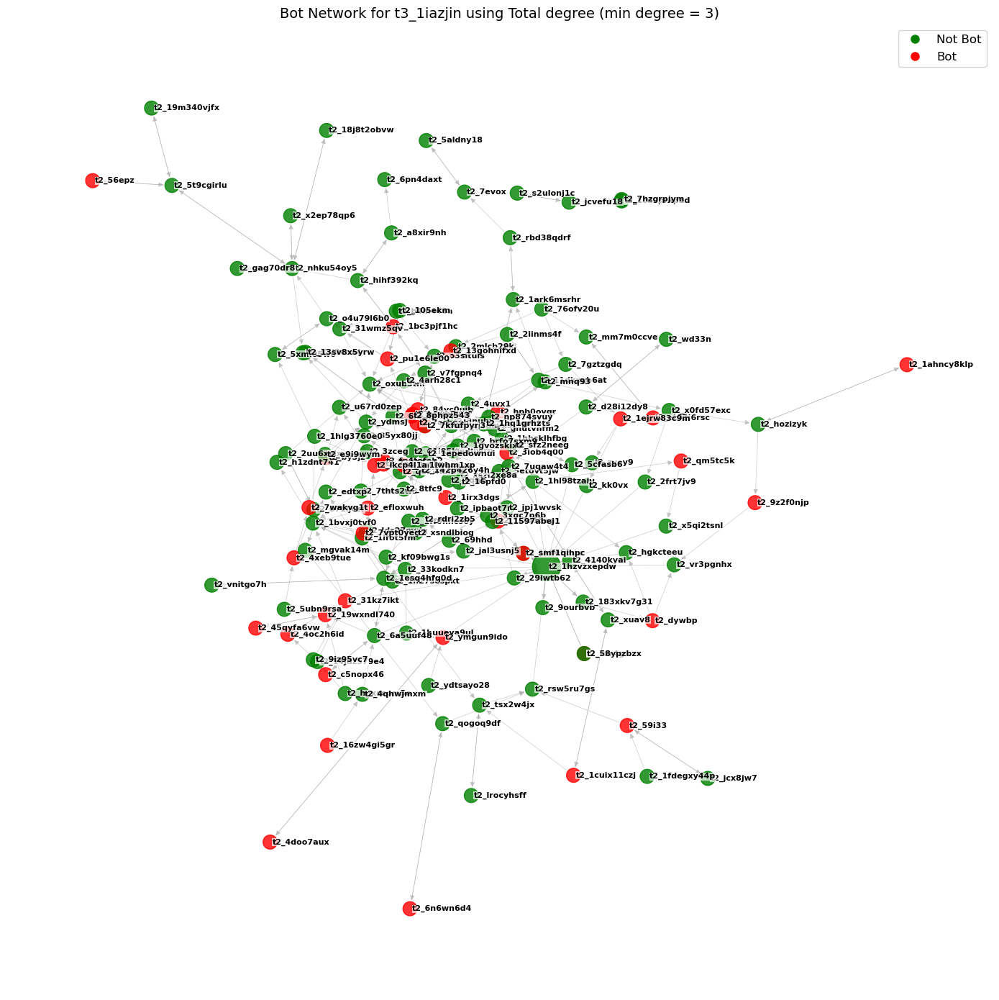

In [65]:
for post in posts:
    G, plot = plot_network_totaldegree(post, post_node_edge_dict, thr_70, min_degree = 3)
    top_betweenness(G)
    plot.show()

use k core to find the most important clustering

In [70]:
def plot_network_outdegree_kcore(post_id, dictionary, bot_classification, min_degree=1, k_core=None, seed=10000001):
    # Set random seed for reproducibility
    np.random.seed(seed)

    user_lst = dictionary[post_id]['user']
    weight_list = dictionary[post_id]['edge']

    # Create directed network graph from node list and weighted edge list
    G = nx.DiGraph()
    G.add_nodes_from(user_lst)
    G.add_weighted_edges_from(weight_list)  # Create a directed graph
    add_bot_attr(G, bot_classification)
      
    # Calculate node in-degrees and out-degrees
    in_degrees = defaultdict(int)
    out_degrees = defaultdict(int)

    for node in G.nodes():
        # Calculate sum of weighted in-degree and out-degree
        in_degree = G.in_degree(node, weight="weight")
        out_degree = G.out_degree(node, weight="weight")
    
        # Adjust for self-loops
        if G.has_edge(node, node):  
            self_loop_weight = G[node][node]["weight"]
            in_degree -= self_loop_weight
        
        in_degrees[node] = max(in_degree, 0)
        out_degrees[node] = out_degree

    # Remove self-loops
    G.remove_edges_from([(u, v) for u, v in G.edges() if u == v])
    
    # K-core decomposition
    if k_core is not None:
        # Compute k-core decomposition
        k_core_subgraph = nx.k_core(G, k=k_core)
        
        # If k_core is specified, use the k-core subgraph
        G = k_core_subgraph
        
        # Recompute degrees for k-core subgraph
        in_degrees = {node: G.in_degree(node, weight="weight") for node in G.nodes()}
        out_degrees = {node: G.out_degree(node, weight="weight") for node in G.nodes()}

    # Filter nodes based on degree
    nodes_to_remove = [node for node, degree in out_degrees.items() if degree < min_degree]
    G.remove_nodes_from(nodes_to_remove)
    
    # Degree normalization
    max_in_degree = max(in_degrees.values(), default=1)
    max_out_degree = max(out_degrees.values(), default=1)
    
    # Node size calculation
    min_size = 200  # Minimum node size
    normalized_in_degrees = {node: max(min_size, (deg / max_in_degree) * 800)
                             for node, deg in in_degrees.items()}
    normalized_out_degrees = {node: max(min_size, (deg / max_out_degree) * 800)
                             for node, deg in out_degrees.items()}
    
    # Node color based on bot classification
    node_colors = []
    for node in G.nodes():
        try:
            node_colors.append('Red' if bot_classification[node] else 'Green')
        except KeyError:
            node_colors.append('gray')
    
    # Create the plot
    plt.figure(figsize=(16, 16))  # Even larger figure
    
    # Layout algorithm
    pos = nx.kamada_kawai_layout(G, scale=10)
    
    # Draw edges
    nx.draw_networkx_edges(G, 
                          pos=pos, 
                          edge_color="darkgrey", 
                          width=0.5,
                          alpha=0.6, 
                          arrows=True)
    
    # Draw nodes
    nx.draw_networkx_nodes(G,
                          pos=pos,
                          node_color=node_colors,
                          node_size=[(normalized_in_degrees.get(node, 0) + normalized_out_degrees.get(node, 0)) * 0.5 for node in G.nodes()],
                          alpha=0.8)
    
    # Label positioning
    label_pos = {}
    for node in G.nodes():
        base_pos = pos[node]
        node_size_factor = normalized_out_degrees.get(node, 0) / 10000
        offset = max(0.05, node_size_factor * 0.1)
        label_pos[node] = (base_pos[0] + offset, base_pos[1])
    
    # Draw labels
    nx.draw_networkx_labels(G, 
                           label_pos, 
                           font_size=8,
                           font_color="black",
                           font_weight="bold",
                           horizontalalignment='left',
                           bbox={"facecolor": "white", 
                                 "edgecolor": "none",
                                 "alpha": 0.7,
                                 "pad": 0.2})
    
    # Add legend
    green_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Not Bot')
    red_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Bot')
    
    # Title and additional information
    title_text = f"Bot Network for {post_id}"
    if k_core is not None:
        title_text += f" (K-core = {k_core})"
    title_text += f" (min degree = {min_degree})"
    
    plt.title(title_text, fontsize=14)
    plt.legend(handles=[green_patch, red_patch], loc='upper right', fontsize=12)
    plt.axis('off')
    plt.tight_layout()
    
    # Return both the graph and the plot
    return G, plt

# Optional helper function to find the best k-core
def find_best_kcore(G):
    """
    Find the highest k-core with at least 2 nodes
    """
    max_k_core = 0
    for k in range(1, len(G.nodes()) + 1):
        try:
            k_core = nx.k_core(G, k=k)
            if len(k_core.nodes()) >= 2:
                max_k_core = k
            else:
                break
        except:
            break
    return max_k_core

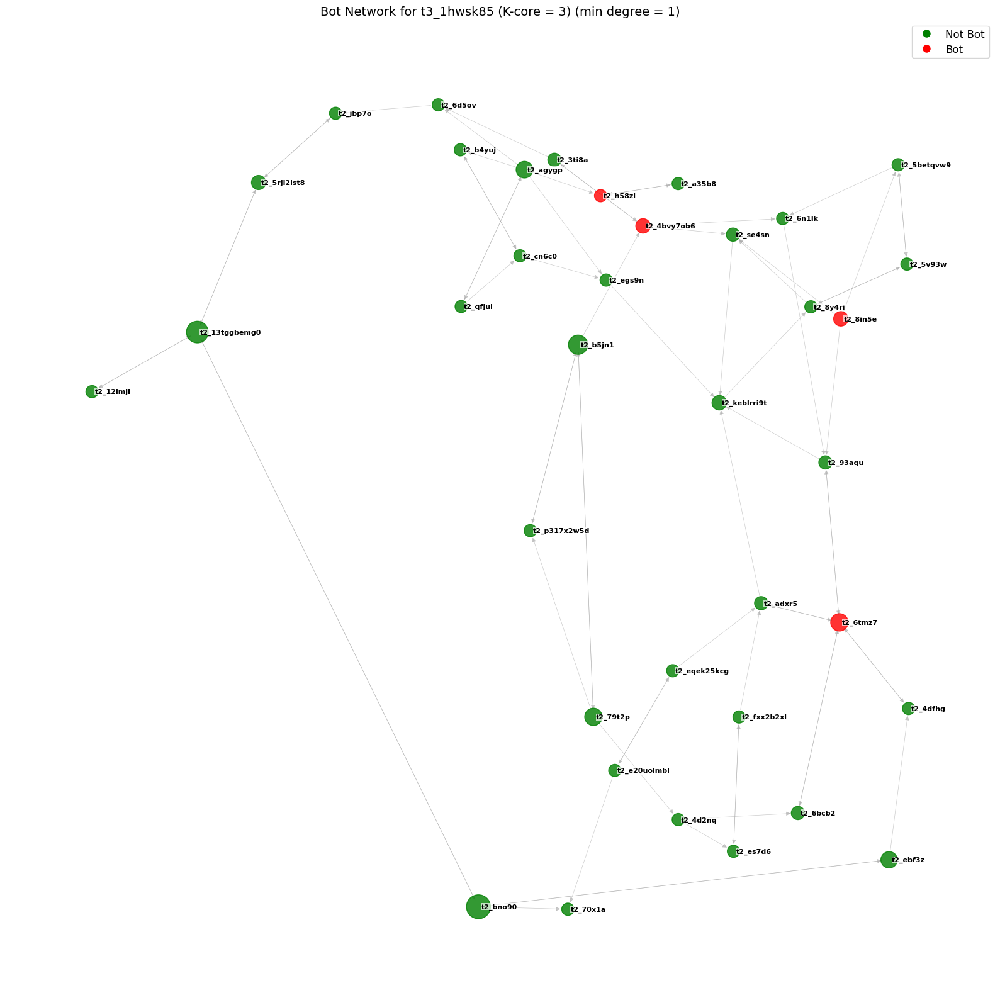

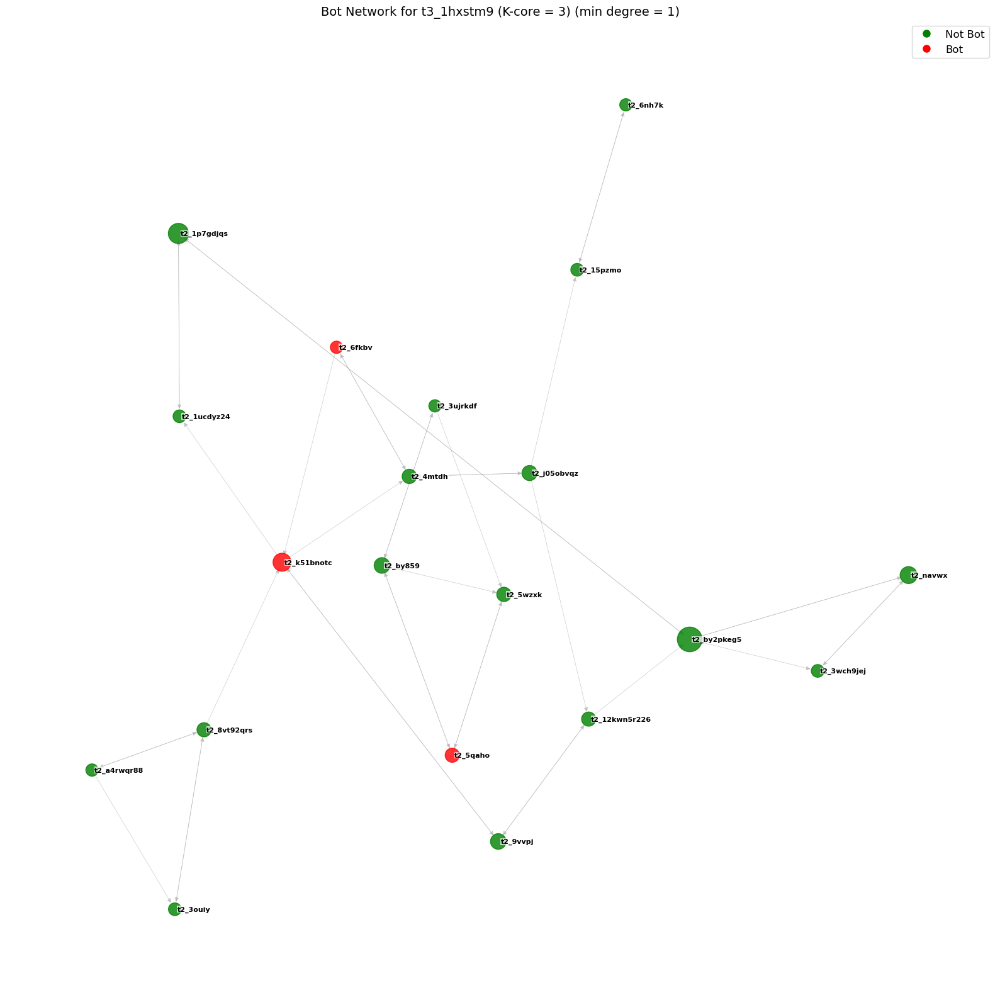

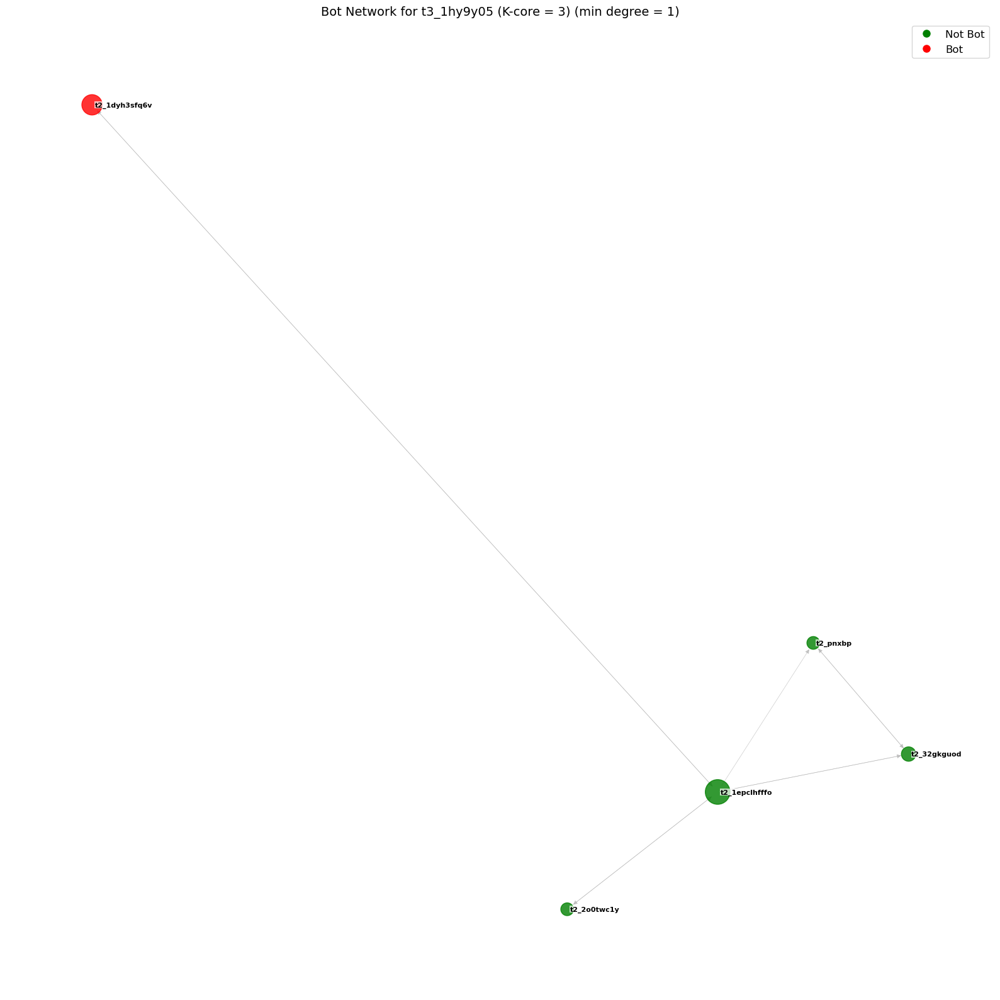

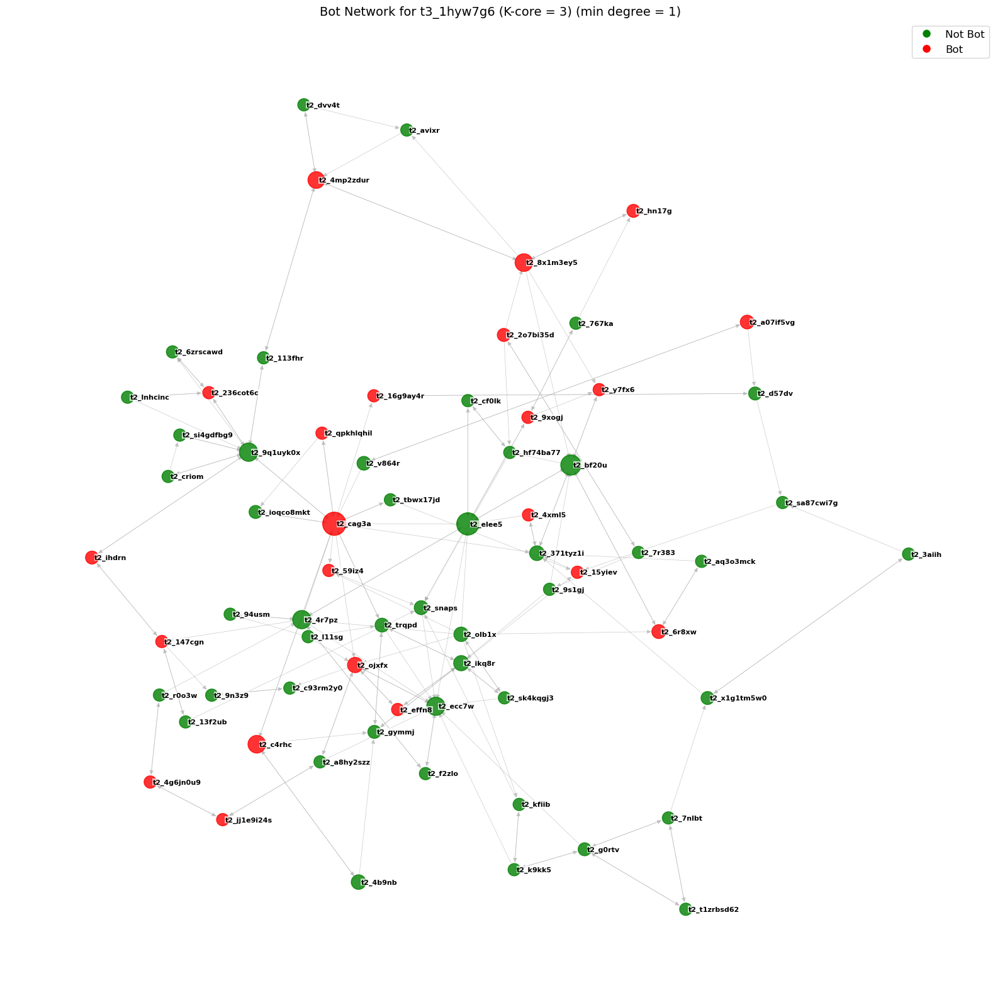

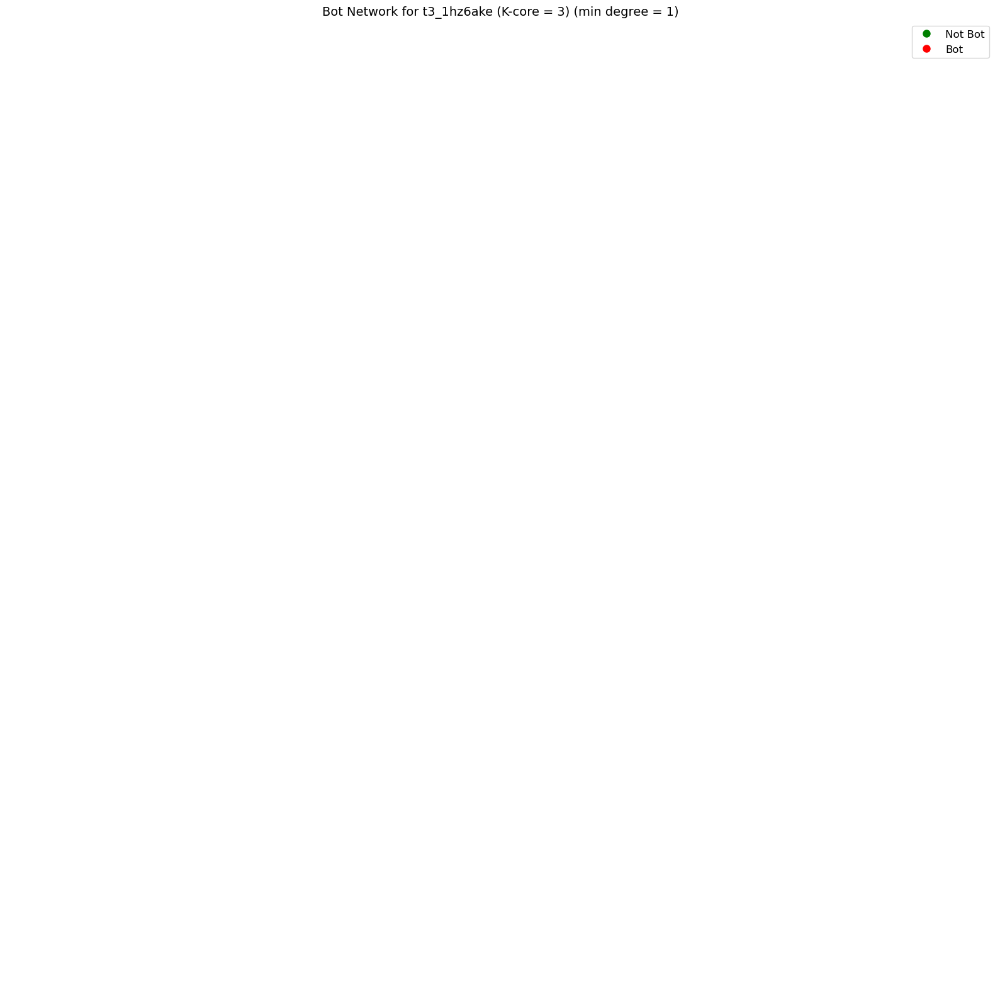

...

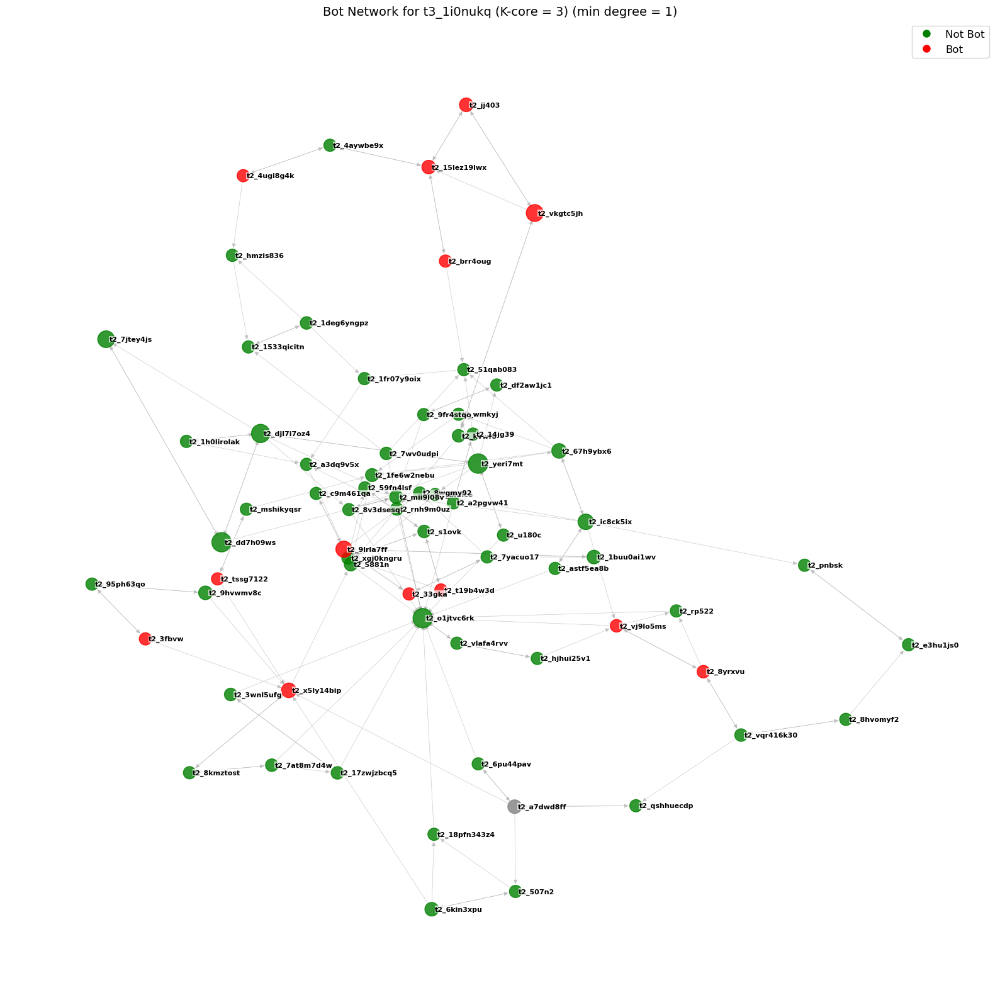

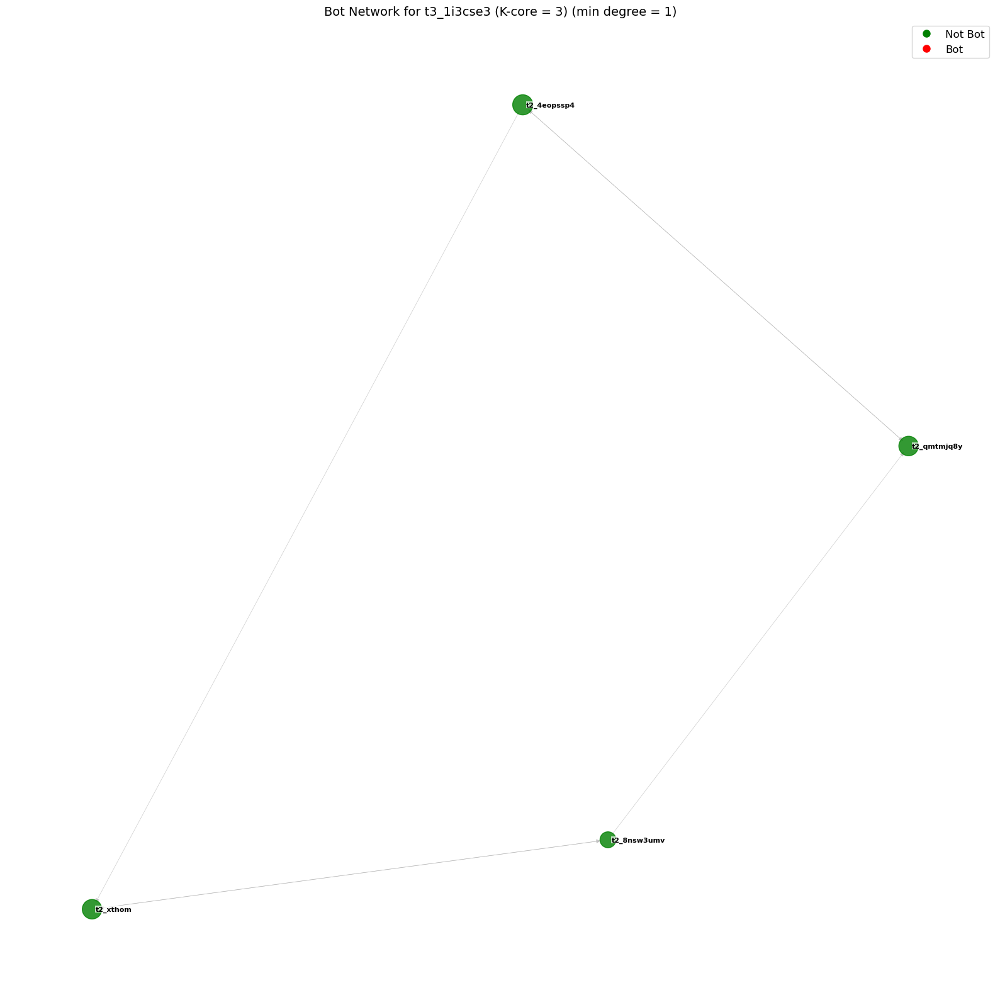

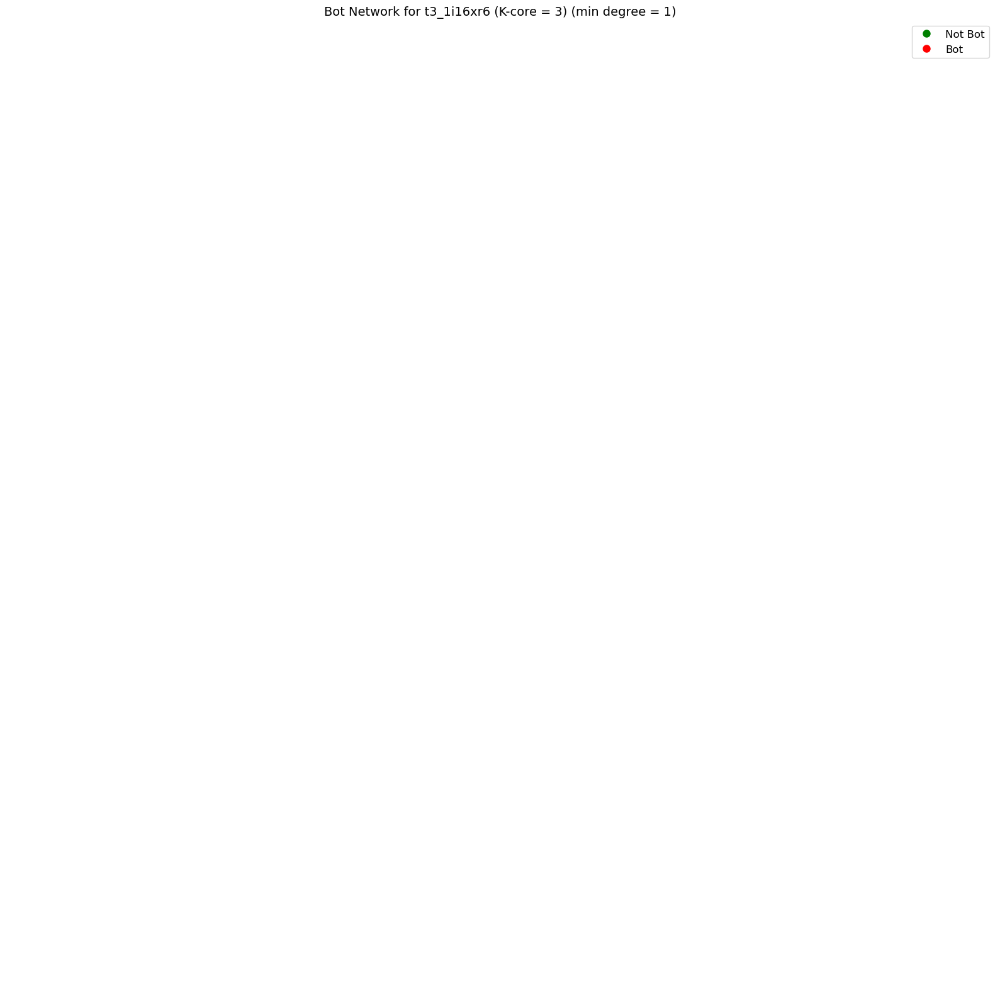

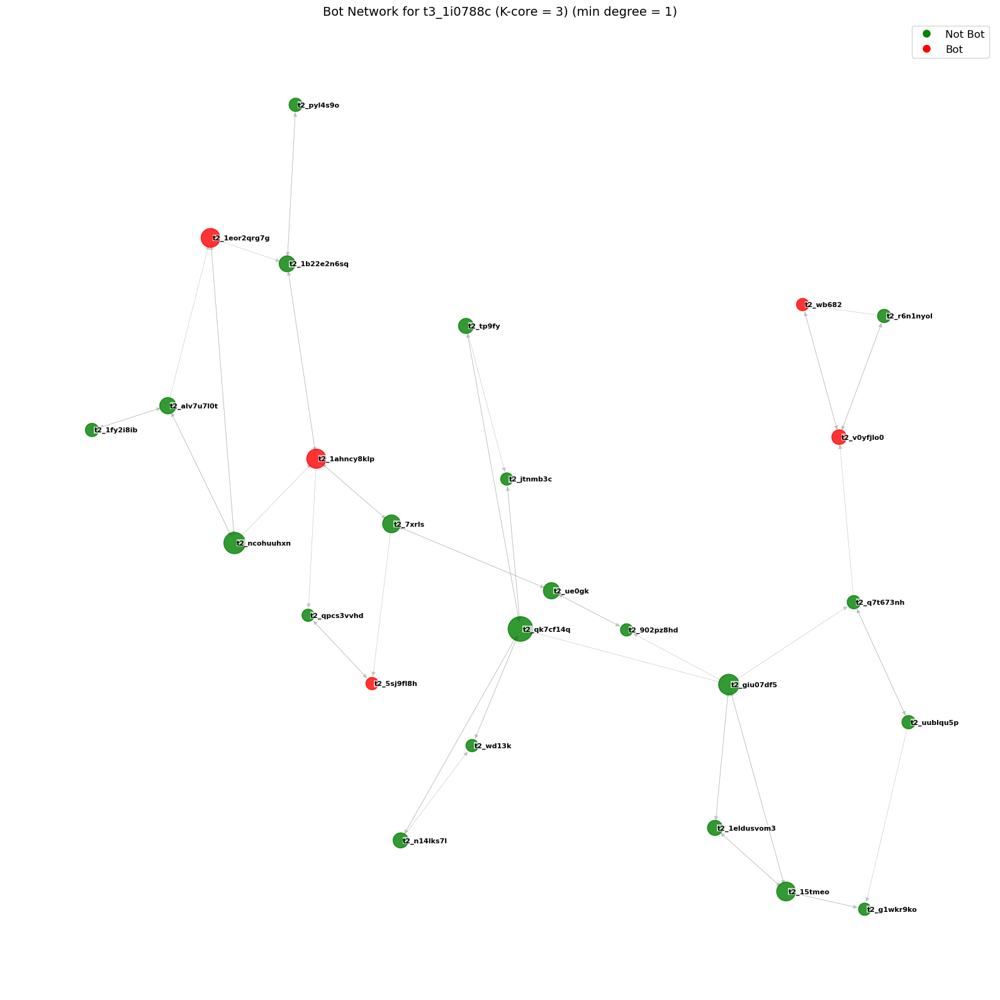

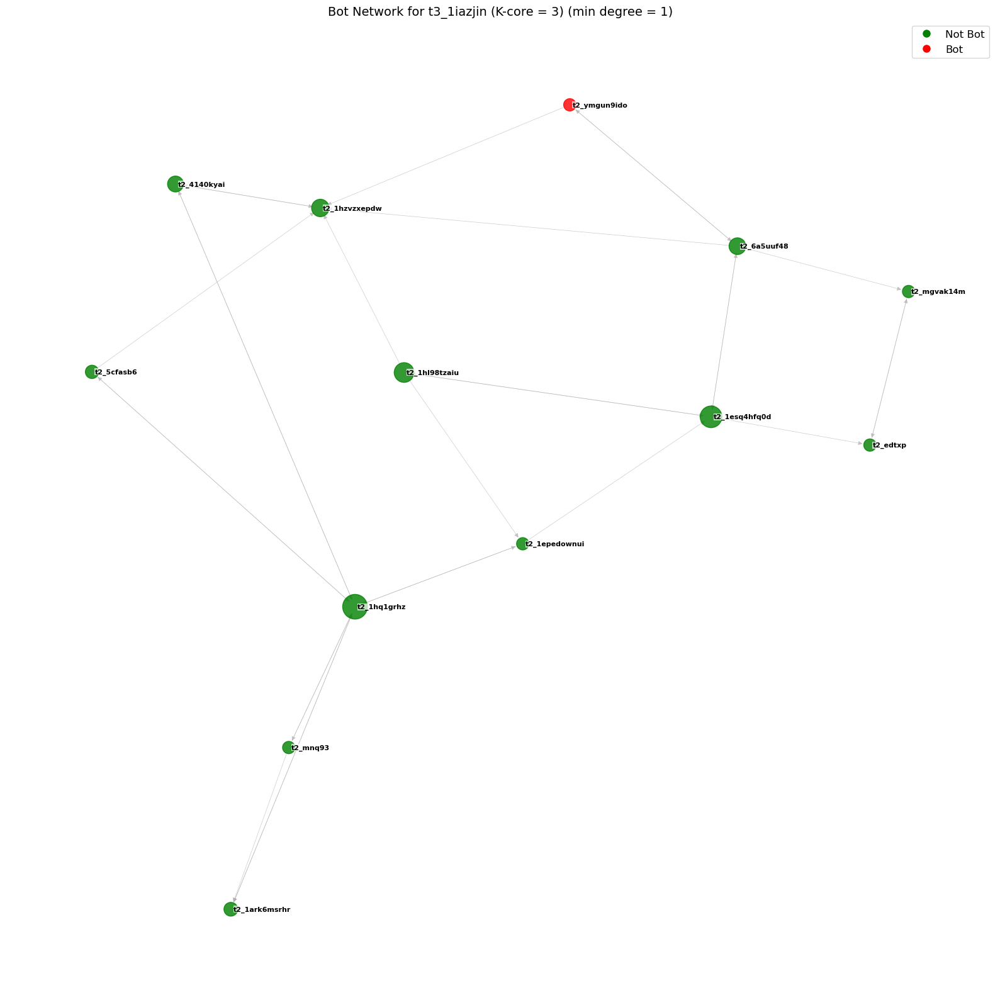

In [74]:
for post in posts:
    G, plot = plot_network_outdegree_kcore(post, post_node_edge_dict, thr_70, k_core=3)
    plot.show()

We also want to plot some graphs for the complete network of all posts we have:

In [42]:
complete_dict = dict()
for post_id in ['complete']:
    complete_dict[post_id] = {}
    complete_dict[post_id]['user'], complete_dict[post_id]['edge'] = compute_node_edge(post_id)

{'t2_mm7m0ccve': 7, 't2_oxub5tnr': 45, 't2_1kbebmiu': 13, 't2_9ourbvb': 38, 't2_u67rd0zep': 12, 't2_29iwtb62': 14, 't2_1cdvprap1d': 3, 't2_v9d2cnx4': 14, 't2_nhku54oy5': 16, 't2_tfejom8gc': 0, 't2_42gedjvv': 0, 't2_4140kyai': 4, 't2_sz3xedst': 1, 't2_ruj6avkh': 2, 't2_xntys': 1, 't2_5uvd2idm': 2, 't2_7bsnr8w3': 1, 't2_zyey9': 4, 't2_10ixnsyzhm': 0, 't2_w0eb509c': 2, 't2_9qth8gzn': 1, 't2_bl7qvhzk': 1, 't2_671ljczt': 4, 't2_smf1qihpc': 3, 't2_c9aojh9p': 1, 't2_1anqfaaqto': 2, 't2_4e3xjlq1': 1, 't2_ye3baij': 0, 't2_3iob4q00': 9, 't2_1hhsklhfbg': 3, 't2_umh9m4c3v': 0, 't2_84qqvx0z': 1, 't2_1fnw083m1x': 1, 't2_elqzuzmq': 1, 't2_brfo7sxm9': 3, 't2_vdi1zksh6': 0, 't2_70v8vmo': 5, 't2_et93i6rsc': 6, 't2_d7gp4qlt': 0, 't2_3vb2c4gt': 1, 't2_bl1o74cv': 1, 't2_896vsymd': 0, 't2_4w1o340l': 0, 't2_b9dm7kvp': 0, 't2_j6asa': 1, 't2_14pmw7diy5': 0, 't2_62dwji3e': 0, 't2_4ukze5bs': 0, 't2_afb7thbk': 0, 't2_l39uj5h5': 0, 't2_1idz8kov': 0, 't2_83x6mavq': 0, 't2_is0q0ow18': 0, 't2_129v6w95jh': 0, 't2_9lwy

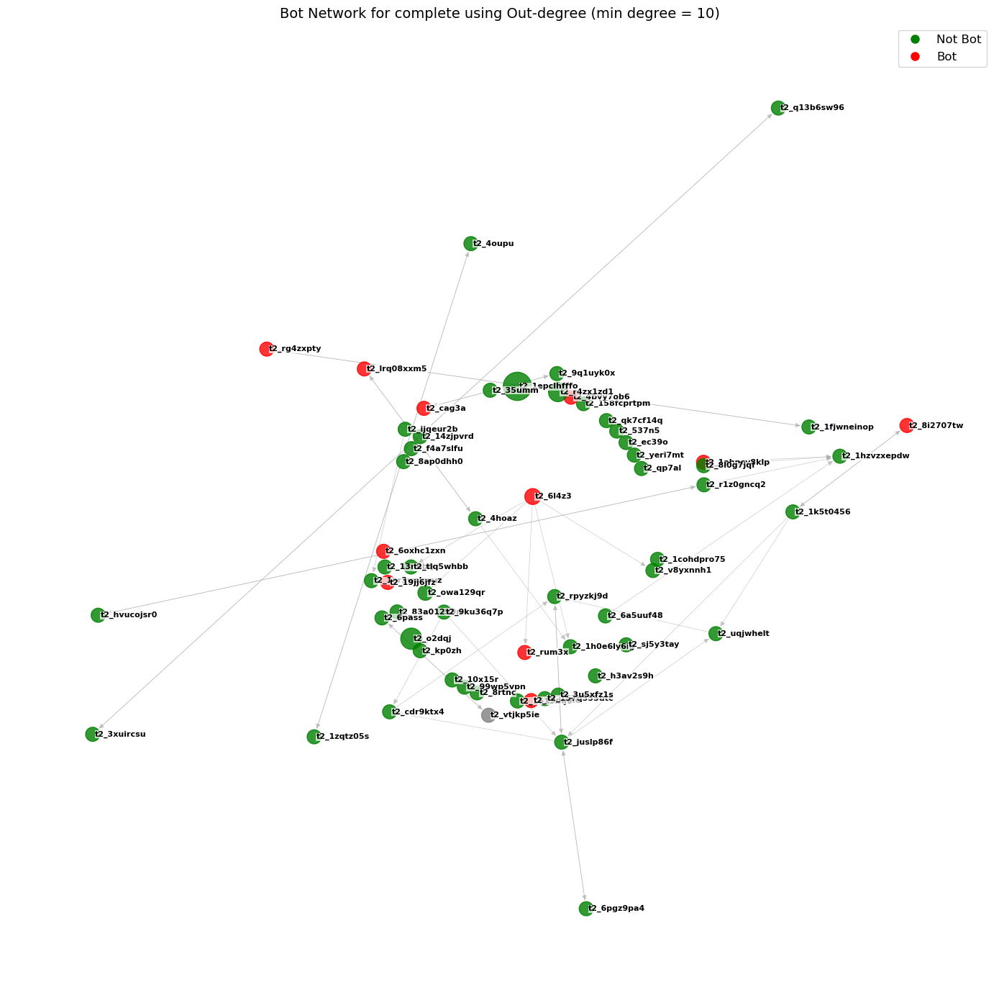

In [43]:
G, plot = plot_network_outdegree('complete', complete_dict, thr_70, min_degree = 10)
top_betweenness(G)
plot.show()

Initial Dictionary:
{'t2_oxub5tnr': 0.0, 't2_1kbebmiu': 0.0, 't2_9ourbvb': 0.0, 't2_u67rd0zep': 3.0608653066221824e-05, 't2_29iwtb62': 0.0, 't2_v9d2cnx4': 3.0608653066221824e-05, 't2_nhku54oy5': 0.0, 't2_84vc0uib': 0.0, 't2_7gztzgdq': 0.0, 't2_r1z0gncq2': 0.00018365191839733096, 't2_8kmztost': 0.00010330420409849865, 't2_8l0g7jqf': 4.591297959933274e-05, 't2_1hzvzxepdw': 0.0005968687347913255, 't2_by3jz': 0.0, 't2_ydmsj': 7.652163266555456e-06, 't2_1bvxj0tvf0': 0.0, 't2_rsw5ru7gs': 3.0608653066221824e-05, 't2_33kodkn7': 3.826081633277728e-05, 't2_qogoq9df': 0.0, 't2_19wxndl740': 0.0, 't2_9a7co': 0.0, 't2_o1jtvc6rk': 2.6782571432944097e-05, 't2_prtspyjr': 0.0, 't2_od2zf4y0e': 0.0, 't2_116bx9614x': 0.0, 't2_18pfn343z4': 5.3565142865888193e-05, 't2_7jzye': 0.0, 't2_4pnbl91y': 1.5304326533110912e-05, 't2_5881n': 2.295648979966637e-05, 't2_mii9l08v': 0.0, 't2_7at8m7d4w': 7.652163266555456e-06, 't2_x5ly14bip': 1.5304326533110912e-05, 't2_507n2': 0.0, 't2_1fe6w2nebu': 0.0, 't2_ec39o': 0.0, 't

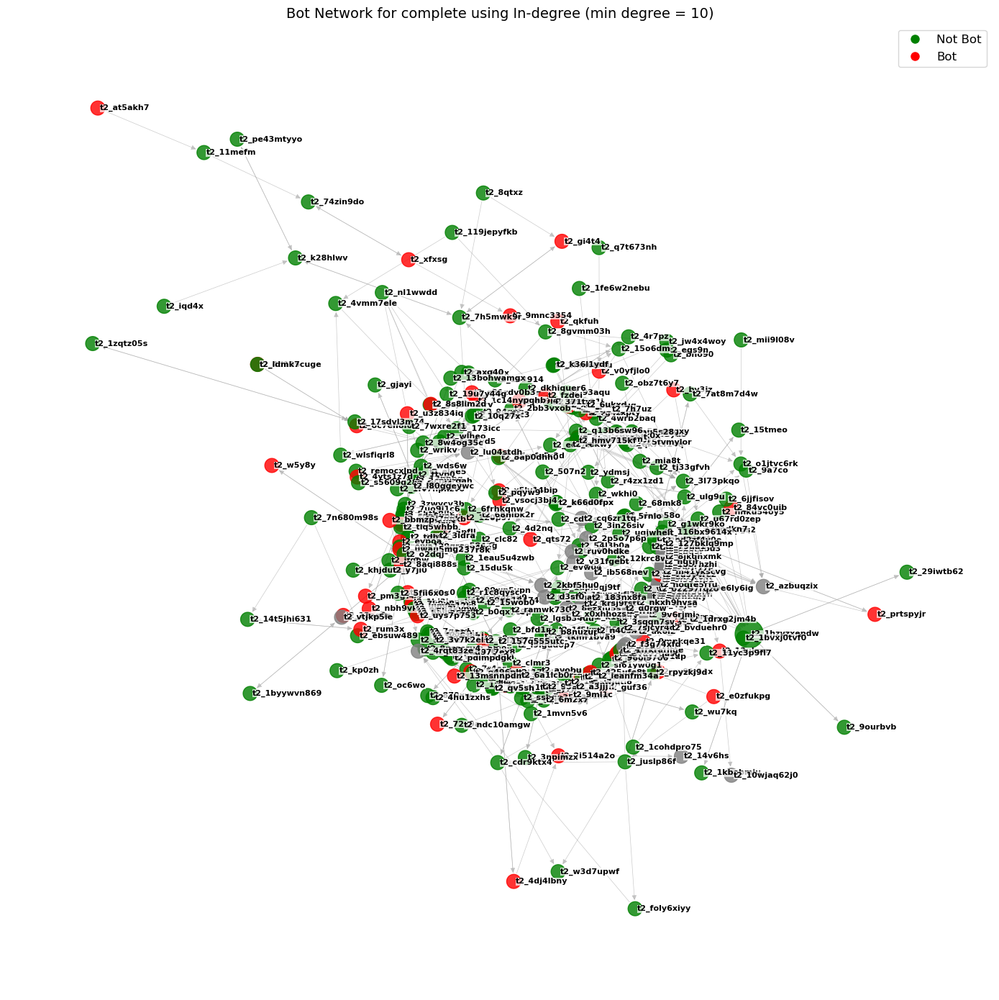

In [44]:
G, plot = plot_network_indegree('complete', complete_dict, thr_70, min_degree = 10)
top_betweenness(G)
plot.show()

Initial Dictionary:
{'t2_mm7m0ccve': 0.00012547786152263202, 't2_oxub5tnr': 0.0, 't2_1kbebmiu': 6.273893076131601e-06, 't2_9ourbvb': 0.0, 't2_u67rd0zep': 8.365190768175467e-06, 't2_29iwtb62': 0.0, 't2_v9d2cnx4': 8.365190768175467e-06, 't2_nhku54oy5': 0.0, 't2_3iob4q00': 0.0, 't2_70v8vmo': 0.0016671128101743028, 't2_vr3pgnhx': 8.365190768175467e-06, 't2_84vc0uib': 0.0, 't2_giu07df5': 4.705419807098701e-05, 't2_7gztzgdq': 0.0, 't2_r1z0gncq2': 0.002945234291068008, 't2_1dny0xwwnr': 6.692152614540374e-05, 't2_1hl98tzaiu': 4.182595384087734e-06, 't2_1ahncy8klp': 0.0, 't2_8kmztost': 5.96019842232502e-05, 't2_8l0g7jqf': 1.2547786152263202e-05, 't2_15q7epcd': 0.0, 't2_5fonf': 0.00015057343382715842, 't2_1hzvzxepdw': 0.000738228085291485, 't2_3xgc7p6b': 0.0, 't2_by3jz': 0.0, 't2_ydmsj': 2.091297692043867e-06, 't2_v7fgpnq4': 0.0, 't2_1bvxj0tvf0': 0.0, 't2_rsw5ru7gs': 1.6730381536350935e-05, 't2_33kodkn7': 1.6730381536350935e-05, 't2_6a5uuf48': 2.0912976920438668e-05, 't2_31kz7ikt': 0.0, 't2_x0fd

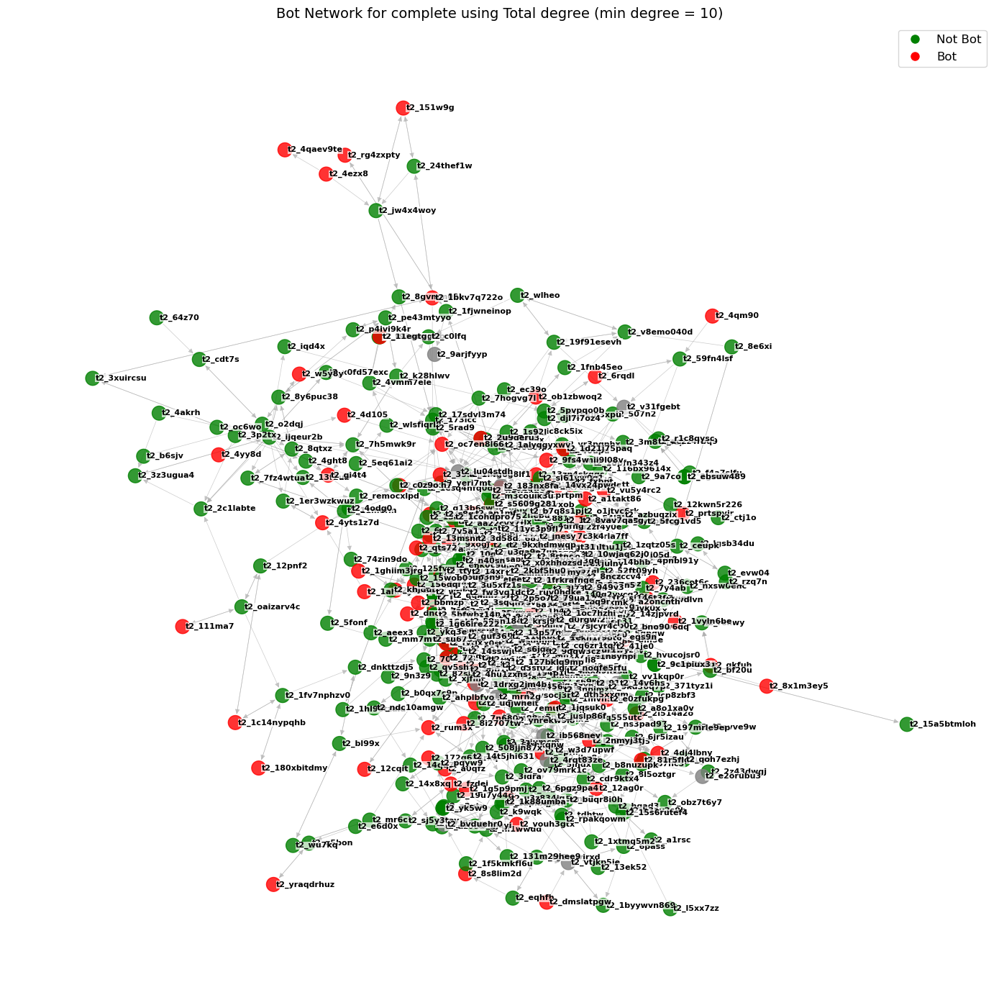

In [45]:
G, plot = plot_network_totaldegree('complete', complete_dict, thr_70, min_degree = 10)
top_betweenness(G)
plot.show()

### Descriptive Measures

In [48]:
def create_network(post_id, dictionary, bot_classification):
    user_lst = dictionary[post_id]['user']
    weight_list = dictionary[post_id]['edge']

    # Create directed network graph from node list and weighted edge list
    graph = nx.DiGraph()
    graph.add_nodes_from(user_lst)
    graph.add_weighted_edges_from(weight_list) # Create a directed graph
    add_bot_attr(graph, bot_classification)

    #G.remove_edges_from(list(G.selfloop_edges()))
    graph.remove_edges_from([(u, v) for u, v in graph.edges() if u == v])

    return graph

In [49]:
def compute_descriptive2(graph, post_id):
    # Calculate node in-degrees and out-degrees
    in_degrees = dict(graph.in_degree())
    out_degrees = dict(graph.out_degree())
    graph_copy = graph.copy()
    self_loops = list(nx.selfloop_edges(graph_copy))
    graph_copy.remove_edges_from(self_loops)

    adjusted_in_degrees = {node: in_degrees[node] - graph_copy[node][node]['weight'] if graph_copy.has_edge(node, node) else in_degrees[node]
                           for node in in_degrees}

    #max in-degree and out-degree
    max_in_degree = max(adjusted_in_degrees.values(), default=0)
    max_out_degree = max(out_degrees.values())
    reciprocity = nx.reciprocity(graph_copy)
    assortativity = nx.attribute_assortativity_coefficient(graph, 'botornot')
    transitivity = nx.transitivity(graph)
    avg_clustering = nx.average_clustering(graph)


    return [post_id, max_in_degree, max_out_degree, reciprocity, assortativity,
            transitivity, avg_clustering]
    

In [50]:
descriptive_stats = []
for post in posts:
    G = create_network(post, post_node_edge_dict, thr_70)
    row = compute_descriptive2(G, post)
    descriptive_stats.append(row)

descriptive_df = pd.DataFrame(descriptive_stats, columns = ['post', 'max_in_degree', 'max_out_degree', 'reciprocity', 'assortativity',
                                                            'transitivity', 'avg_clustering'])

In [51]:
descriptive_df

,post,max_in_degree,max_out_degree,reciprocity,assortativity,transitivity,avg_clustering
0,t3_1hwsk85,41,10,0.301370,-0.073982,0.019578,0.005354
1,t3_1hxstm9,38,10,0.324201,-0.056608,0.037500,0.015964
2,t3_1hy9y05,40,122,0.439306,-0.074534,0.000541,0.011112
3,t3_1hyw7g6,49,14,0.451128,0.094708,0.042254,0.027777
4,t3_1hz6ake,11,3,0.212389,-0.049072,0.000000,0.000000
5,t3_1i0kavt,30,54,0.400000,0.123002,0.006540,0.014686
6,t3_1i0nukq,131,14,0.311330,0.100039,0.043575,0.013306
7,t3_1i3cse3,10,5,0.339623,-0.112390,0.039474,0.008996
8,t3_1i16xr6,24,6,0.269113,0.006781,0.029167,0.009182
9,t3_1i0788c,28,12,0.365462,-0.017069,0.039185,0.009253


{'t2_lst66ur1': 4, 't2_2n48qjyu': 1, 't2_17f9e0pzj5': 1, 't2_xwl04xr9n': 1, 't2_15iyfhs017': 1, 't2_16f1is': 1, 't2_160u2g': 1, 't2_32gkguod': 3, 't2_l5w44in2': 1, 't2_893lfmel': 2, 't2_xwfvpcw': 1, 't2_9hykhbp8': 1, 't2_5h7n767h': 1, 't2_jjg3h': 1, 't2_tkfvnsmlc': 1, 't2_vxzt02yo': 1, 't2_21pou9l': 1, 't2_1dzen99sdg': 1, 't2_5vr45fj2': 1, 't2_5lj3fq27': 1, 't2_d40fzrfu': 0, 't2_18u6fvusrw': 1, 't2_sultjd6s': 0, 't2_dxrkv1fd': 1, 't2_jlldtrd6': 1, 't2_79l7v9h8': 1, 't2_xfe1h2g': 0, 't2_xdl2n': 1, 't2_oxvof62q': 1, 't2_3zqldkbh': 1, 't2_mrcrj0wmk': 0, 't2_7om79qj0': 0, 't2_o956zmg4': 0, 't2_ckx6uty6o': 1, 't2_bmgizsy0': 1, 't2_jkhwr850': 1, 't2_3wehk7rd': 0, 't2_70yoxszm6': 0, 't2_qwemm5tt9': 0, 't2_pmlho37n': 1, 't2_15lwqo': 2, 't2_aezy3neo': 0, 't2_18ielpwp4d': 0, 't2_qmuqabfk': 1, 't2_4p6vqu0z': 1, 't2_1e94970msg': 0, 't2_z4gns': 1, 't2_fdt7ejht': 1, 't2_11dqwk2ty9': 1, 't2_u1rad4nn': 1, 't2_58vju': 0, 't2_d9cki85': 1, 't2_32nncwf3': 1, 't2_uexwl3ebu': 1, 't2_25956vvb': 1, 't2_u9x7d'

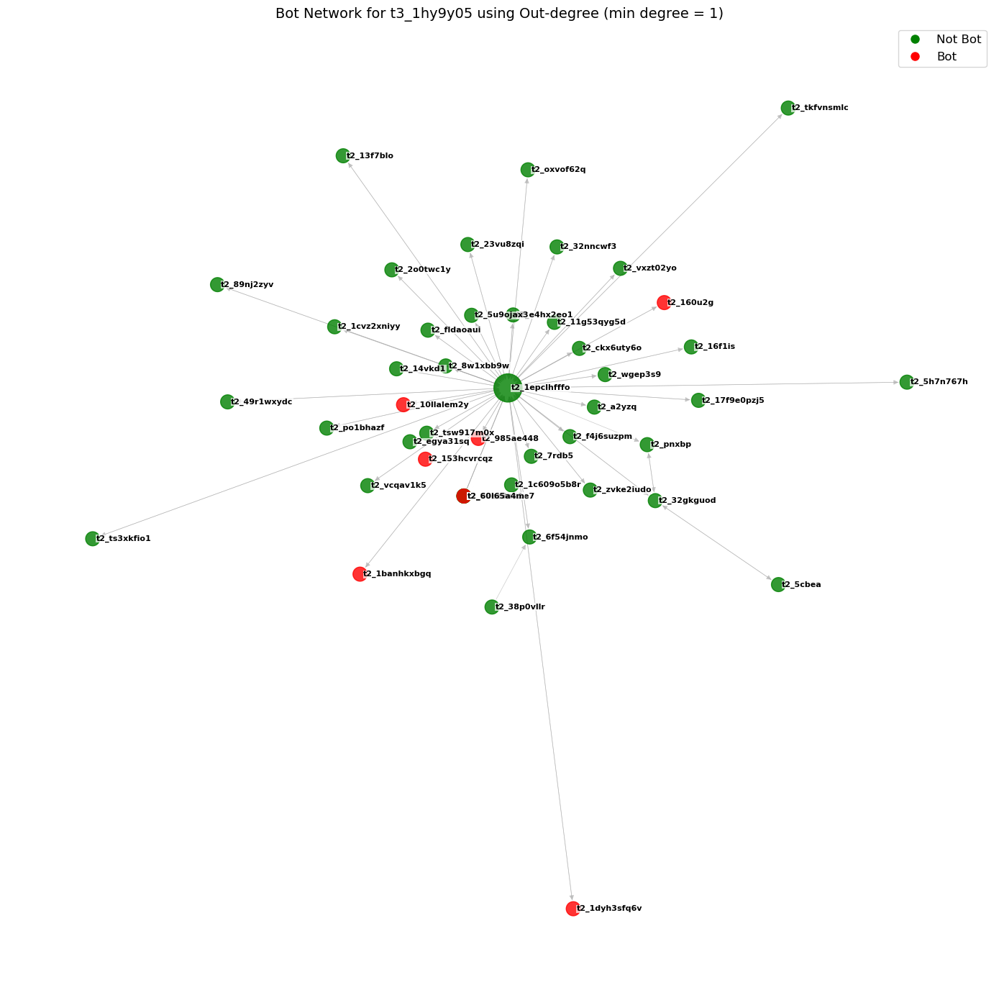

In [52]:
G, plot = plot_network_outdegree('t3_1hy9y05', post_node_edge_dict, thr_70, min_degree = 1)
top_betweenness(G)
plot.show()

Initial Dictionary:
{'t2_lst66ur1': 0.0, 't2_2n48qjyu': 0.0, 't2_17f9e0pzj5': 0.0, 't2_xwl04xr9n': 0.0, 't2_15iyfhs017': 0.0, 't2_16f1is': 0.0, 't2_160u2g': 0.0, 't2_32gkguod': 0.016481609993060375, 't2_l5w44in2': 0.0, 't2_893lfmel': 0.0, 't2_xwfvpcw': 0.0, 't2_9hykhbp8': 0.0, 't2_5h7n767h': 0.0, 't2_jjg3h': 0.0, 't2_tkfvnsmlc': 0.0, 't2_vxzt02yo': 0.0, 't2_21pou9l': 0.0, 't2_1dzen99sdg': 0.0, 't2_5vr45fj2': 0.0, 't2_5lj3fq27': 0.0, 't2_18u6fvusrw': 0.0, 't2_dxrkv1fd': 0.0, 't2_jlldtrd6': 0.0, 't2_79l7v9h8': 0.0, 't2_xdl2n': 0.0, 't2_oxvof62q': 0.0, 't2_3zqldkbh': 0.0, 't2_ckx6uty6o': 0.0, 't2_bmgizsy0': 0.0, 't2_jkhwr850': 0.0, 't2_pmlho37n': 0.0, 't2_15lwqo': 0.0, 't2_qmuqabfk': 0.0, 't2_4p6vqu0z': 0.0, 't2_z4gns': 0.0, 't2_fdt7ejht': 0.0, 't2_11dqwk2ty9': 0.0, 't2_u1rad4nn': 0.0, 't2_d9cki85': 0.0, 't2_32nncwf3': 0.0, 't2_uexwl3ebu': 0.0, 't2_25956vvb': 0.0, 't2_4dfqi4sf': 0.0, 't2_pnxbp': 0.0, 't2_1c04j5wx1p': 0.0, 't2_13832l': 0.0, 't2_23vu8zqi': 0.0, 't2_11g53qyg5d': 0.0, 't2_2o0

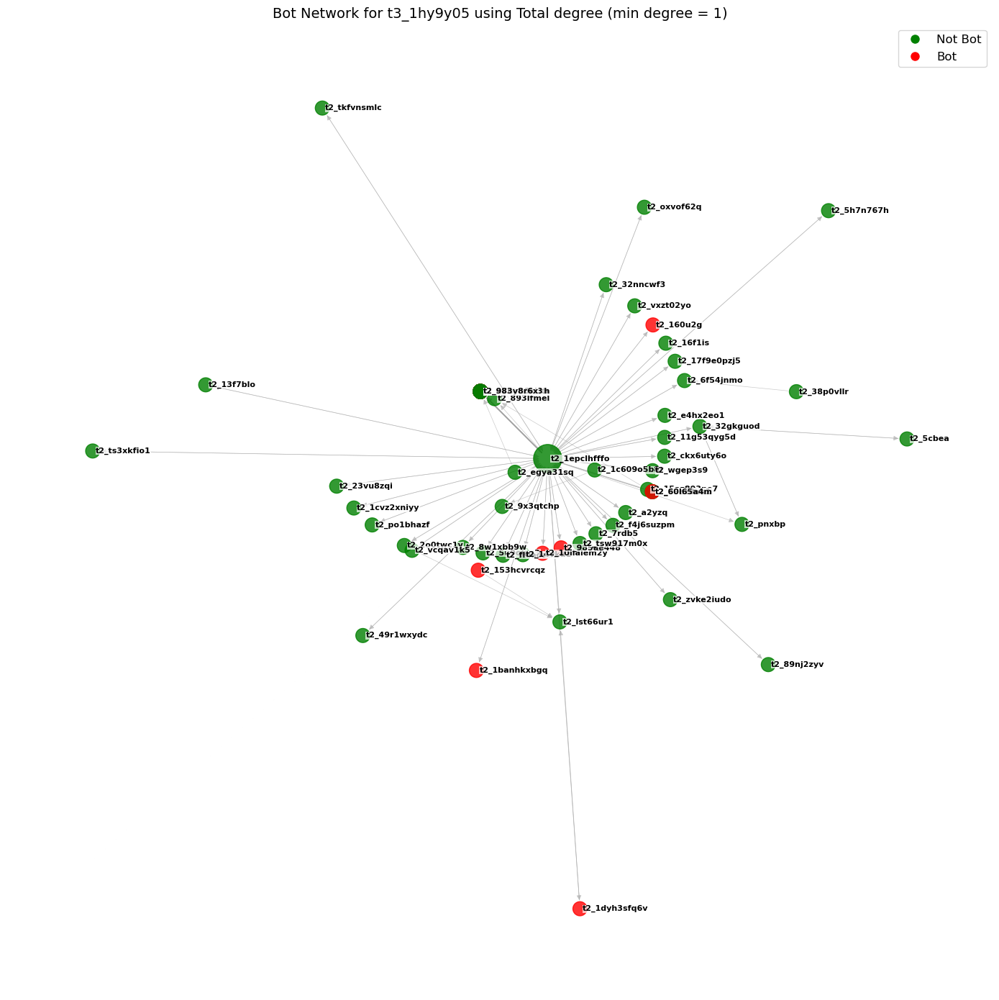

In [53]:
G, plot = plot_network_totaldegree('t3_1hy9y05', post_node_edge_dict, thr_70, min_degree = 1)
top_betweenness(G)
plot.show()

In [54]:
post_node_edge_dict['t3_1hy9y05']

{'user': ['t2_lst66ur1',
  't2_2n48qjyu',
  't2_17f9e0pzj5',
  't2_xwl04xr9n',
  't2_15iyfhs017',
  't2_16f1is',
  't2_160u2g',
  't2_32gkguod',
  't2_l5w44in2',
  't2_893lfmel',
  't2_xwfvpcw',
  't2_9hykhbp8',
  't2_5h7n767h',
  't2_jjg3h',
  't2_tkfvnsmlc',
  't2_vxzt02yo',
  't2_21pou9l',
  't2_1dzen99sdg',
  't2_5vr45fj2',
  't2_5lj3fq27',
  't2_d40fzrfu',
  't2_18u6fvusrw',
  't2_sultjd6s',
  't2_dxrkv1fd',
  't2_jlldtrd6',
  't2_79l7v9h8',
  't2_xfe1h2g',
  't2_xdl2n',
  't2_oxvof62q',
  't2_3zqldkbh',
  't2_mrcrj0wmk',
  't2_7om79qj0',
  't2_o956zmg4',
  't2_ckx6uty6o',
  't2_bmgizsy0',
  't2_jkhwr850',
  't2_3wehk7rd',
  't2_70yoxszm6',
  't2_qwemm5tt9',
  't2_pmlho37n',
  't2_15lwqo',
  't2_aezy3neo',
  't2_18ielpwp4d',
  't2_qmuqabfk',
  't2_4p6vqu0z',
  't2_1e94970msg',
  't2_z4gns',
  't2_fdt7ejht',
  't2_11dqwk2ty9',
  't2_u1rad4nn',
  't2_58vju',
  't2_d9cki85',
  't2_32nncwf3',
  't2_uexwl3ebu',
  't2_25956vvb',
  't2_u9x7d',
  't2_4dfqi4sf',
  't2_pnxbp',
  't2_1c04j5w

{'t2_ecc7w': 49, 't2_1l0vba': 4, 't2_3zjmkw4o': 0, 't2_12qxit': 3, 't2_5nvr3': 1, 't2_7mr4cit64': 0, 't2_3v43v': 3, 't2_9q1uyk0x': 18, 't2_avixr': 4, 't2_y766d5u': 0, 't2_1rcyp6dn': 0, 't2_4bdn7': 0, 't2_6hn4qx80': 1, 't2_4ewh6': 1, 't2_650y4': 2, 't2_l71t9wx': 1, 't2_218nwxgu': 0, 't2_5wc9j': 1, 't2_1dcfngcq': 1, 't2_a505e2et': 0, 't2_13n7xt': 0, 't2_swmu0': 1, 't2_52pll': 0, 't2_5bmil': 1, 't2_1ei1ktx': 0, 't2_767ka': 1, 't2_3khg3rlc': 0, 't2_p7lpi': 0, 't2_fhm4r4mx': 1, 't2_c8q59qv8': 0, 't2_d54dq': 1, 't2_bpo6v': 0, 't2_rekwy': 9, 't2_o6l86408b': 0, 't2_d2wo3ejh': 0, 't2_qrb8r0j6y': 0, 't2_nz02fnk2o': 0, 't2_6pj2yd0': 0, 't2_l3t535ex': 0, 't2_em8gh': 2, 't2_alr25': 1, 't2_bob60jxc': 2, 't2_6giv23h9y': 1, 't2_uiuvv': 1, 't2_hn17g': 5, 't2_1yw3ltzu': 0, 't2_3d6zu3t5': 0, 't2_148ktz': 0, 't2_16w2v6mlhn': 0, 't2_7qgo7': 0, 't2_ow9nx': 0, 't2_3w75p': 0, 't2_6241x': 0, 't2_dtohn': 0, 't2_ch74j': 0, 't2_165uj0z3': 0, 't2_c4b7j': 0, 't2_l4k8xo8q': 1, 't2_17bslo': 0, 't2_1j6w0hj': 1, 't2_q7

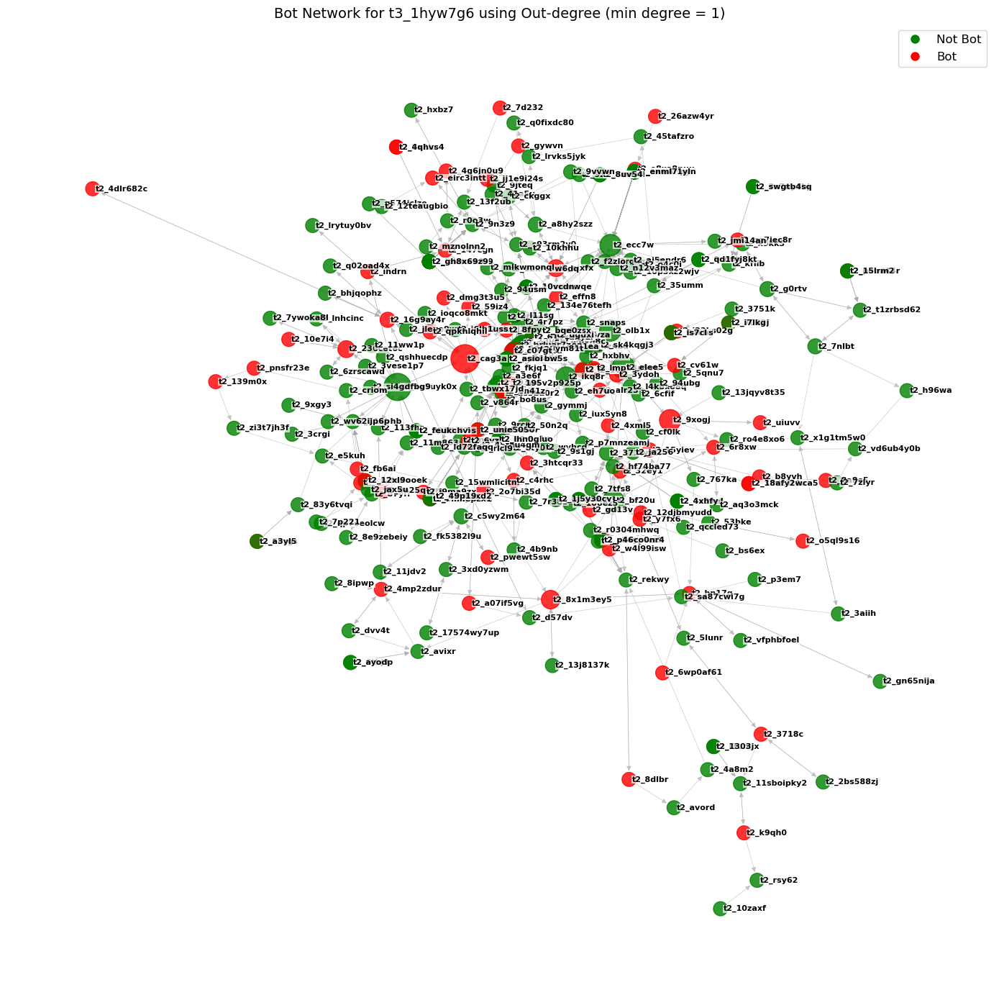

In [55]:
G, plot = plot_network_outdegree('t3_1hyw7g6', post_node_edge_dict, thr_70, min_degree = 1)
top_betweenness(G)
plot.show()

In [56]:
G = create_network('complete', complete_dict, thr_70)

In [ ]:
whole_network_stats = compute_descriptive2(G, 'complete')
whole_network_stats.extend([nx.betweenness_centrality(G, normalized=True, weight= None, endpoints=False, seed=0), nx.degree_centrality(G)])

In [156]:
whole_network_stats

['complete',
 49,
 13,
 0.4878048780487805,
 0.06188247529901207,
 0.047379032258064516,
 0.03335806606188731,
 {'t2_ecc7w': 0.08542478069377206,
  't2_9q1uyk0x': 0.08900177750276031,
  't2_avixr': 0.0022021621228114877,
  't2_767ka': 0.008281160897365901,
  't2_fhm4r4mx': 0.0,
  't2_d54dq': 0.0,
  't2_rekwy': 0.006906781203363302,
  't2_alr25': 0.0,
  't2_uiuvv': 0.0,
  't2_hn17g': 0.011125620305997404,
  't2_l4k8xo8q': 0.0,
  't2_y7fx6': 0.0013975842948834615,
  't2_3jmnm': 0.0,
  't2_10tp3n': 0.0,
  't2_3x7nydbj': 0.0,
  't2_lmp23u5vk': 0.0,
  't2_p7mnzeamj': 0.00012739780875768936,
  't2_k9kk5': 0.016670003275943656,
  't2_qfdyi': 0.00015469733920576566,
  't2_e8xa8nuu': 0.001110180904888436,
  't2_cpe7p': 0.0,
  't2_gn65nija': 0.0,
  't2_3718c': 0.009827830961307465,
  't2_114bhb': 0.011948094492774725,
  't2_4znad': 0.0,
  't2_17574wy7up': 0.0,
  't2_qg7iec8r': 0.0,
  't2_gve93q7i': 3.639937393076839e-05,
  't2_696mcpsd': 0.0,
  't2_4r7pz': 0.10503100013346438,
  't2_a8hy2szz': 0

In [159]:
total = 0
bot_count = 0
bot_betweenness = []
human_betweenness = []
for key, value in whole_network_stats[7].items():
    if value > 0:
        total += 1
        if key in thr_70:
            if thr_70[key]:
                bot_count += 1
                bot_betweenness.append(value)
            else:
                human_betweenness.append(value)
bot_count / total

0.325

In [62]:
import seaborn as sns

In [161]:
human_betweenness_data = pd.DataFrame(human_betweenness, columns=['betweenness'])
human_betweenness_data['humanorbot'] = 'human'
bot_betweenness_data = pd.DataFrame(bot_betweenness, columns=['betweenness'])
bot_betweenness_data['humanorbot'] = 'bot'
betweenness_data = pd.concat([human_betweenness_data, bot_betweenness_data]).reset_index()
del betweenness_data['index']

In [162]:
betweenness_data[:10]

,betweenness,humanorbot
0,0.085425,human
1,0.089002,human
2,0.002202,human
3,0.008281,human
4,0.006907,human
5,0.000127,human
6,0.016670,human
7,0.000155,human
8,0.011948,human
9,0.105031,human


In [148]:
betweenness_data[-10:]

,betweenness,humanorbot
110,0.005405,bot
111,0.004614,bot
112,0.017769,bot
113,0.001110,bot
114,0.006497,bot
115,0.001110,bot
116,0.003698,bot
117,0.002690,bot
118,0.013923,bot
119,0.000018,bot


In [ ]:
betweenness_data['betweenness'] =(betweenness_data['betweenness']-betweenness_data['betweenness'].mean())/betweenness_data['betweenness'].std()

In [ ]:
betweenness_data[:10]

,betweenness,humanorbot
0,0.252861,human
1,0.244008,human
2,-0.050714,human
3,0.006730,human
4,-0.006665,human
5,-0.047092,human
6,-0.114045,human
7,0.078974,human
8,0.232271,human
9,25.545159,human


In [ ]:
sns.histplot(betweenness_data, x="betweenness", hue="humanorbot")

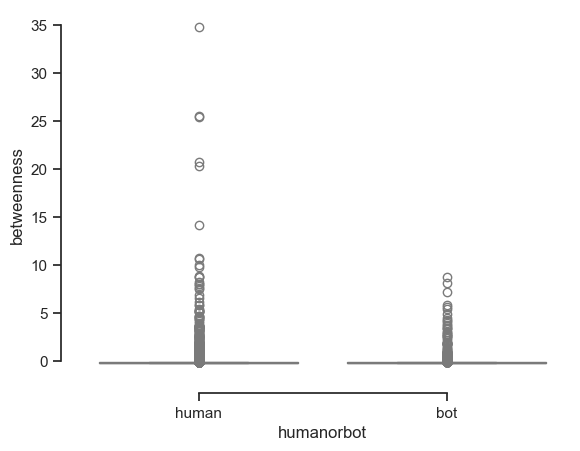

In [ ]:
sns.set_theme(style="ticks", palette="pastel")

# Load the example tips dataset
tips = sns.load_dataset("tips")

# Draw a nested boxplot to show bills by day and time
sns.boxplot(x ='humanorbot', y="betweenness",
            data=betweenness_data)
sns.despine(offset=10, trim=True)

In [ ]:
total = 0
bot_count = 0
bot_betweenness = []
human_betweenness = []
mean = sum(whole_network_stats[7].values()) / len(whole_network_stats[7])
for key, value in whole_network_stats[7].items():
    if value > 0.002:
        total += 1
        if key in thr_70:
            if thr_70[key]:
                bot_count += 1
                bot_betweenness.append(value)
            else:
                human_betweenness.append(value)
bot_count / total

0.2247191011235955

In [ ]:
human_betweenness_data = pd.DataFrame(human_betweenness, columns=['betweenness'])
human_betweenness_data['humanorbot'] = 'human'
bot_betweenness_data = pd.DataFrame(bot_betweenness, columns=['betweenness'])
bot_betweenness_data['humanorbot'] = 'bot'
betweenness_data = pd.concat([human_betweenness_data, bot_betweenness_data]).reset_index()
del betweenness_data['index']

In [ ]:
betweenness_data['betweenness'] =(betweenness_data['betweenness']-betweenness_data['betweenness'].mean())/betweenness_data['betweenness'].std()

<Axes: xlabel='betweenness', ylabel='Count'>

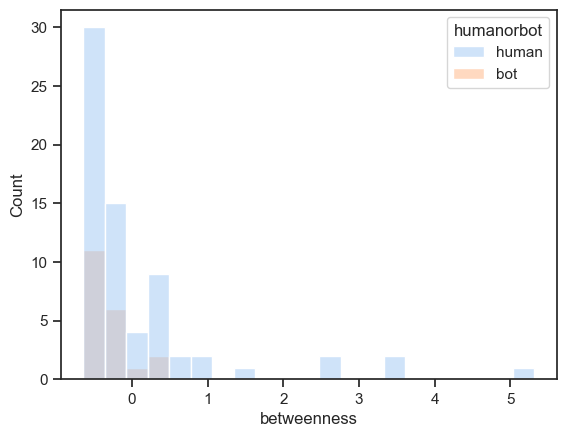

In [ ]:
sns.histplot(betweenness_data, x="betweenness", hue="humanorbot")

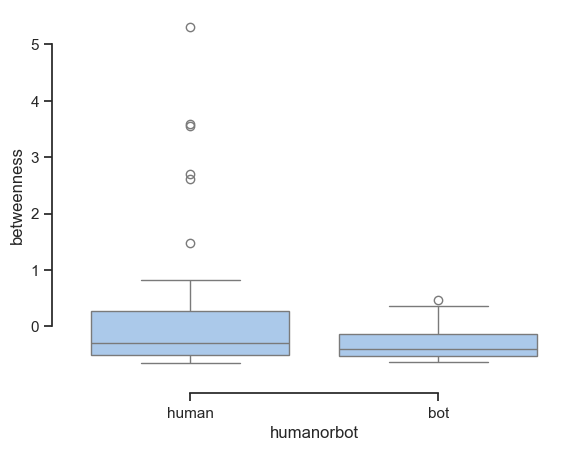

In [ ]:
sns.set_theme(style="ticks", palette="pastel")

# Load the example tips dataset
tips = sns.load_dataset("tips")

# Draw a nested boxplot to show bills by day and time
sns.boxplot(x ='humanorbot', y="betweenness",
            data=betweenness_data)
sns.despine(offset=10, trim=True)

### End 